## This notebook creates fits for all settings, with a given number of states for both 2pt/3pt and sum-sub/FH, and the same prior for all samples

In [140]:
import numpy as np
import matplotlib.pyplot as plt

In [141]:
import gvar as gv
import h5py
import lsqfit
import h5data_methods as h5_dm

In [142]:
import pickle

In [143]:
# Constants

#Physical constants
hbarc = 197.3 # MeV fm
a = 0.12

# Pion mass
mpi = 0.1885
#mpi = 0.2

# Plot constants
t_min_plt = 1
t_max_plt = 25

# Array of tsep values
tsep_vals = np.arange(3,13,1)
tsep_vals

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

### Define functions

In [144]:
def Ei(n_selec, p):
    Ea = p['E0']
    for l in range(1, n_selec+1):
        Ea += p['dE{}'.format(l)]
        
    #print(Ea)
    return Ea

In [146]:
num_zs = 1 #Order number of the n's
# Log E: log of the energy.  
# P is point (in the context of )

def C_2pt(t, p):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_pp = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.transpose(np.array([[sum_pp], [sum_ps]]), axes=[2,0,1])

def C_2pt_SS(t, p):
    
    z = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_ss = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.array(sum_ss)

def C_2pt_PS(t, p):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    #print("z: ", z)
    #print("ztilde: ", ztilde)
    
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.array(sum_ps)

In [147]:
# Precondition: t is a 1-D numpy array of 2-element array like objects t[i] = (t_sep, tau)
  
    
def C_3pt_A3(t, p):
    #tsep = np.array([np.array([t[i][j][0] for j in range(len(t[i]))]) for i in range(len(t))])
    #tau = np.array([np.array([t[i][j][1] for j in range(len(t[i]))]) for i in range(len(t))])
    tsep, tau = np.transpose(t)
    #print("tsep: ", tsep)
    #print("tau: ", tau)
    
    result = p['Z0']*p['gA3_00']*p['Z0']*np.exp(-p["E0"]*tsep)*np.exp(-(p["E0"] - p["E0"])*tau)
    
    n = 0
    m = 0
    
    if num_zs == 1:
        return result
    
    m += 1
    while n < num_zs:    
        En = Ei(n, p)
        Em = Ei(m, p) 
        #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        if m > n:
            result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        else:
            result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
            
        m += 1
        if m >= num_zs:
            m = 0
            n += 1
            
    #for n in range(num_zs):
        #for m in range(num_zs):
            #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-p["E{}".format(n)]*tsep)*np.exp(-(p["E{}".format(m)] - p["E{}".format(n)])*tau)
            # print out the dictionary indices which are called in this summation
            #print("n = ", n, "; m = ", m)
            #print('Z{}'.format(n), "*", 'gA3_{0}{1}'.format(n, m), "*", 'Z{}'.format(m), "*e^(-tsep*", "E{}".format(n), ")*e^(-tau*(", "E{}".format(m), "-", "E{}".format(n), ")")
            
    return result



def C_3pt_V4(t, p):
    #tsep = np.array([np.array([t[i][j][0] for j in range(len(t[i]))]) for i in range(len(t))])
    #tau = np.array([np.array([t[i][j][1] for j in range(len(t[i]))]) for i in range(len(t))])
    tsep, tau = np.transpose(t)
    #print("tsep: ", tsep)
    #print("tau: ", tau)
    
    result = p['Z0']*p['gV4_00']*p['Z0']*np.exp(-p["E0"]*tsep)*np.exp(-(p["E0"] - p["E0"])*tau)
    
    n = 0
    m = 0
    if num_zs == 1:
        return result
    
    m += 1
    while n < num_zs:
        En = Ei(n, p)
        Em = Ei(m, p)
        #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        if m > n:
            result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        else:
            result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
            
        m += 1
        if m >= num_zs:
            m = 0
            n += 1
    
    
    #for n in range(num_zs):
        #for m in range(num_zs):
            #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-p["E{}".format(n)]*tsep)*np.exp(-(p["E{}".format(m)] - p["E{}".format(n)])*tau)
            # print out the dictionary indices which are called in this summation
            #print("n = ", n, "; m = ", m)
            #print('Z{}'.format(n), "*", 'gV4_{0}{1}'.format(n, m), "*", 'Z{}'.format(m), "*e^(-tsep*", "E{}".format(n), ")*e^(-tau*(", "E{}".format(m), "-", "E{}".format(n), ")")
            
    return result

def C_3pt(t, p):
    A3 = C_3pt_A3(t, p)
    V4 = C_3pt_V4(t, p)
    
    return np.transpose(np.array([[A3], [V4]]), axes=[2,0,1])

In [148]:
num_states_FH = 1 # The number of states that the Feynman-Hellman and sum-subtraction needs

def C_2pt_SS_aux(t, p, n_local):
    
    z = np.array([])
    E = np.array([])
    for i in range(n_local):
        z = np.append(z, p['Z{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_ss = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(n_local)])
    
    return np.array(sum_ss)

def C_2pt_PS_aux(t, p, n_local):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(n_local):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    #print("z: ", z)
    #print("ztilde: ", ztilde)
    
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(n_local)])
    
    return np.array(sum_ps)

def Csum_A3(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += (t - 1) * p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, n)]*p['Z{}'.format(n)]*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                #print("n = ", n)
                #print("m = ", m)
                #print("En = ", En)
                #print("Em = ", Em)
                #print("e_Delta_nm = ", e_Delta_nm)
                #print("e_Delta_nm = ", e_Delta_mn)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def Csum_V4(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += (t - 1) * p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, n)]*p['Z{}'.format(n)]*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def C_FH_A3(t, p):
    #p_FH = gv.BufferDict()
    #p_FH['E0'] = p['E0']
    
    #n = 0
    #while (n < num_states_FH):
        #p_FH['Z{}'.format(n)] = p['Z{}'.format(n)]
        #for m in range(num_states_FH):
            #p_FH['gA3_{0}{1}'.format(n, m)] = p['gA3_{0}{1}'.format(n, m)]
            
        #n += 1
        
    
    #nE = 0
    #while nE < num_states_FH - 2:
        #p_FH['log(dE{})'.format(nE)] = p['log(dE{})'.format(nE)]
        #nE += 1
        
    #p_FH['log(dE{})'.format(nE)] = p['log(FH_dEmax)']
    
    return (Csum_A3(t + 1, param_FH(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FH(p), num_states_FH)) - (Csum_A3(t, param_FH(p), num_states_FH)/C_2pt_SS_aux(t, param_FH(p), num_states_FH))


def C_FH_V4(t, p):
    #p_FH = gv.BufferDict()
    #p_FH['E0'] = p['E0']
    
    #for n in range(num_states_FH):
        #p_FH['Z{}'.format(n)] = p['Z{}'.format(n)]
        #for m in range(num_states_FH):
            #p_FH['gV4_{0}{1}'.format(n, m)] = p['gV4_{0}{1}'.format(n, m)]
    
    #nE = 0
    #while nE < num_states_FH - 2:
        #p_FH['log(dE{})'.format(nE)] = p['log(dE{})'.format(nE)]
        #nE += 1
        
    #p_FH['log(dE{})'.format(nE)] = p['log(FH_dEmax)']
    
    return (Csum_V4(t + 1, param_FH(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FH(p), num_states_FH)) - (Csum_V4(t, param_FH(p), num_states_FH)/C_2pt_SS_aux(t, param_FH(p), num_states_FH))


def C_FH(t, p):
    return np.transpose(np.array([C_FH_A3(t, p), C_FH_V4(t, p)])) #, axes=[2,0,1]

In [149]:
#num_states_FHdata = 1
# Create new functions to fit the new Feynman-Hellman dataset to 
def Csum_A3_FHdata_ss(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, n)]*p['Z{}'.format(n)] + p['d_gA_ss_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def Csum_A3_FHdata_ps(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, n)]*p['Ztilde{}'.format(n)] + p['d_gA_ps_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Ztilde{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                
    return result

def Csum_V4_FHdata_ss(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, n)]*p['Z{}'.format(n)] + p['d_gV_ss_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def Csum_V4_FHdata_ps(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, n)]*p['Ztilde{}'.format(n)] + p['d_gV_ps_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Ztilde{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                
    return result

#def C_FHdata_A3_ss(t, p):
    #return (Csum_A3_FHdata_ss(t + 1, param_FHdata(p), num_states_FHdata)/C_2pt_SS_aux(t + 1, param_FHdata(p), num_states_FHdata)) - (Csum_A3_FHdata_ss(t, param_FHdata(p), num_states_FHdata)/C_2pt_SS_aux(t, param_FHdata(p), num_states_FHdata))

#def C_FHdata_A3_ps(t, p):
    #return (Csum_A3_FHdata_ps(t + 1, param_FHdata(p), num_states_FHdata)/C_2pt_PS_aux(t + 1, param_FHdata(p), num_states_FHdata)) - (Csum_A3_FHdata_ps(t, param_FHdata(p), num_states_FHdata)/C_2pt_PS_aux(t, param_FHdata(p), num_states_FHdata))


#def C_FHdata_V4_ss(t, p):  
    #return (Csum_V4_FHdata_ss(t + 1, param_FHdata(p), num_states_FHdata)/C_2pt_SS_aux(t + 1, param_FHdata(p), num_states_FHdata)) - (Csum_V4_FHdata_ss(t, param_FHdata(p), num_states_FHdata)/C_2pt_SS_aux(t, param_FHdata(p), num_states_FHdata))

#def C_FHdata_V4_ps(t, p):
    #return (Csum_V4_FHdata_ps(t + 1, param_FHdata(p), num_states_FHdata)/C_2pt_PS_aux(t + 1, param_FHdata(p), num_states_FHdata)) - (Csum_V4_FHdata_ps(t, param_FHdata(p), num_states_FHdata)/C_2pt_PS_aux(t, param_FHdata(p), num_states_FHdata))

def C_FHdata_A3_ss(t, p):
    if(num_zs == num_states_FH):
        return (Csum_A3_FHdata_ss(t + 1, p, num_states_FH)/C_2pt_SS_aux(t + 1, p, num_states_FH)) - (Csum_A3_FHdata_ss(t, p, num_states_FH)/C_2pt_SS_aux(t, p, num_states_FH))

    else:
        return (Csum_A3_FHdata_ss(t + 1, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_A3_FHdata_ss(t, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t, param_FHdata(p), num_states_FH))

def C_FHdata_A3_ps(t, p):
    if(num_zs == num_states_FH):
        return (Csum_A3_FHdata_ps(t + 1, p, num_states_FH)/C_2pt_PS_aux(t + 1, p, num_states_FH)) - (Csum_A3_FHdata_ps(t, p, num_states_FH)/C_2pt_PS_aux(t, p, num_states_FH))

    else:
        return (Csum_A3_FHdata_ps(t + 1, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_A3_FHdata_ps(t, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t, param_FHdata(p), num_states_FH))


def C_FHdata_V4_ss(t, p):  
    if(num_zs == num_states_FH):
        return (Csum_V4_FHdata_ss(t + 1, p, num_states_FH)/C_2pt_SS_aux(t + 1, p, num_states_FH)) - (Csum_V4_FHdata_ss(t, p, num_states_FH)/C_2pt_SS_aux(t, p, num_states_FH))

    else:
        return (Csum_V4_FHdata_ss(t + 1, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_V4_FHdata_ss(t, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t, param_FHdata(p), num_states_FH))

def C_FHdata_V4_ps(t, p):
    if(num_zs == num_states_FH):
        return (Csum_V4_FHdata_ps(t + 1, p, num_states_FH)/C_2pt_PS_aux(t + 1, p, num_states_FH)) - (Csum_V4_FHdata_ps(t, p, num_states_FH)/C_2pt_PS_aux(t, p, num_states_FH))

    else:
        return (Csum_V4_FHdata_ps(t + 1, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_V4_FHdata_ps(t, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t, param_FHdata(p), num_states_FH))



def C_FHdata(t, p):
    return np.transpose(np.array([C_FHdata_A3_ss(t, p), C_FHdata_A3_ps(t, p), C_FHdata_V4_ss(t, p), C_FHdata_V4_ps(t, p)]))

In [150]:
# Gets a single 2-element, passes it to C_2pt if it's of the form [None, tau], C_3pt if it's of the form [tsep, tau], C_FH if it's of the form [tsep, None]
def single_choice(t_sel, p):
    if t_sel[0] is None:
        return C_2pt(np.array([t_sel[1]]), p)
    
    else:
        if t_sel[1] is None:
            FH_t_sel_res = C_FH(np.array([t_sel[0]]), p)
            return np.array([[[FH_t_sel_res[0][0]], [FH_t_sel_res[0][1]]]])
        
        else:
            return np.array([C_3pt(np.array([[t_sel[0], t_sel[1]]]), p)])[0]
        
def all_at_once(t, p):
    
    #if np.shape(t) == (2,):
        #return single_choice(t, p)
    
    #else:
        #for t_sel in t:
            #print("Shape of t_sel: ", np.shape(t_sel))
    return [single_choice(t_sel, p)[0] for t_sel in t]
    #t_2pt = t[0]
    #t_3pt = t[1]
    #t_CFH = t[2]
    #return np.array([C_2pt_SS(t_2pt, p), C_2pt_PS(t_2pt, p), C_3pt_A3(t_3pt, p), C_3pt_V4(t_3pt, p), C_FH_A3(t_CFH, p), C_FH_V4(t_CFH, p)]) #np.transpose(
    
# Like all_at_once, but uses dictionaries
def all_at_once_dict(t, p):
    out = gv.BufferDict()
    if '2pt' in t.keys():
        out['2pt'] = C_2pt(t['2pt'], p)
    if '3pt_tau1' in t.keys():
        out['3pt_combined_tau1_1d'] = C_3pt(t['3pt_tau1'], p)
    if '3pt_tau2' in t.keys():
        out['3pt_combined_tau2_1d'] = C_3pt(t['3pt_tau2'], p)
    if 'sum_sub' in t.keys():
        out['C^sumsub_combined'] = C_FH(t['sum_sub'], p)
    if 'FH' in t.keys():
        out['FH'] = C_FHdata(t['FH'], p)
    
    return out

In [151]:
# In order to be able to work with our 2-d array based functions, we need a way to convert from 2-d array to 1-d arrays and from 1-d arrays to 2-d arrays
# For the independent (time) variable, I'd just set up a 2-d array and a 1-d array with all the data I need
# For the dependent (correlation function) variable, I'd use the time variable arrays to call the correct indices to assign the variables in the conversion
# Variants are to be created for both tau1 (1 <= tau <= tsep - 1) and tau2 (2 <= tau <= tsep - 2)
t_2d_array_tau1 = np.array([np.array([(i+3, j) for j in range(1, i+tsep_vals[0])]) for i in range(len(tsep_vals))])

num_elements_tau1 = np.sum(np.array([i+tsep_vals[0]-1 for i in range(len(tsep_vals))]))
tsep_t_tau1 = np.zeros(num_elements_tau1)
tau_t_tau1 = np.zeros(num_elements_tau1)

k = 0
for i in range(len(tsep_vals)):
    for j in range(1, i+tsep_vals[0]):
        tsep_t_tau1[k] = i + tsep_vals[0]
        tau_t_tau1[k] = j
        #print("k = ", k, " tsep = ", tsep_t[k], " tau = ", tau_t[k])
        k += 1

t_1d_array_tau1 = np.transpose(np.array([tsep_t_tau1, tau_t_tau1]))


t_2d_array_tau2 = np.array([np.array([(i+3, j) for j in range(2, i+tsep_vals[0]-1)]) for i in range(1, len(tsep_vals))])

num_elements_tau2 = np.sum(np.array([i+tsep_vals[0]-3 for i in range(1, len(tsep_vals))]))
tsep_t_tau2 = np.zeros(num_elements_tau2)
tau_t_tau2 = np.zeros(num_elements_tau2)

k = 0
for i in range(1, len(tsep_vals)):
    for j in range(2, i+tsep_vals[0]-1):
        tsep_t_tau2[k] = i + tsep_vals[0]
        tau_t_tau2[k] = j
        #print("k = ", k, " tsep = ", tsep_t[k], " tau = ", tau_t[k])
        k += 1
        
t_1d_array_tau2 = np.transpose(np.array([tsep_t_tau2, tau_t_tau2]))

# Universal precondition for the below functions: x_1d, x_2d, y_1d, and y_2d, in the end, must have the 
# same number of elements. Also, x_1d and y_1d have to have the same dimensions, as must x_2d and y_2d
def convert_1dto2d(x_1d, x_2d, y_1d):
    y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
    i = 0
    j = 0
    for k in range(len(x_1d)):
        y_2d[i][j] = y_1d[k]
        j += 1
        if j >= len(x_2d[i]):
            i +=1
            j = 0
            
    return y_2d

def convert_2dto1d(x_1d, x_2d, y_2d):
    y_1d = np.array([None for k in range(len(x_1d))])
    k = 0
    for i in range(len(x_2d)):
        for j in range(len(x_2d[i])):
            y_1d[k] = y_2d[i][j]
            k += 1
    
    return y_1d

<ipython-input-151-5efa805b432e>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  t_2d_array_tau1 = np.array([np.array([(i+3, j) for j in range(1, i+tsep_vals[0])]) for i in range(len(tsep_vals))])
<ipython-input-151-5efa805b432e>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  t_2d_array_tau2 = np.array([np.array([(i+3, j) for j in range(2, i+tsep_vals[0]-1)]) for i in range(1, len(tsep_vals))])


## Load in data

In [152]:
data = {}
data['2pt_dat'] = h5_dm.get_2pt("a12m310_a_avg.h5")
data['2pt_SS'] = data['2pt_dat'][:,:,0]
data['2pt_PS'] = data['2pt_dat'][:,:,1]
data['3pt_A3_unsymm'] = h5_dm.get_3pt("a12m310_a_avg.h5", "A3", 3, 13)
data['3pt_V4_unsymm'] = h5_dm.get_3pt("a12m310_a_avg.h5", "V4", 3, 13)
data['FH_N_A3'] = h5_dm.get_FH("a12m310_a_fh.h5", "gA")
data['FH_N_V4'] = h5_dm.get_FH("a12m310_a_fh.h5", "gV")
data['FH_N'] = h5_dm.get_FH("a12m310_a_fh.h5", "all")

In [153]:
gv_avg_data = gv.BufferDict()
gv_avg_data = gv.dataset.avg_data(data)

# Symmetrize the 3-point data
gv_avg_data['3pt_A3'] = np.array([ [ (gv_avg_data['3pt_A3_unsymm'][i][j] + gv_avg_data['3pt_A3_unsymm'][i][i + tsep_vals[0] - j])/2. for j in range(len(gv_avg_data['3pt_A3_unsymm'][i]))] for i in range(len(gv_avg_data['3pt_A3_unsymm']))]) 
gv_avg_data['3pt_V4'] = np.array([ [ (gv_avg_data['3pt_V4_unsymm'][i][j] + gv_avg_data['3pt_V4_unsymm'][i][i + tsep_vals[0] - j])/2. for j in range(len(gv_avg_data['3pt_V4_unsymm'][i]))] for i in range(len(gv_avg_data['3pt_V4_unsymm']))])


# Calculate the ratio between 3-point and 2-point data, for both A3 and V4
gv_avg_data['C_ratio_A3'] = np.array([ [gv_avg_data['3pt_A3'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
gv_avg_data['Csum_A3'] = np.array([np.sum(gv_avg_data['3pt_A3'][i][1:i+3]) for i in range(len(tsep_vals))])
gv_avg_data['C^sumsub_A3'] = np.array([ (gv_avg_data['Csum_A3'][i + 1]/gv_avg_data['2pt_SS'][i + tsep_vals[0] + 1]) - (gv_avg_data['Csum_A3'][i]/gv_avg_data['2pt_SS'][i + tsep_vals[0]]) for i in range(len(tsep_vals)-1)])

gv_avg_data['C_ratio_V4'] = np.array([ [gv_avg_data['3pt_V4'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
gv_avg_data['Csum_V4'] = np.array([np.sum(gv_avg_data['3pt_V4'][i][1:i+3]) for i in range(len(tsep_vals))])
gv_avg_data['C^sumsub_V4'] = np.array([ (gv_avg_data['Csum_V4'][i + 1]/gv_avg_data['2pt_SS'][i + tsep_vals[0] + 1]) - (gv_avg_data['Csum_V4'][i]/gv_avg_data['2pt_SS'][i + tsep_vals[0]]) for i in range(len(tsep_vals)-1)])


# The 2-point effective masses and z-vals
gv_avg_data['2pt_meff'] = np.log(np.array([gv_avg_data['2pt_dat'][j,:]/gv_avg_data['2pt_dat'][j+1,:] for j in range(63)]))
gv_avg_data['2pt_SS_meff'] = np.log(np.array([gv_avg_data['2pt_SS'][j]/gv_avg_data['2pt_SS'][j+1] for j in range(63)]))
gv_avg_data['2pt_PS_meff'] = np.log(np.array([gv_avg_data['2pt_PS'][j]/gv_avg_data['2pt_PS'][j+1] for j in range(63)]))

gv_avg_data['2pt_zSeff'] = np.array([np.sqrt(np.exp(gv_avg_data['2pt_SS_meff'][t]*t)*gv_avg_data['2pt_SS'][t]) for t in range(63)])
gv_avg_data['2pt_zPeff'] = np.array([np.exp(gv_avg_data['2pt_PS_meff'][t]*t)*gv_avg_data['2pt_PS'][t]/gv_avg_data['2pt_zSeff'][t] for t in range(63)])

# Sum-subtract the Feynman-Hellman raw data to get a FH dataset
gv_avg_data['2pt_D'] = np.transpose(np.array([gv_avg_data['2pt_SS'], gv_avg_data['2pt_PS'], gv_avg_data['2pt_SS'], gv_avg_data['2pt_PS']]))
gv_avg_data['FH_dat'] = np.roll(gv_avg_data['FH_N']/gv_avg_data['2pt_D'], -1, axis = 0) - gv_avg_data['FH_N']/gv_avg_data['2pt_D']

# Create bounded datasents for fitting 
gv_avg_data['2pt'] = np.array([[[gv_avg_data['2pt_dat'][i][0]], [gv_avg_data['2pt_dat'][i][1]]] for i in range(2, 13)])
gv_avg_data['3pt_combined_tau1_2d'] = np.array([ [ [[gv_avg_data['3pt_A3'][i][j]], [gv_avg_data['3pt_V4'][i][j]]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
gv_avg_data['3pt_combined_tau2_2d'] = np.array([ [ [[gv_avg_data['3pt_A3'][i][j]], [gv_avg_data['3pt_V4'][i][j]]] for j in range(2, i+2)] for i in range(1, len(tsep_vals))])
gv_avg_data['3pt_combined_tau1_1d'] = convert_2dto1d(t_1d_array_tau1, t_2d_array_tau1, gv_avg_data['3pt_combined_tau1_2d'])
gv_avg_data['3pt_combined_tau2_1d'] = convert_2dto1d(t_1d_array_tau2, t_2d_array_tau2, gv_avg_data['3pt_combined_tau2_2d'])
gv_avg_data['C^sumsub_combined'] = np.transpose(np.append([gv_avg_data['C^sumsub_A3'],], [gv_avg_data['C^sumsub_V4'],], axis = 0))
gv_avg_data['FH'] = gv_avg_data['FH_dat'][2:13] #np.array([[gv_avg_data['FH_dat'][i][0], gv_avg_data['FH_dat'][i][1], gv_avg_data['FH_dat'][i][2], gv_avg_data['FH_dat'][i][3]] for i in range(2, tsep_vals[:-1])])

#gv_avg_data[]

<ipython-input-153-0e18645cc343>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  gv_avg_data['C_ratio_A3'] = np.array([ [gv_avg_data['3pt_A3'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
<ipython-input-153-0e18645cc343>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  gv_avg_data['C_ratio_V4'] = np.array([ [gv_avg_data['3pt_V4'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
<ipython-input-153-0e18645cc343>:20: RuntimeWarning: invalid value

In [154]:
# The x- and y- values fitted to

#Individual
x_2pt = gv.BufferDict()
x_2pt['2pt'] = np.array([l for l in range(2, 13)])
y_2pt = gv.BufferDict()
y_2pt['2pt'] = gv_avg_data['2pt']

x_tau1_3pt = gv.BufferDict()
x_tau1_3pt['3pt_tau1'] = t_1d_array_tau1
y_tau1_3pt = gv.BufferDict()
y_tau1_3pt['3pt_combined_tau1_1d'] = np.array([[[gv_avg_data['3pt_combined_tau1_1d'][i][j][k] for k in range(len(gv_avg_data['3pt_combined_tau1_1d'][0][0]))] for j in range(len(gv_avg_data['3pt_combined_tau1_1d'][0]))] for i in range(len(gv_avg_data['3pt_combined_tau1_1d']))]) 

x_tau2_3pt = gv.BufferDict()
x_tau2_3pt['3pt_tau2'] = t_1d_array_tau2
y_tau2_3pt = gv.BufferDict()
y_tau2_3pt['3pt_combined_tau2_1d'] = np.array([[[gv_avg_data['3pt_combined_tau2_1d'][i][j][k] for k in range(len(gv_avg_data['3pt_combined_tau2_1d'][0][0]))] for j in range(len(gv_avg_data['3pt_combined_tau2_1d'][0]))] for i in range(len(gv_avg_data['3pt_combined_tau2_1d']))]) 

x_sumsub = gv.BufferDict()
x_sumsub['sum_sub'] = tsep_vals[0:-1]
y_sumsub = gv.BufferDict()
y_sumsub['C^sumsub_combined'] = gv_avg_data['C^sumsub_combined']

x_FH = gv.BufferDict()
x_FH['FH'] = np.array([l for l in range(2, 13)])
y_FH = gv.BufferDict()
y_FH['FH'] = gv_avg_data['FH']

# 2pt-3pt
x_tau1_2pt3pt = gv.BufferDict()
x_tau1_2pt3pt['2pt'] = x_2pt['2pt']
x_tau1_2pt3pt['3pt_tau1'] = x_tau1_3pt['3pt_tau1']
y_tau1_2pt3pt = gv.BufferDict()
y_tau1_2pt3pt['2pt'] = y_2pt['2pt']
y_tau1_2pt3pt['3pt_combined_tau1_1d'] = y_tau1_3pt['3pt_combined_tau1_1d']

x_tau2_2pt3pt = gv.BufferDict()
x_tau2_2pt3pt['2pt'] = x_2pt['2pt']
x_tau2_2pt3pt['3pt_tau2'] = x_tau2_3pt['3pt_tau2']
y_tau2_2pt3pt = gv.BufferDict()
y_tau2_2pt3pt['2pt'] = y_2pt['2pt']
y_tau2_2pt3pt['3pt_combined_tau2_1d'] = y_tau2_3pt['3pt_combined_tau2_1d']

# 2pt-3pt-sumsub
x_tau1_2pt3ptsumsub = gv.BufferDict()
x_tau1_2pt3ptsumsub['2pt'] = x_2pt['2pt']
x_tau1_2pt3ptsumsub['3pt_tau1'] = x_tau1_3pt['3pt_tau1']
x_tau1_2pt3ptsumsub['sum_sub'] = x_sumsub['sum_sub']
y_tau1_2pt3ptsumsub = gv.BufferDict()
y_tau1_2pt3ptsumsub['2pt'] = y_2pt['2pt']
y_tau1_2pt3ptsumsub['3pt_combined_tau1_1d'] = y_tau1_3pt['3pt_combined_tau1_1d']
y_tau1_2pt3ptsumsub['C^sumsub_combined'] = y_sumsub['C^sumsub_combined']

x_tau2_2pt3ptsumsub = gv.BufferDict()
x_tau2_2pt3ptsumsub['2pt'] = x_2pt['2pt']
x_tau2_2pt3ptsumsub['3pt_tau2'] = x_tau2_3pt['3pt_tau2']
x_tau2_2pt3ptsumsub['sum_sub'] = x_sumsub['sum_sub']
y_tau2_2pt3ptsumsub = gv.BufferDict()
y_tau2_2pt3ptsumsub['2pt'] = y_2pt['2pt']
y_tau2_2pt3ptsumsub['3pt_combined_tau2_1d'] = y_tau2_3pt['3pt_combined_tau2_1d']
y_tau2_2pt3ptsumsub['C^sumsub_combined'] = y_sumsub['C^sumsub_combined']

# 2pt-3pt-FH
x_tau1_2pt3ptFH = gv.BufferDict()
x_tau1_2pt3ptFH['2pt'] = x_2pt['2pt']
x_tau1_2pt3ptFH['3pt_tau1'] = x_tau1_3pt['3pt_tau1']
x_tau1_2pt3ptFH['FH'] = x_FH['FH']
y_tau1_2pt3ptFH = gv.BufferDict()
y_tau1_2pt3ptFH['2pt'] = y_2pt['2pt']
y_tau1_2pt3ptFH['3pt_combined_tau1_1d'] = y_tau1_3pt['3pt_combined_tau1_1d']
y_tau1_2pt3ptFH['FH'] = y_FH['FH']

x_tau2_2pt3ptFH = gv.BufferDict()
x_tau2_2pt3ptFH['2pt'] = x_2pt['2pt']
x_tau2_2pt3ptFH['3pt_tau2'] = x_tau2_3pt['3pt_tau2']
x_tau2_2pt3ptFH['FH'] = x_FH['FH']
y_tau2_2pt3ptFH = gv.BufferDict()
y_tau2_2pt3ptFH['2pt'] = y_2pt['2pt']
y_tau2_2pt3ptFH['3pt_combined_tau2_1d'] = y_tau2_3pt['3pt_combined_tau2_1d']
y_tau2_2pt3ptFH['FH'] = y_FH['FH']

# All
x_tau1_all = gv.BufferDict()
y_tau1_all = gv.BufferDict()
x_tau2_all = gv.BufferDict()
y_tau2_all = gv.BufferDict()

x_tau1_all['2pt'] = x_2pt['2pt']
x_tau1_all['3pt_tau1'] = x_tau1_3pt['3pt_tau1']
x_tau1_all['sum_sub'] = x_sumsub['sum_sub']
x_tau1_all['FH'] = x_FH['FH']
y_tau1_all['2pt'] = y_2pt['2pt']
y_tau1_all['3pt_combined_tau1_1d'] = y_tau1_3pt['3pt_combined_tau1_1d']
y_tau1_all['C^sumsub_combined'] = y_sumsub['C^sumsub_combined']
y_tau1_all['FH'] = y_FH['FH']

x_tau2_all['2pt'] = x_2pt['2pt']
x_tau2_all['3pt_tau2'] = x_tau2_3pt['3pt_tau2']
x_tau2_all['sum_sub'] = x_sumsub['sum_sub']
x_tau2_all['FH'] = x_FH['FH']
y_tau2_all['2pt'] = y_2pt['2pt']
y_tau2_all['3pt_combined_tau2_1d'] = y_tau2_3pt['3pt_combined_tau2_1d']
y_tau2_all['C^sumsub_combined'] = y_sumsub['C^sumsub_combined']
y_tau2_all['FH'] = y_FH['FH']


## Do the fits

In [155]:
# Set priors, p0, and number of states
num_zs = 6
num_states_FH = 3

prior = h5_dm.prior(num_zs, num_states_FH, 0.7, 0)

In [156]:
p0_params = gv.BufferDict({'E0': 0.6617567766314842, \
    'log(dE1)': -0.8548658771136517, 'Z0': 0.0007617563980261431, \
    'Z1': 0.0004883977270801864, 'Ztilde0': 0.0028842561467822933, \
    'Ztilde1': 0.003365195472457867, 'log(dE2)': -1.4077173384882726, \
    'Z2': 0.0006629440306489769, 'Ztilde2': 0.0050590048126152075, \
    'log(dE3)': -0.6838609033931206, 'Z3': 0.0008194953430960745, \
    'Ztilde3': 0.004443272257123214, 'log(dE4)': -0.2705973550754727, \
    'Z4': 0.0005968484586151365, 'Ztilde4': 0.0016921347818215956, \
    'log(dE5)': -0.39847471574741816, 'Z5': 0.0005694014129102672, \
    'Ztilde5': 0.001515544373152329, 'log(dE6)': -0.6637081825300879, \
    'Z6': 0.0010593709905844487, 'Ztilde6': 0.0015039989902755385, \
    'log(FH_dEmax)': -1.4682355586903006, 'Z_FHmax': 0.0006747164121628768, 
    'Ztilde_FHmax': 0.002250366709380576, 'gA3_00': 1.2550093555583386, 
    'gV4_00': 1.0191686628313321, 'gA3_10': -0.5260083113038311, 'gV4_10': -0.06068322352185714, \
    'gA3_11': 0.5064384335051849, 'gV4_11': 1.0424024349759882, 'gA3_20': 0.3322177498093845, \
    'gV4_20': 0.060839430066221306, 'gA3_21': 0.4987857047670498, 'gV4_21': -0.029222335592674217, \
    'gA3_22': 0.4247112559654253, 'gV4_22': 1.0046796587599043, 'gA3_30': 0.1025866822872079, \
    'gV4_30': 0.22615734422106137, 'gA3_31': -0.14915095447823545, 'gV4_31': 0.3559377986698973, \
    'gA3_32': 0.3062526272899807, 'gV4_32': -0.18146492849916585, 'gA3_33': -0.07122514129230165, \
    'gV4_33': 0.9355803551890408, 'gA3_40': -0.05768897273264351, 'gV4_40': -0.4949747922875058, \
    'gA3_41': 0.17342839855628278, 'gV4_41': -0.3808638938225657, 'gA3_42': 0.5238029625069766, \
    'gV4_42': 0.12711696310316034, 'gA3_43': 0.24611295420276746, 'gV4_43': -0.4528172064554094, \
    'gA3_44': 0.0014549537920397293, 'gV4_44': 1.0000635980569552, 'gA3_50': 0.5546329174974541, \
    'gV4_50': 0.2034197097588737, 'gA3_51': 0.17227806717303007, 'gV4_51': -0.07592573354761906, \
    'gA3_52': 0.3173879762080402, 'gV4_52': 0.2872903425065635, 'gA3_53': 0.1772747371475792, \
    'gV4_53': -0.12365809997329825, 'gA3_54': 0.00034743015758316757, 'gV4_54': -0.019193060581007074, \
    'gA3_55': -0.0021646049623887365, 'gV4_55': 0.9991520906178137, 'gA3_60': 1.2694916263510245, \
    'gV4_60': 1.2348618944973726, 'gA3_61': 0.27684355137235217, 'gV4_61': 0.403470596667472, \
    'gA3_62': 0.3903799515678837, 'gV4_62': 0.8661543437770807, 'gA3_63': 0.23262056980845133, \
    'gV4_63': 0.18990689946487704, 'gA3_64': 0.007773758913978042, 'gV4_64': 0.04698649546084038, \
    'gA3_65': -0.003212653412470248, 'gV4_65': -0.03356640452924038, 'gA3_66': -0.0015881153456177278, \
    'gV4_66': 0.99922877044311, 'gA3_FHmax0': 0.0360087994169255, 'gV4_FHmax0': 0.08004879972954244, \
    'd_gA_ss_0': -2.0559181846194525e-06, 'd_gV_ss_0': 1.2310161526061932e-06, \
    'd_gA_ps_0': -7.824299059867184e-06, 'd_gV_ps_0': 8.558250313271645e-06, \
    'gA3_FHmax1': -0.0784359311283308, 'gV4_FHmax1': 0.20080790238799878, \
    'd_gA_ss_1': -1.4598092270961e-06, 'd_gV_ss_1': 2.568102750361337e-07, \
    'd_gA_ps_1': -9.849406322485471e-06, 'd_gV_ps_1': 5.289350697069606e-06, \
    'gA3_FHmax2': 0.0509204351639864, 'gV4_FHmax2': -0.3011471188717271, \
    'd_gA_ss_2': -1.6394337838926948e-06, 'd_gV_ss_2': 1.121174462436416e-06, \
    'd_gA_ps_2': -9.786046199182139e-06, 'd_gV_ps_2': 1.4020511436934679e-05, \
    'd_gA_ss_3': -1.0645356838116595e-06, 'd_gV_ss_3': 9.319955097325661e-07, \
    'd_gA_ps_3': -8.58681956999724e-06, 'd_gV_ps_3': 9.076668674536625e-06, \
    'gA3_FHmaxFHmax': 0.6260890325247087, 'gV4_FHmaxFHmax': 1.019182522871452})

In [157]:
print(type(x_tau1_3pt['3pt_tau1'][0]))
print(type(y_tau1_3pt['3pt_combined_tau1_1d'][0]))
print(type(y_sumsub['C^sumsub_combined']))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [158]:
print(np.shape(x_tau1_3pt['3pt_tau1']))
print(np.shape(y_tau2_3pt['3pt_combined_tau2_1d']))
print(np.shape(gv_avg_data['3pt_combined_tau1_1d']))
print(np.shape(y_sumsub['C^sumsub_combined']))

(65, 2)
(45, 2, 1)
(65,)
(9, 2)


### 2pt-3pt fits

In [159]:
#chained
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=1000, p0 = p0_params)
fit_2pt3ptchained_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_3pt, y_tau1_3pt), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=1000, p0 = p0_params)
fit_2pt3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=1000, p0 = p0_params)

current_posterior = open('chained_2pt_3pt_tau1_Final.obj', 'wb')
pickle.dump(fit_2pt3ptchained_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('chained_2pt_3pt_tau2_Final.obj', 'wb')
pickle.dump(fit_2pt3ptchained_tau2.p, current_posterior)
current_posterior.close()

print("2pt-3pt chained fit, tau 1: ")
print(fit_2pt.format(100))
print(fit_2pt3ptchained_tau1.format(100))

print("2pt-3pt chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2pt3ptchained_tau2.format(100))



2pt-3pt chained fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 489.41

Parameters:
             E0     0.6607 (30)      [    0.660 (10) ]  
             Z0   0.000755 (12)      [ 0.000800 (80) ]  
        Ztilde0   0.002850 (54)      [   0.0030 (10) ]  
             Z1    0.00059 (14)      [  0.00080 (80) ]  
        Ztilde1     0.0039 (11)      [   0.0030 (30) ]  
             Z2    0.00085 (27)      [  0.00080 (80) ]  
        Ztilde2     0.0063 (20)      [   0.0030 (30) ]  *
       log(dE1)      -0.90 (21)      [    -1.00 (70) ]  
       log(dE2)      -0.63 (41)      [    -1.00 (70) ]  
       log(dE3)      -0.40 (51)      [    -1.00 (70) ]  
             Z3    0.00089 (50)      [  0.00080 (80) ]  
        Ztilde3     0.0065 (22)      [   0.0030 (30) ]  *
       log(dE4)      -1.11 (69)      [    -1.00 (70) ]  
             Z4    0.00074 (66)      [  0.00080 (80) ]  
        Ztilde4     0.0056 (26)      [   0.0030 (30) ]  
       log(dE5)      -1

Least Square Fit:
  chi2/dof [dof] = 0.34 [90]    Q = 1    logGBF = 2726.8

Parameters:
             E0     0.6604 (28)      [   0.6607 (30) ]  
             Z0   0.000753 (11)      [ 0.000755 (12) ]  
        Ztilde0   0.002834 (50)      [ 0.002850 (54) ]  
             Z1    0.00045 (11)      [  0.00059 (14) ]  *
        Ztilde1    0.00292 (87)      [   0.0039 (11) ]  
             Z2    0.00062 (19)      [  0.00085 (27) ]  
        Ztilde2     0.0044 (15)      [   0.0063 (20) ]  
       log(dE1)      -1.08 (18)      [    -0.90 (21) ]  
       log(dE2)      -1.12 (30)      [    -0.63 (41) ]  *
       log(dE3)      -0.48 (42)      [    -0.40 (51) ]  
             Z3    0.00089 (46)      [  0.00089 (50) ]  
        Ztilde3     0.0070 (21)      [   0.0065 (22) ]  
       log(dE4)      -1.11 (68)      [    -1.11 (69) ]  
             Z4    0.00084 (64)      [  0.00074 (66) ]  
        Ztilde4     0.0062 (26)      [   0.0056 (26) ]  
       log(dE5)      -1.04 (70)      [    -1.02 (70) ] 

In [160]:
# simultaneous
fit_2pt3ptsimul_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_2pt3pt, y_tau1_2pt3pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2pt3ptsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_2pt3pt, y_tau2_2pt3pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt simultaneous fit, tau 1: ")
print(fit_2pt3ptsimul_tau1.format(100))

print("2pt-3pt simultaneous fit, tau 2: ")
print(fit_2pt3ptsimul_tau2.format(100))

current_posterior = open('simultaneous_2pt_3pt_tau1_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsimul_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('simultaneous_2pt_3pt_tau2_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt simultaneous fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.45 [152]    Q = 1    logGBF = 4398.1

Parameters:
             E0     0.6607 (38)      [    0.660 (10) ]  
             Z0   0.000754 (17)      [ 0.000800 (80) ]  
        Ztilde0   0.002839 (72)      [   0.0030 (10) ]  
             Z1    0.00038 (21)      [  0.00080 (80) ]  
        Ztilde1     0.0025 (13)      [   0.0030 (30) ]  
             Z2    0.00061 (23)      [  0.00080 (80) ]  
        Ztilde2     0.0043 (14)      [   0.0030 (30) ]  
       log(dE1)      -1.17 (36)      [    -1.00 (70) ]  
       log(dE2)      -1.26 (48)      [    -1.00 (70) ]  
       log(dE3)      -0.84 (46)      [    -1.00 (70) ]  
             Z3    0.00082 (25)      [  0.00080 (80) ]  
        Ztilde3     0.0058 (17)      [   0.0030 (30) ]  
       log(dE4)      -0.36 (42)      [    -1.00 (70) ]  
             Z4    0.00100 (33)      [  0.00080 (80) ]  
        Ztilde4     0.0090 (18)      [   0.0030 (30) ]  *
       log(dE5)      

Least Square Fit:
  chi2/dof [dof] = 0.41 [112]    Q = 1    logGBF = 3213.4

Parameters:
             E0     0.6595 (44)      [    0.660 (10) ]  
             Z0   0.000747 (22)      [ 0.000800 (80) ]  
        Ztilde0   0.002810 (90)      [   0.0030 (10) ]  
             Z1    0.00033 (21)      [  0.00080 (80) ]  
        Ztilde1     0.0020 (11)      [   0.0030 (30) ]  
             Z2    0.00063 (19)      [  0.00080 (80) ]  
        Ztilde2     0.0044 (12)      [   0.0030 (30) ]  
       log(dE1)      -1.37 (47)      [    -1.00 (70) ]  
       log(dE2)      -1.21 (46)      [    -1.00 (70) ]  
       log(dE3)      -0.91 (51)      [    -1.00 (70) ]  
             Z3    0.00060 (43)      [  0.00080 (80) ]  
        Ztilde3     0.0046 (22)      [   0.0030 (30) ]  
       log(dE4)      -0.78 (53)      [    -1.00 (70) ]  
             Z4    0.00087 (51)      [  0.00080 (80) ]  
        Ztilde4     0.0062 (22)      [   0.0030 (30) ]  *
       log(dE5)      -0.97 (67)      [    -1.00 (70) ] 

### 2pt-3pt-sumsub fits

In [161]:
#chained 
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

fit_2ptsumsubchained = lsqfit.nonlinear_fit(data=(x_sumsub, y_sumsub), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

fit_2ptsumsub3ptchained_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_3pt, y_tau1_3pt), prior=fit_2ptsumsubchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsub3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2ptsumsubchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt-sumsub chained fit, tau 1: ")
print(fit_2pt.format(100))
print(fit_2ptsumsubchained.format(100))
print(fit_2ptsumsub3ptchained_tau1.format(100))

print("2pt-3pt-sumsub chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2ptsumsubchained.format(100))
print(fit_2ptsumsub3ptchained_tau2.format(100))

current_posterior = open('chained_2pt_3pt_sumsub_tau1_Final.obj', 'wb')
pickle.dump(fit_2ptsumsub3ptchained_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('chained_2pt_3pt_sumsub_tau2_Final.obj', 'wb')
pickle.dump(fit_2ptsumsub3ptchained_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-sumsub chained fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 489.5

Parameters:
             E0     0.6605 (31)      [    0.660 (10) ]  
             Z0   0.000754 (12)      [ 0.000800 (80) ]  
        Ztilde0   0.002847 (56)      [   0.0030 (10) ]  
             Z1    0.00059 (14)      [  0.00080 (80) ]  
        Ztilde1     0.0039 (11)      [   0.0030 (30) ]  
             Z2    0.00084 (27)      [  0.00080 (80) ]  
        Ztilde2     0.0062 (20)      [   0.0030 (30) ]  *
       log(dE1)      -0.92 (22)      [    -1.00 (70) ]  
       log(dE2)      -0.65 (42)      [    -1.00 (70) ]  
       log(dE3)      -0.44 (51)      [    -1.00 (70) ]  
             Z3    0.00088 (50)      [  0.00080 (80) ]  
        Ztilde3     0.0064 (22)      [   0.0030 (30) ]  *
       log(dE4)      -1.11 (69)      [    -1.00 (70) ]  
             Z4    0.00075 (65)      [  0.00080 (80) ]  
        Ztilde4     0.0057 (26)      [   0.0030 (30) ]  
       log(dE5)  

Least Square Fit:
  chi2/dof [dof] = 0.41 [130]    Q = 1    logGBF = 3918.7

Parameters:
             E0     0.6619 (27)      [   0.6606 (30) ]  
             Z0   0.000760 (10)      [ 0.000755 (12) ]  
        Ztilde0   0.002866 (46)      [ 0.002848 (53) ]  
             Z1   0.000472 (95)      [  0.00058 (14) ]  
        Ztilde1    0.00329 (73)      [   0.0038 (10) ]  
             Z2    0.00067 (18)      [  0.00084 (27) ]  
        Ztilde2     0.0040 (13)      [   0.0062 (20) ]  *
       log(dE1)      -0.99 (15)      [    -0.92 (21) ]  
       log(dE2)      -1.13 (25)      [    -0.66 (41) ]  *
       log(dE3)      -0.59 (38)      [    -0.44 (50) ]  
             Z3    0.00068 (36)      [  0.00088 (50) ]  
        Ztilde3     0.0078 (20)      [   0.0064 (22) ]  
       log(dE4)      -0.53 (55)      [    -1.11 (69) ]  
             Z4    0.00088 (47)      [  0.00075 (65) ]  
        Ztilde4     0.0066 (25)      [   0.0057 (26) ]  
       log(dE5)       0.11 (49)      [    -1.03 (70) ]

Least Square Fit:
  chi2/dof [dof] = 0.34 [90]    Q = 1    logGBF = 2732.5

Parameters:
             E0     0.6605 (28)      [   0.6606 (30) ]  
             Z0   0.000753 (11)      [ 0.000755 (12) ]  
        Ztilde0   0.002836 (50)      [ 0.002848 (53) ]  
             Z1    0.00044 (11)      [  0.00058 (14) ]  *
        Ztilde1    0.00288 (85)      [   0.0038 (10) ]  
             Z2    0.00063 (19)      [  0.00084 (27) ]  
        Ztilde2     0.0043 (15)      [   0.0062 (20) ]  
       log(dE1)      -1.09 (17)      [    -0.92 (21) ]  
       log(dE2)      -1.14 (30)      [    -0.66 (41) ]  *
       log(dE3)      -0.49 (41)      [    -0.44 (50) ]  
             Z3    0.00082 (46)      [  0.00088 (50) ]  
        Ztilde3     0.0069 (21)      [   0.0064 (22) ]  
       log(dE4)      -1.12 (68)      [    -1.11 (69) ]  
             Z4    0.00089 (63)      [  0.00075 (65) ]  
        Ztilde4     0.0062 (26)      [   0.0057 (26) ]  
       log(dE5)      -1.05 (70)      [    -1.03 (70) ] 

In [162]:
# simultaneous
fit_2pt3ptsumsubsimul_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_2pt3ptsumsub, y_tau1_2pt3ptsumsub), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2pt3ptsumsubsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_2pt3ptsumsub, y_tau2_2pt3ptsumsub), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt-sumsub simultaneous fit, tau 1: ")
print(fit_2pt3ptsumsubsimul_tau1.format(100))

print("2pt-3pt-sumsub simultaneous fit, tau 2: ")
print(fit_2pt3ptsumsubsimul_tau2.format(100))

current_posterior = open('simultaneous_2pt_3pt_sumsub_tau1_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsumsubsimul_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('simultaneous_2pt_3pt_sumsub_tau2_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsumsubsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-sumsub simultaneous fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.46 [170]    Q = 1    logGBF = 4517.6

Parameters:
             E0     0.65975 (55)       [    0.660 (10) ]  
             Z0   0.0007526 (28)       [ 0.000800 (80) ]  
        Ztilde0    0.002838 (16)       [   0.0030 (10) ]  
             Z1    0.000526 (77)       [  0.00080 (80) ]  
        Ztilde1     0.00364 (61)       [   0.0030 (30) ]  
             Z2     0.00075 (13)       [  0.00080 (80) ]  
        Ztilde2      0.0049 (11)       [   0.0030 (30) ]  
       log(dE1)       -0.93 (11)       [    -1.00 (70) ]  
       log(dE2)       -0.98 (22)       [    -1.00 (70) ]  
       log(dE3)       -0.62 (34)       [    -1.00 (70) ]  
             Z3     0.00075 (31)       [  0.00080 (80) ]  
        Ztilde3      0.0066 (20)       [   0.0030 (30) ]  *
       log(dE4)       -0.59 (53)       [    -1.00 (70) ]  
             Z4     0.00097 (34)       [  0.00080 (80) ]  
        Ztilde4      0.0080 (21)       [   

Least Square Fit:
  chi2/dof [dof] = 0.42 [130]    Q = 1    logGBF = 3302.9

Parameters:
             E0     0.6604 (37)      [    0.660 (10) ]  
             Z0   0.000752 (16)      [ 0.000800 (80) ]  
        Ztilde0   0.002834 (69)      [   0.0030 (10) ]  
             Z1    0.00041 (17)      [  0.00080 (80) ]  
        Ztilde1     0.0026 (11)      [   0.0030 (30) ]  
             Z2    0.00060 (21)      [  0.00080 (80) ]  
        Ztilde2     0.0045 (14)      [   0.0030 (30) ]  
       log(dE1)      -1.15 (29)      [    -1.00 (70) ]  
       log(dE2)      -1.25 (50)      [    -1.00 (70) ]  
       log(dE3)      -0.87 (50)      [    -1.00 (70) ]  
             Z3    0.00069 (34)      [  0.00080 (80) ]  
        Ztilde3     0.0048 (22)      [   0.0030 (30) ]  
       log(dE4)      -0.81 (54)      [    -1.00 (70) ]  
             Z4    0.00082 (54)      [  0.00080 (80) ]  
        Ztilde4     0.0062 (23)      [   0.0030 (30) ]  *
       log(dE5)      -1.00 (67)      [    -1.00 (70) ] 

### 2pt-3pt-FH fits

In [163]:
#chained
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptFHchained = lsqfit.nonlinear_fit(data=(x_FH, y_FH), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptFH3ptchained_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_3pt, y_tau1_3pt), prior=fit_2ptFHchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptFH3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2ptFHchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)


print("2pt-3pt-FH chained fit, tau 1: ")
print(fit_2pt.format(100))
print(fit_2ptFHchained.format(100))
print(fit_2ptFH3ptchained_tau1.format(100))

print("2pt-3pt-FH chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2ptFHchained.format(100))
print(fit_2ptFH3ptchained_tau2.format(100))

current_posterior = open('chained_2pt_3pt_FH_tau1_Final.obj', 'wb')
pickle.dump(fit_2ptFH3ptchained_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('chained_2pt_3pt_FH_tau2_Final.obj', 'wb')
pickle.dump(fit_2ptFH3ptchained_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-FH chained fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 489.5

Parameters:
             E0     0.6605 (31)      [    0.660 (10) ]  
             Z0   0.000754 (12)      [ 0.000800 (80) ]  
        Ztilde0   0.002847 (56)      [   0.0030 (10) ]  
             Z1    0.00059 (14)      [  0.00080 (80) ]  
        Ztilde1     0.0039 (11)      [   0.0030 (30) ]  
             Z2    0.00084 (27)      [  0.00080 (80) ]  
        Ztilde2     0.0062 (20)      [   0.0030 (30) ]  *
       log(dE1)      -0.92 (22)      [    -1.00 (70) ]  
       log(dE2)      -0.65 (42)      [    -1.00 (70) ]  
       log(dE3)      -0.44 (51)      [    -1.00 (70) ]  
             Z3    0.00088 (50)      [  0.00080 (80) ]  
        Ztilde3     0.0064 (22)      [   0.0030 (30) ]  *
       log(dE4)      -1.11 (69)      [    -1.00 (70) ]  
             Z4    0.00075 (65)      [  0.00080 (80) ]  
        Ztilde4     0.0057 (26)      [   0.0030 (30) ]  
       log(dE5)      

Least Square Fit:
  chi2/dof [dof] = 0.42 [130]    Q = 1    logGBF = 3916.7

Parameters:
             E0      0.6604 (25)       [     0.6586 (27) ]  
             Z0   0.0007525 (93)       [   0.000745 (10) ]  
        Ztilde0    0.002833 (41)       [   0.002804 (45) ]  
             Z1    0.000436 (85)       [    0.00050 (12) ]  
        Ztilde1     0.00285 (63)       [    0.00301 (85) ]  
             Z2     0.00069 (16)       [    0.00073 (27) ]  
        Ztilde2      0.0045 (12)       [     0.0058 (19) ]  
       log(dE1)       -1.09 (13)       [      -1.10 (16) ]  
       log(dE2)       -1.10 (26)       [      -0.84 (38) ]  
       log(dE3)       -0.51 (31)       [      -0.37 (49) ]  
             Z3     0.00074 (36)       [    0.00106 (49) ]  
        Ztilde3      0.0074 (20)       [     0.0063 (22) ]  
       log(dE4)       -0.48 (57)       [      -1.13 (69) ]  
             Z4     0.00084 (48)       [    0.00070 (65) ]  
        Ztilde4      0.0068 (25)       [     0.0061 (26) 

Least Square Fit:
  chi2/dof [dof] = 0.34 [90]    Q = 1    logGBF = 2732.6

Parameters:
             E0      0.6593 (25)       [     0.6586 (27) ]  
             Z0   0.0007479 (96)       [   0.000745 (10) ]  
        Ztilde0    0.002813 (43)       [   0.002804 (45) ]  
             Z1    0.000443 (86)       [    0.00050 (12) ]  
        Ztilde1     0.00273 (65)       [    0.00301 (85) ]  
             Z2     0.00065 (18)       [    0.00073 (27) ]  
        Ztilde2      0.0049 (14)       [     0.0058 (19) ]  
       log(dE1)       -1.13 (13)       [      -1.10 (16) ]  
       log(dE2)       -1.07 (28)       [      -0.84 (38) ]  
       log(dE3)       -0.38 (36)       [      -0.37 (49) ]  
             Z3     0.00100 (46)       [    0.00106 (49) ]  
        Ztilde3      0.0068 (21)       [     0.0063 (22) ]  
       log(dE4)       -1.14 (68)       [      -1.13 (69) ]  
             Z4     0.00079 (63)       [    0.00070 (65) ]  
        Ztilde4      0.0063 (25)       [     0.0061 (26) ]

In [164]:
# simultaneous
fit_2pt3ptFHsimul_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_2pt3ptFH, y_tau1_2pt3ptFH), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2pt3ptFHsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_2pt3ptFH, y_tau2_2pt3ptFH), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt-FH simultaneous fit, tau 1: ")
print(fit_2pt3ptFHsimul_tau1.format(100))

print("2pt-3pt-FH simultaneous fit, tau 2: ")
print(fit_2pt3ptFHsimul_tau2.format(100))

current_posterior = open('simultaneous_2pt_3pt_FH_tau1_Final.obj', 'wb')
pickle.dump(fit_2pt3ptFHsimul_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('simultaneous_2pt_3pt_FH_tau2_Final.obj', 'wb')
pickle.dump(fit_2pt3ptFHsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-FH simultaneous fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.56 [196]    Q = 1    logGBF = 4564.9

Parameters:
             E0       0.6609 (30)       [    0.660 (10) ]  
             Z0     0.000756 (12)       [ 0.000800 (80) ]  
        Ztilde0     0.002851 (52)       [   0.0030 (10) ]  
             Z1      0.00050 (13)       [  0.00080 (80) ]  
        Ztilde1      0.00341 (81)       [   0.0030 (30) ]  
             Z2      0.00060 (26)       [  0.00080 (80) ]  
        Ztilde2       0.0043 (16)       [   0.0030 (30) ]  
       log(dE1)        -0.97 (16)       [    -1.00 (70) ]  
       log(dE2)        -1.11 (44)       [    -1.00 (70) ]  
       log(dE3)        -0.82 (46)       [    -1.00 (70) ]  
             Z3      0.00087 (27)       [  0.00080 (80) ]  
        Ztilde3       0.0059 (19)       [   0.0030 (30) ]  
       log(dE4)        -0.41 (48)       [    -1.00 (70) ]  
             Z4      0.00095 (35)       [  0.00080 (80) ]  
        Ztilde4       0.0090 (20) 

### 2pt-3pt-sumsub-FH fits

In [165]:
#chained
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsubchained = lsqfit.nonlinear_fit(data=(x_sumsub, y_sumsub), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsubFHchained = lsqfit.nonlinear_fit(data=(x_FH, y_FH), prior=fit_2ptsumsubchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsubFH3ptchained_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_3pt, y_tau1_3pt), prior=fit_2ptsumsubFHchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsubFH3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2ptsumsubFHchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)


print("2pt-3pt-sumsub-FH chained fit, tau 1: ")
print(fit_2pt.format(100))
print(fit_2ptsumsubchained.format(100))
print(fit_2ptsumsubFHchained.format(100))
print(fit_2ptsumsubFH3ptchained_tau1.format(100))

print("2pt-3pt-sumsub-FH chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2ptsumsubchained.format(100))
print(fit_2ptsumsubFHchained.format(100))
print(fit_2ptsumsubFH3ptchained_tau2.format(100))

current_posterior = open('chained_2pt_3pt_sumsub_FH_tau1_Final.obj', 'wb')
pickle.dump(fit_2ptsumsubFH3ptchained_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('chained_2pt_3pt_sumsub_FH_tau2_Final.obj', 'wb')
pickle.dump(fit_2ptsumsubFH3ptchained_tau2.p, current_posterior)
current_posterior.close()


2pt-3pt-sumsub-FH chained fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 489.5

Parameters:
             E0     0.6605 (31)      [    0.660 (10) ]  
             Z0   0.000754 (12)      [ 0.000800 (80) ]  
        Ztilde0   0.002847 (56)      [   0.0030 (10) ]  
             Z1    0.00059 (14)      [  0.00080 (80) ]  
        Ztilde1     0.0039 (11)      [   0.0030 (30) ]  
             Z2    0.00084 (27)      [  0.00080 (80) ]  
        Ztilde2     0.0062 (20)      [   0.0030 (30) ]  *
       log(dE1)      -0.92 (22)      [    -1.00 (70) ]  
       log(dE2)      -0.65 (42)      [    -1.00 (70) ]  
       log(dE3)      -0.44 (51)      [    -1.00 (70) ]  
             Z3    0.00088 (50)      [  0.00080 (80) ]  
        Ztilde3     0.0064 (22)      [   0.0030 (30) ]  *
       log(dE4)      -1.11 (69)      [    -1.00 (70) ]  
             Z4    0.00075 (65)      [  0.00080 (80) ]  
        Ztilde4     0.0057 (26)      [   0.0030 (30) ]  
       log(dE5

Least Square Fit:
  chi2/dof [dof] = 0.43 [130]    Q = 1    logGBF = 3918.9

Parameters:
             E0       0.6592 (24)       [     0.6584 (26) ]  
             Z0    0.0007487 (91)       [  0.0007453 (99) ]  
        Ztilde0     0.002819 (40)       [   0.002807 (44) ]  
             Z1     0.000521 (68)       [   0.000574 (77) ]  
        Ztilde1      0.00335 (52)       [    0.00354 (60) ]  
             Z2      0.00073 (18)       [    0.00076 (26) ]  
        Ztilde2       0.0052 (13)       [     0.0062 (19) ]  
       log(dE1)        -1.02 (11)       [      -1.00 (12) ]  
       log(dE2)        -0.87 (24)       [      -0.67 (33) ]  
       log(dE3)        -0.65 (37)       [      -0.47 (48) ]  
             Z3      0.00072 (35)       [    0.00107 (49) ]  
        Ztilde3       0.0068 (21)       [     0.0060 (22) ]  
       log(dE4)        -0.47 (57)       [      -1.11 (69) ]  
             Z4      0.00078 (48)       [    0.00063 (65) ]  
        Ztilde4       0.0064 (25)       [  

Least Square Fit:
  chi2/dof [dof] = 0.35 [90]    Q = 1    logGBF = 2735

Parameters:
             E0       0.6583 (25)       [     0.6584 (26) ]  
             Z0    0.0007450 (93)       [  0.0007453 (99) ]  
        Ztilde0     0.002804 (41)       [   0.002807 (44) ]  
             Z1     0.000551 (69)       [   0.000574 (77) ]  
        Ztilde1      0.00339 (53)       [    0.00354 (60) ]  
             Z2      0.00070 (19)       [    0.00076 (26) ]  
        Ztilde2       0.0057 (14)       [     0.0062 (19) ]  
       log(dE1)        -1.02 (11)       [      -1.00 (12) ]  
       log(dE2)        -0.79 (25)       [      -0.67 (33) ]  
       log(dE3)        -0.52 (41)       [      -0.47 (48) ]  
             Z3      0.00108 (46)       [    0.00107 (49) ]  
        Ztilde3       0.0062 (21)       [     0.0060 (22) ]  
       log(dE4)        -1.10 (69)       [      -1.11 (69) ]  
             Z4      0.00062 (63)       [    0.00063 (65) ]  
        Ztilde4       0.0059 (25)       [     

In [166]:
#simultaneous
fit_2pt3ptsumsubFHsimul_tau1 = lsqfit.nonlinear_fit(data=(x_tau1_all, y_tau1_all), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2pt3ptsumsubFHsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_all, y_tau2_all), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt-sumsub-FH simultaneous fit, tau 1: ")
print(fit_2pt3ptsumsubFHsimul_tau1.format(100))

print("2pt-3pt-sumsub-FH simultaneous fit, tau 2: ")
print(fit_2pt3ptsumsubFHsimul_tau2.format(100))

current_posterior = open('simultaneous_2pt_3pt_sumsub_FH_tau1_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsumsubFHsimul_tau1.p, current_posterior)
current_posterior.close()

current_posterior = open('simultaneous_2pt_3pt_sumsub_FH_tau2_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsumsubFHsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-sumsub-FH simultaneous fit, tau 1: 
Least Square Fit:
  chi2/dof [dof] = 0.74 [214]    Q = 1    logGBF = 4651.7

Parameters:
             E0       0.6577 (11)       [    0.660 (10) ]  
             Z0    0.0007421 (61)       [ 0.000800 (80) ]  
        Ztilde0     0.002792 (28)       [   0.0030 (10) ]  
             Z1     0.000375 (72)       [  0.00080 (80) ]  
        Ztilde1      0.00228 (52)       [   0.0030 (30) ]  
             Z2      0.00065 (12)       [  0.00080 (80) ]  
        Ztilde2      0.00454 (84)       [   0.0030 (30) ]  
       log(dE1)        -1.21 (17)       [    -1.00 (70) ]  
       log(dE2)        -1.26 (30)       [    -1.00 (70) ]  
       log(dE3)        -0.99 (32)       [    -1.00 (70) ]  
             Z3      0.00067 (20)       [  0.00080 (80) ]  
        Ztilde3       0.0047 (16)       [   0.0030 (30) ]  
       log(dE4)        -0.24 (27)       [    -1.00 (70) ]  *
             Z4      0.00121 (18)       [  0.00080 (80) ]  
        Ztilde4       0.01

Least Square Fit:
  chi2/dof [dof] = 0.53 [174]    Q = 1    logGBF = 3474.4

Parameters:
             E0       0.6610 (28)       [    0.660 (10) ]  
             Z0     0.000756 (11)       [ 0.000800 (80) ]  
        Ztilde0     0.002851 (47)       [   0.0030 (10) ]  
             Z1      0.00049 (12)       [  0.00080 (80) ]  
        Ztilde1      0.00317 (73)       [   0.0030 (30) ]  
             Z2      0.00056 (25)       [  0.00080 (80) ]  
        Ztilde2       0.0044 (14)       [   0.0030 (30) ]  
       log(dE1)        -1.00 (14)       [    -1.00 (70) ]  
       log(dE2)        -1.22 (49)       [    -1.00 (70) ]  
       log(dE3)        -0.90 (50)       [    -1.00 (70) ]  
             Z3      0.00074 (33)       [  0.00080 (80) ]  
        Ztilde3       0.0046 (22)       [   0.0030 (30) ]  
       log(dE4)        -0.84 (56)       [    -1.00 (70) ]  
             Z4      0.00080 (55)       [  0.00080 (80) ]  
        Ztilde4       0.0063 (23)       [   0.0030 (30) ]  *
       log

### Now, plot data against fit

In [167]:
# Data
labels_2pt = np.array(["same-point annihilation", "different-point annihilation"])
t_plot = np.array([i for i in range(1, 25)])
x_raw2pt = np.array([t_plot, t_plot])
y_raw2pt_mean = np.array([[gv_avg_data['2pt_SS'][i].mean for i in t_plot], [gv_avg_data['2pt_PS'][i].mean for i in t_plot]])
y_raw2pt_sdev = np.array([[gv_avg_data['2pt_SS'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS'][i].sdev for i in t_plot]])
y_2ptmeff_mean = np.array([[gv_avg_data['2pt_SS_meff'][i].mean for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].mean for i in t_plot]])
y_2ptmeff_sdev = np.array([[gv_avg_data['2pt_SS_meff'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].sdev for i in t_plot]])
y_2ptZeff_mean = np.array([[gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot]])
y_2ptZeff_sdev = np.array([[gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot]])

x_3pt_data = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

x_CFH_data = np.array([i for i in tsep_vals[:-1] ])
y_CFH_A3 = np.array([gv_avg_data['C^sumsub_A3'][i].mean for i in range(len(tsep_vals)-1)])
y_CFH_A3_err = np.array([gv_avg_data['C^sumsub_A3'][i].sdev for i in range(len(tsep_vals)-1)])
y_CFH_V4 = np.array([gv_avg_data['C^sumsub_V4'][i].mean for i in range(len(tsep_vals)-1)])
y_CFH_V4_err = np.array([gv_avg_data['C^sumsub_V4'][i].sdev for i in range(len(tsep_vals)-1)])

x_FHdata = np.array([i for i in range(2, 17) ])
y_FHdata_A3_ss = np.array([gv_avg_data['FH_dat'][i][0].mean for i in range(2, 17) ])
y_FHdata_A3_ss_err = np.array([gv_avg_data['FH_dat'][i][0].sdev for i in range(2, 17) ])
y_FHdata_A3_ps = np.array([gv_avg_data['FH_dat'][i][1].mean for i in range(2, 17) ])
y_FHdata_A3_ps_err = np.array([gv_avg_data['FH_dat'][i][1].sdev for i in range(2, 17) ])
y_FHdata_V4_ss = np.array([gv_avg_data['FH_dat'][i][2].mean for i in range(2, 17) ])
y_FHdata_V4_ss_err = np.array([gv_avg_data['FH_dat'][i][2].sdev for i in range(2, 17) ])
y_FHdata_V4_ps = np.array([gv_avg_data['FH_dat'][i][3].mean for i in range(2, 17) ])
y_FHdata_V4_ps_err = np.array([gv_avg_data['FH_dat'][i][3].sdev for i in range(2, 17) ])

legendlabels_3pt = np.array(["tsep = {}".format(i) for i in tsep_vals])
colors_3pt = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey'])

<ipython-input-167-cd349ffd17bb>:12: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt_data = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-167-cd349ffd17bb>:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-167-cd349ffd17bb>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-

In [168]:
# Independent variables involved in plotting of the function
step_up = 10
tau_step = 10
step_FH = 10
t_min = 0
t_max = 25
tsep_model = np.linspace(t_min, t_max, (t_max - t_min)*step_up +1)
x_raw2pt_fit = np.array([tsep_model, tsep_model])

t_3pt_fitresult_2d = np.array([ np.array([ [tsep, tau] for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])
t_3pt_fitresult_tsep = np.zeros(np.sum(np.array([len(np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)) for tsep in tsep_vals])))
t_3pt_fitresult_tau = np.zeros(np.sum(np.array([len(np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)) for tsep in tsep_vals])))

k = 0
for tsep in tsep_vals:
    for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1):
        t_3pt_fitresult_tsep[k] = tsep
        t_3pt_fitresult_tau[k] = tau
        k += 1
        
t_3pt_fitresult_1d = np.transpose(np.array([t_3pt_fitresult_tsep, t_3pt_fitresult_tau]))

# Also, convert the 2-d tsep, tau array into an array of tau - tsep/2
t_3pt_tseptau_diff = np.array([ np.array([tau - tsep/2. for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])

# Set up the Feynman-Hellman/sumsub 
t_FH_model = np.linspace(tsep_vals[0]-1, tsep_vals[-1]+5, (tsep_vals[-1]+5 - (tsep_vals[0] - 1))*step_FH + 1)

# Combine them all
t_all_model = np.array([tsep_model, t_3pt_fitresult_1d, t_FH_model])

# Function for setting up all the information necessary to plot the fit-curves against the data
def fitcurvedata(fitres):
    # Function-defined global variables
    global y_2ptmeff_fit_mean
    global y_2ptmeff_fit_upper 
    global y_2ptmeff_fit_lower
    global zSeff_model_mean
    global zSeff_model_upbound
    global zSeff_model_lowbound
    global zPeff_model_mean
    global zPeff_model_upbound
    global zPeff_model_lowbound

    global model_A3_ratio_2d_mean 
    global model_A3_ratio_2d_upbound
    global model_A3_ratio_2d_lowbound
    global model_V4_ratio_2d_mean
    global model_V4_ratio_2d_upbound
    global model_V4_ratio_2d_lowbound

    global CFH_A3_model_mean 
    global CFH_A3_model_upbound 
    global CFH_A3_model_lowbound
    global CFH_V4_model_mean
    global CFH_V4_model_upbound
    global CFH_V4_model_lowbound

    global FH_A3_ss_model_mean 
    global FH_A3_ss_model_upbound 
    global FH_A3_ss_model_lowbound
    global FH_A3_ps_model_mean 
    global FH_A3_ps_model_upbound 
    global FH_A3_ps_model_lowbound
    global FH_V4_ss_model_mean 
    global FH_V4_ss_model_upbound 
    global FH_V4_ss_model_lowbound
    global FH_V4_ps_model_mean 
    global FH_V4_ps_model_upbound 
    global FH_V4_ps_model_lowbound

    C2ptSS_model = C_2pt_SS(tsep_model, fitres.p)
    C2ptPS_model = C_2pt_PS(tsep_model, fitres.p)
    model_A3_3pt_1d = C_3pt_A3(t_3pt_fitresult_1d, fitres.p)
    model_V4_3pt_1d = C_3pt_V4(t_3pt_fitresult_1d, fitres.p)
    model_A3_3pt_2d = convert_1dto2d(t_3pt_fitresult_1d, t_3pt_fitresult_2d, model_A3_3pt_1d)
    model_V4_3pt_2d = convert_1dto2d(t_3pt_fitresult_1d, t_3pt_fitresult_2d, model_V4_3pt_1d)
    CFH_A3_model = C_FH_A3(t_FH_model, fitres.p)
    CFH_V4_model = C_FH_V4(t_FH_model, fitres.p)
    FH_A3_ss_model = C_FHdata_A3_ss(t_FH_model, fitres.p)
    FH_A3_ps_model = C_FHdata_A3_ps(t_FH_model, fitres.p)
    FH_V4_ss_model = C_FHdata_V4_ss(t_FH_model, fitres.p)
    FH_V4_ps_model = C_FHdata_V4_ps(t_FH_model, fitres.p)
    

    SS_meff_model = np.log(np.array([C2ptSS_model[j]/C2ptSS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))
    PS_meff_model = np.log(np.array([C2ptPS_model[j]/C2ptPS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))

    zSeff_model = np.array([np.sqrt(np.exp(SS_meff_model[t]*t/step_up)*C2ptSS_model[t]) for t in range(len(tsep_model[:-step_up]))])
    zPeff_model = np.array([np.exp(PS_meff_model[t]*t/step_up)*C2ptPS_model[t]/zSeff_model[t] for t in range(len(tsep_model[:-step_up]))])

    # Split the models up into mean, upper-bound, and lower-bound
    C2ptSS_model_mean = np.array([C2ptSS_model[i].mean for i in range(len(C2ptSS_model))])
    C2ptSS_model_upbound = np.array([C2ptSS_model[i].mean + C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
    C2ptSS_model_lowbound = np.array([C2ptSS_model[i].mean - C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
    C2ptPS_model_mean = np.array([C2ptPS_model[i].mean for i in range(len(C2ptPS_model))])
    C2ptPS_model_upbound = np.array([C2ptPS_model[i].mean + C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
    C2ptPS_model_lowbound = np.array([C2ptPS_model[i].mean - C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
    
    SS_meff_model_mean = np.array([SS_meff_model[i].mean for i in range(len(SS_meff_model))])
    SS_meff_model_upbound = np.array([SS_meff_model[i].mean + SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
    SS_meff_model_lowbound = np.array([SS_meff_model[i].mean - SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
    PS_meff_model_mean = np.array([PS_meff_model[i].mean for i in range(len(PS_meff_model))])
    PS_meff_model_upbound = np.array([PS_meff_model[i].mean + PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
    PS_meff_model_lowbound = np.array([PS_meff_model[i].mean - PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
    
    zSeff_model_mean = np.array([zSeff_model[i].mean for i in range(len(zSeff_model))]) 
    zSeff_model_upbound = np.array([zSeff_model[i].mean + zSeff_model[i].sdev for i in range(len(zSeff_model))]) 
    zSeff_model_lowbound = np.array([zSeff_model[i].mean - zSeff_model[i].sdev for i in range(len(zSeff_model))])
    zPeff_model_mean = np.array([zPeff_model[i].mean for i in range(len(zPeff_model))]) 
    zPeff_model_upbound = np.array([zPeff_model[i].mean + zPeff_model[i].sdev for i in range(len(zPeff_model))])
    zPeff_model_lowbound = np.array([zPeff_model[i].mean - zPeff_model[i].sdev for i in range(len(zPeff_model))])

    # Now, take the 3-point-2-point ratio, first take the respective 2-point function
    model_ratio_2pt = C_2pt_SS(tsep_vals, fitres.p)

    model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
    model_V4_ratio_2d = np.array([ np.array([ model_V4_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_V4_3pt_2d[i]))]) for i in range(len(model_V4_3pt_2d))])

    # Now, to prepare for plotting, split the data into mean, upper-bound and lower-bound
    model_A3_ratio_2d_mean = np.array([ [ model_A3_ratio_2d[i][j].mean for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])
    model_A3_ratio_2d_upbound = np.array([ [ model_A3_ratio_2d[i][j].mean + model_A3_ratio_2d[i][j].sdev for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])
    model_A3_ratio_2d_lowbound = np.array([ [ model_A3_ratio_2d[i][j].mean - model_A3_ratio_2d[i][j].sdev for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])

    model_V4_ratio_2d_mean = np.array([ [ model_V4_ratio_2d[i][j].mean for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])
    model_V4_ratio_2d_upbound = np.array([ [ model_V4_ratio_2d[i][j].mean + model_V4_ratio_2d[i][j].sdev for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])
    model_V4_ratio_2d_lowbound = np.array([ [ model_V4_ratio_2d[i][j].mean - model_V4_ratio_2d[i][j].sdev for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])

    CFH_A3_model_mean = np.array([CFH_A3_model[i].mean for i in range(len(CFH_A3_model))])
    CFH_A3_model_upbound = np.array([CFH_A3_model[i].mean + CFH_A3_model[i].sdev for i in range(len(CFH_A3_model))])
    CFH_A3_model_lowbound = np.array([CFH_A3_model[i].mean - CFH_A3_model[i].sdev for i in range(len(CFH_A3_model))])
    CFH_V4_model_mean = np.array([CFH_V4_model[i].mean for i in range(len(CFH_V4_model))])
    CFH_V4_model_upbound = np.array([CFH_V4_model[i].mean + CFH_V4_model[i].sdev for i in range(len(CFH_V4_model))])
    CFH_V4_model_lowbound = np.array([CFH_V4_model[i].mean - CFH_V4_model[i].sdev for i in range(len(CFH_V4_model))])
    
    # Feynman-Hellman (done separately)
    FH_A3_ss_model_mean = np.array([FH_A3_ss_model[i].mean for i in range(len(FH_A3_ss_model))])
    FH_A3_ss_model_upbound = np.array([FH_A3_ss_model[i].mean + FH_A3_ss_model[i].sdev for i in range(len(FH_A3_ss_model))])
    FH_A3_ss_model_lowbound = np.array([FH_A3_ss_model[i].mean - FH_A3_ss_model[i].sdev for i in range(len(FH_A3_ss_model))])
    FH_A3_ps_model_mean = np.array([FH_A3_ps_model[i].mean for i in range(len(FH_A3_ps_model))])
    FH_A3_ps_model_upbound = np.array([FH_A3_ps_model[i].mean + FH_A3_ps_model[i].sdev for i in range(len(FH_A3_ps_model))])
    FH_A3_ps_model_lowbound = np.array([FH_A3_ps_model[i].mean - FH_A3_ps_model[i].sdev for i in range(len(FH_A3_ps_model))])
    FH_V4_ss_model_mean = np.array([FH_V4_ss_model[i].mean for i in range(len(FH_V4_ss_model))])
    FH_V4_ss_model_upbound = np.array([FH_V4_ss_model[i].mean + FH_V4_ss_model[i].sdev for i in range(len(FH_V4_ss_model))])
    FH_V4_ss_model_lowbound = np.array([FH_V4_ss_model[i].mean - FH_V4_ss_model[i].sdev for i in range(len(FH_V4_ss_model))])
    FH_V4_ps_model_mean = np.array([FH_V4_ps_model[i].mean for i in range(len(FH_V4_ps_model))])
    FH_V4_ps_model_upbound = np.array([FH_V4_ps_model[i].mean + FH_V4_ps_model[i].sdev for i in range(len(FH_V4_ps_model))])
    FH_V4_ps_model_lowbound = np.array([FH_V4_ps_model[i].mean - FH_V4_ps_model[i].sdev for i in range(len(FH_V4_ps_model))])
    
    # Curves for the 2-point
    y_raw2pt_fit_mean = np.array([C2ptSS_model_mean, C2ptPS_model_mean])
    y_raw2pt_fit_upper = np.array([C2ptSS_model_upbound, C2ptPS_model_upbound])
    y_raw2pt_fit_lower = np.array([C2ptSS_model_lowbound, C2ptPS_model_lowbound])

    y_2ptmeff_fit_mean = np.array([SS_meff_model_mean, PS_meff_model_mean])
    y_2ptmeff_fit_upper = np.array([SS_meff_model_upbound, PS_meff_model_upbound])
    y_2ptmeff_fit_lower = np.array([SS_meff_model_lowbound, PS_meff_model_lowbound])
    

<ipython-input-168-a7795e6c436d>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  t_3pt_fitresult_2d = np.array([ np.array([ [tsep, tau] for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])
<ipython-input-168-a7795e6c436d>:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  t_3pt_tseptau_diff = np.array([ np.array([tau - tsep/2. for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])
<ipython-input-168-a7795e6c436d>:30: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequence

### Actual plotting below

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

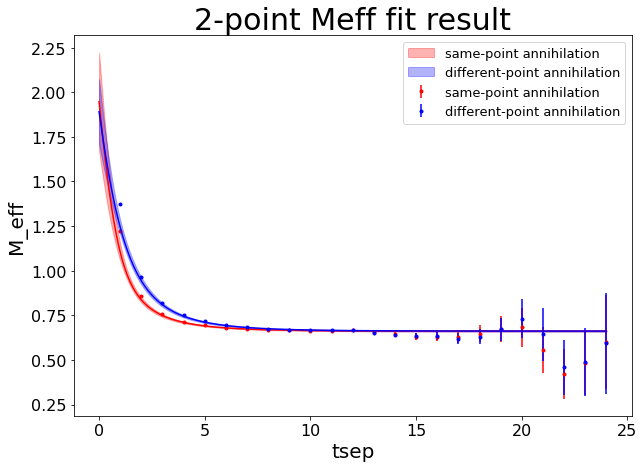

<Figure size 432x288 with 0 Axes>

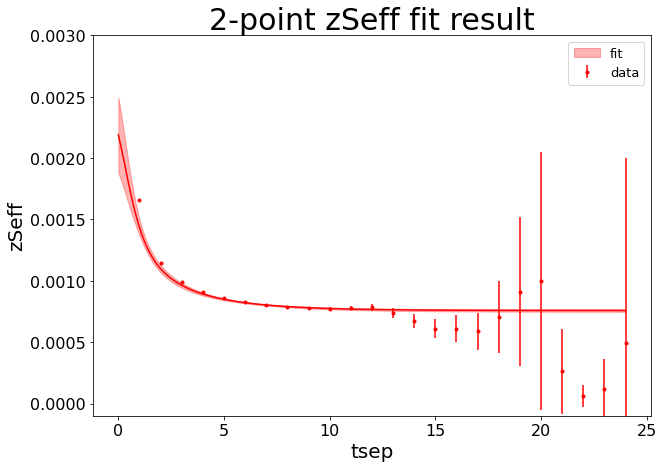

<Figure size 432x288 with 0 Axes>

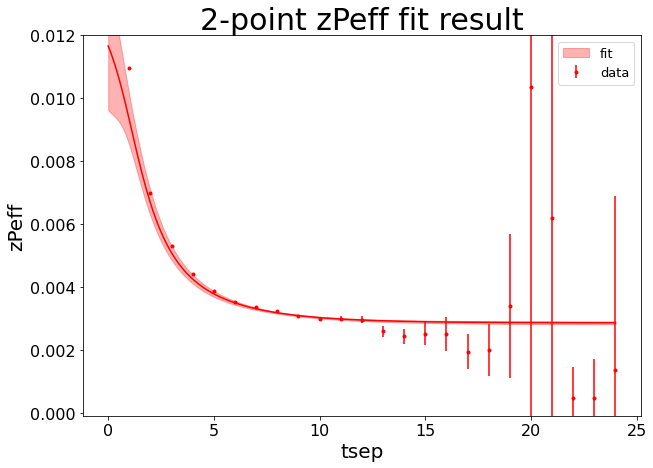

<Figure size 432x288 with 0 Axes>

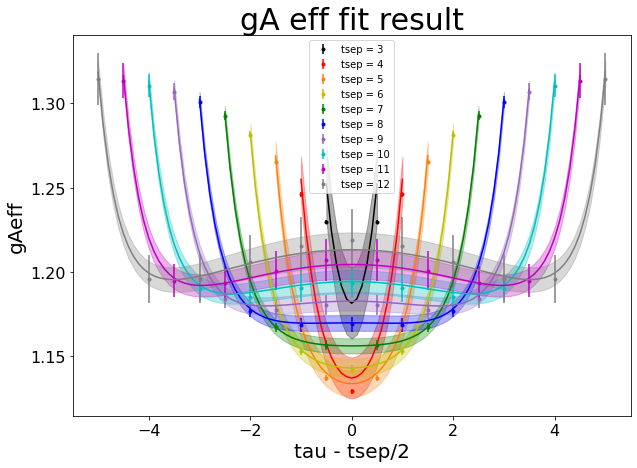

<Figure size 432x288 with 0 Axes>

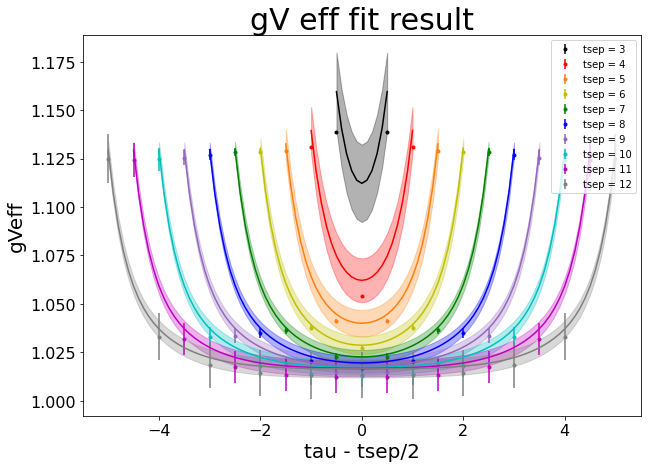

<Figure size 432x288 with 0 Axes>

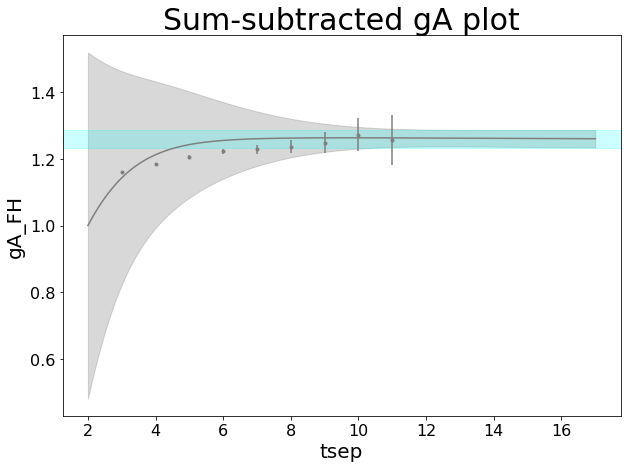

<Figure size 432x288 with 0 Axes>

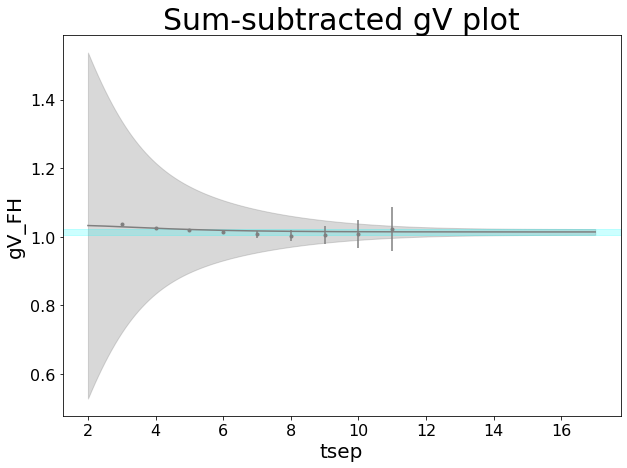

<Figure size 432x288 with 0 Axes>

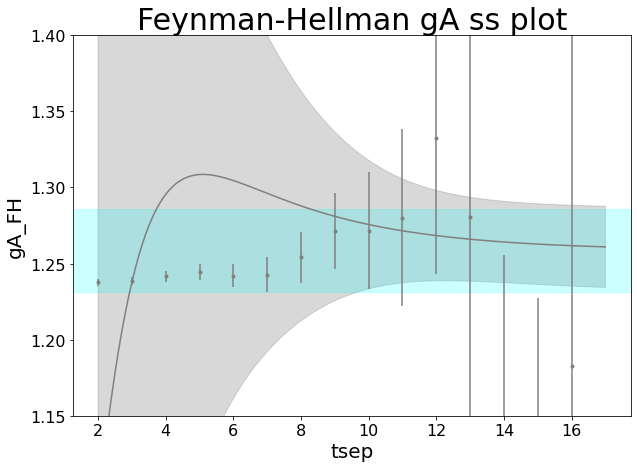

<Figure size 432x288 with 0 Axes>

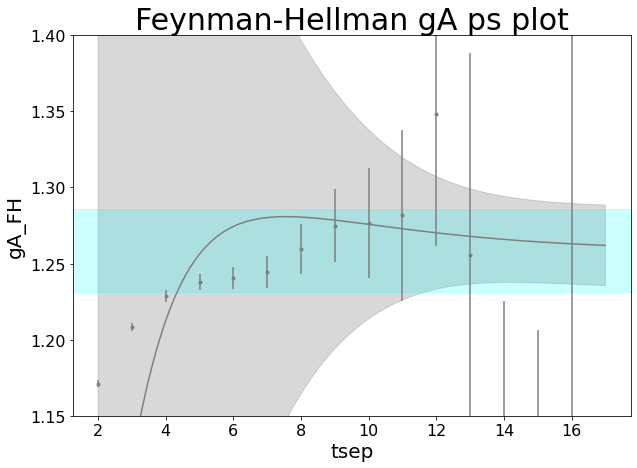

<Figure size 432x288 with 0 Axes>

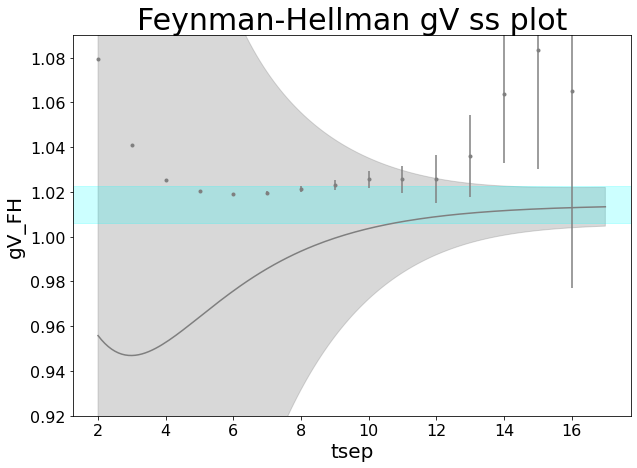

<Figure size 432x288 with 0 Axes>

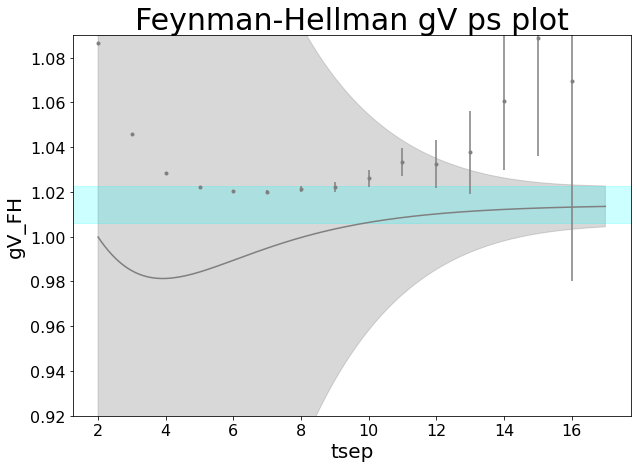

<Figure size 432x288 with 0 Axes>

In [169]:
# 2pt-3pt, chained, tau1
fitcurvedata(fit_2pt3ptchained_tau1)
g00A3_fitres = fit_2pt3ptchained_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptchained_tau1.p['gV4_00']
file_format_string = "chained_2pt_3pt_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

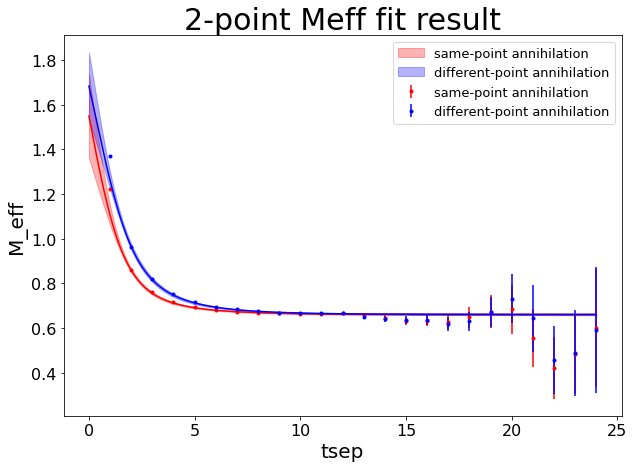

<Figure size 432x288 with 0 Axes>

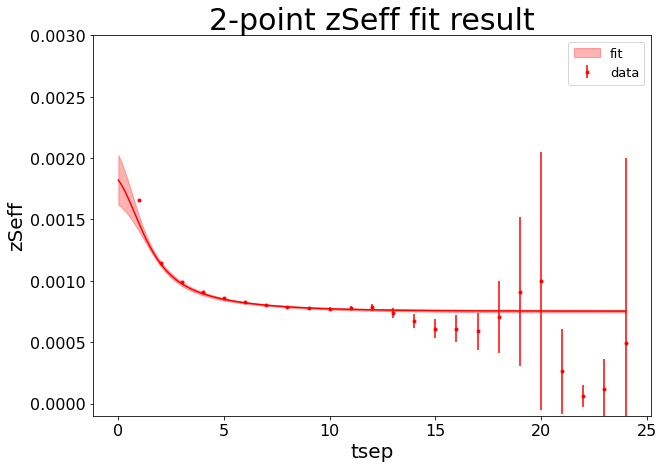

<Figure size 432x288 with 0 Axes>

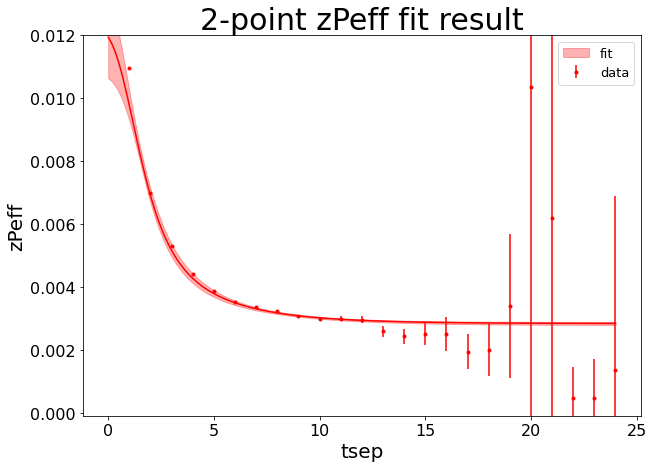

<Figure size 432x288 with 0 Axes>

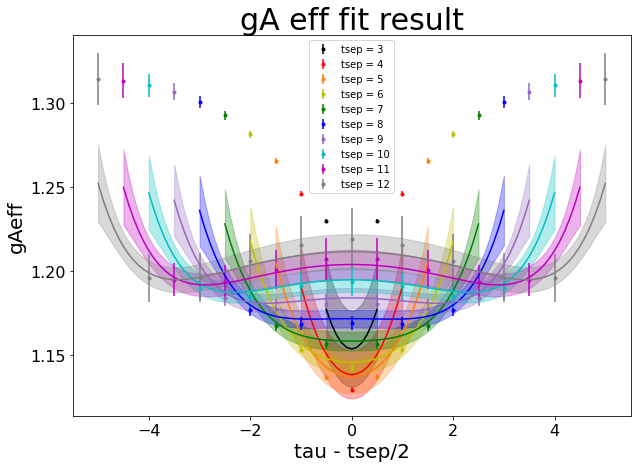

<Figure size 432x288 with 0 Axes>

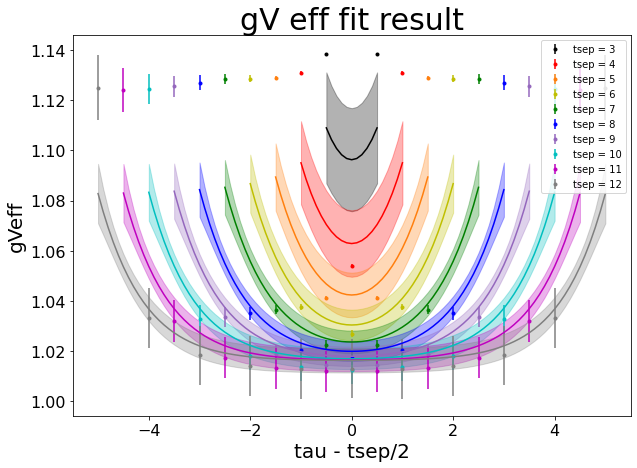

<Figure size 432x288 with 0 Axes>

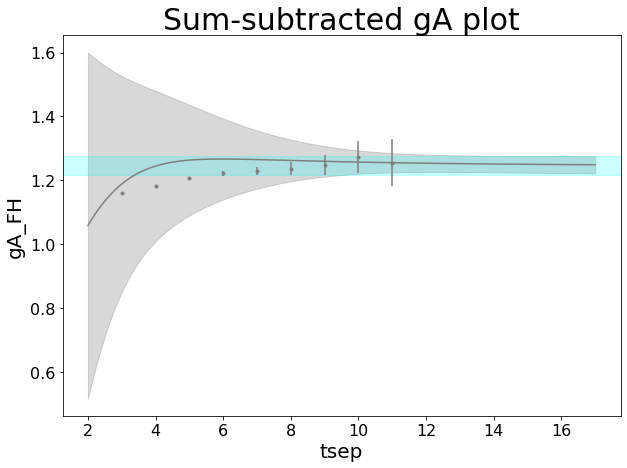

<Figure size 432x288 with 0 Axes>

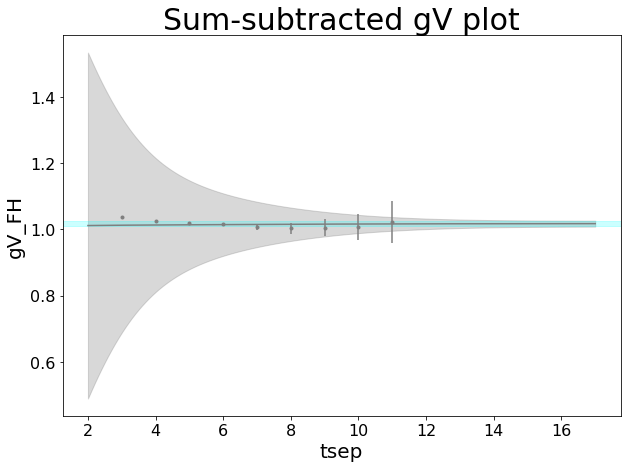

<Figure size 432x288 with 0 Axes>

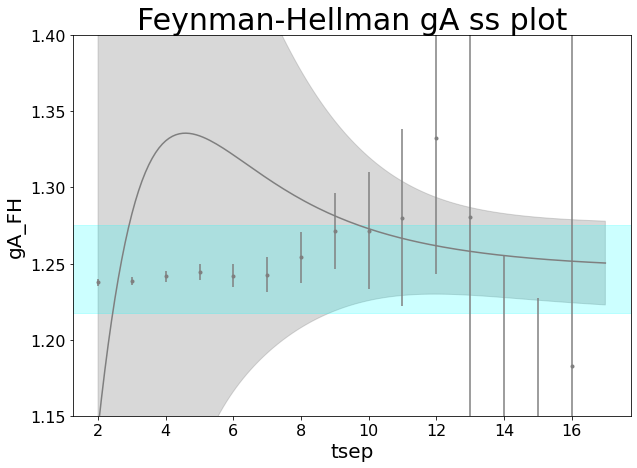

<Figure size 432x288 with 0 Axes>

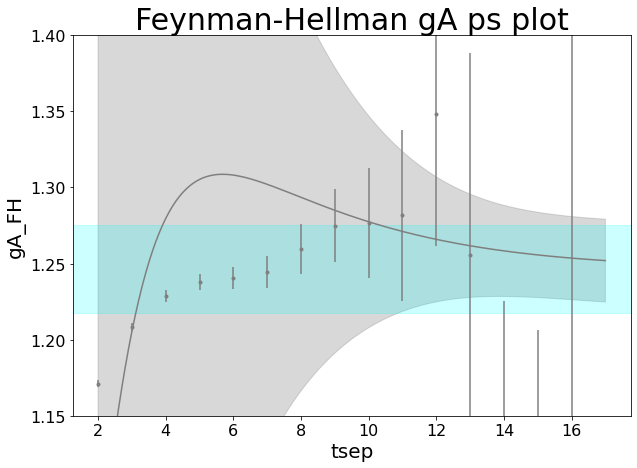

<Figure size 432x288 with 0 Axes>

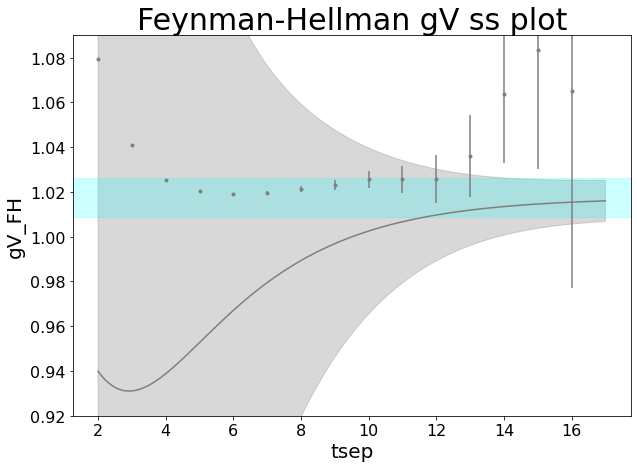

<Figure size 432x288 with 0 Axes>

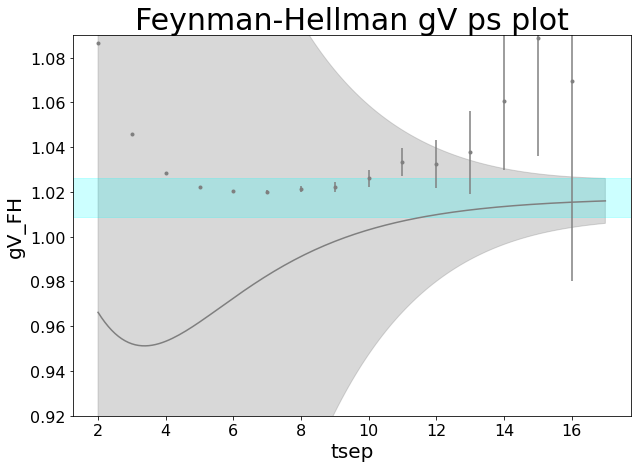

<Figure size 432x288 with 0 Axes>

In [170]:
# 2pt-3pt, chained, tau2
fitcurvedata(fit_2pt3ptchained_tau2)
g00A3_fitres = fit_2pt3ptchained_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptchained_tau2.p['gV4_00']
file_format_string = "chained_2pt_3pt_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

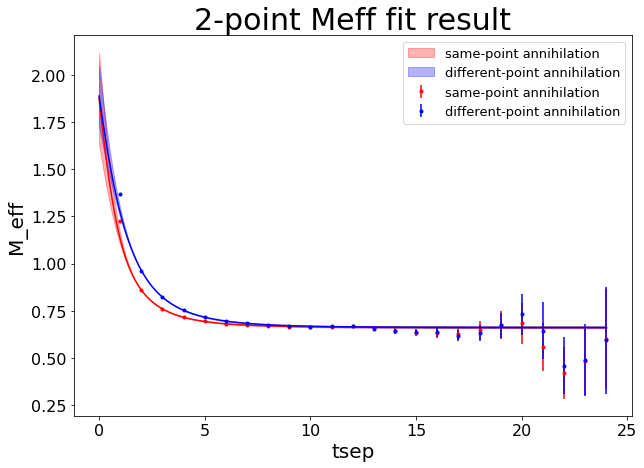

<Figure size 432x288 with 0 Axes>

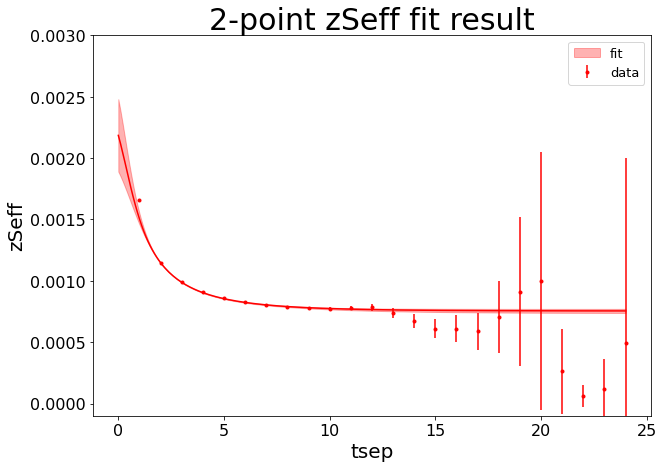

<Figure size 432x288 with 0 Axes>

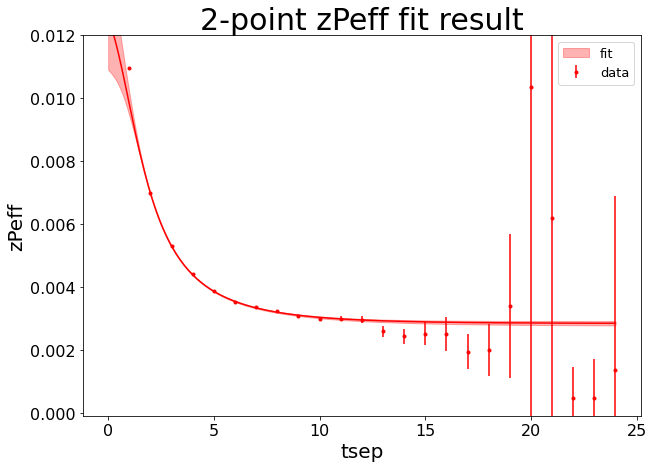

<Figure size 432x288 with 0 Axes>

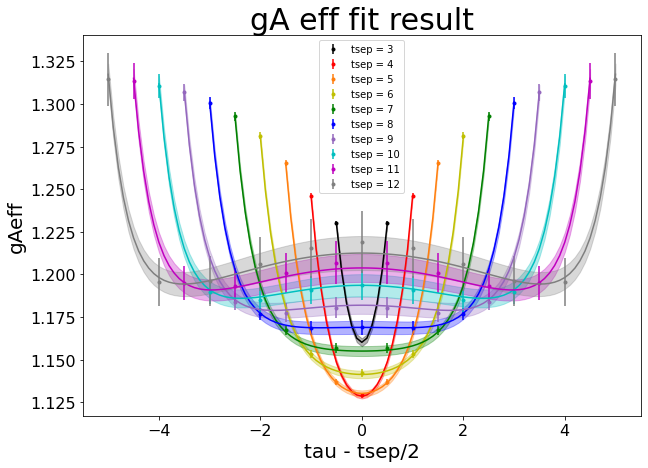

<Figure size 432x288 with 0 Axes>

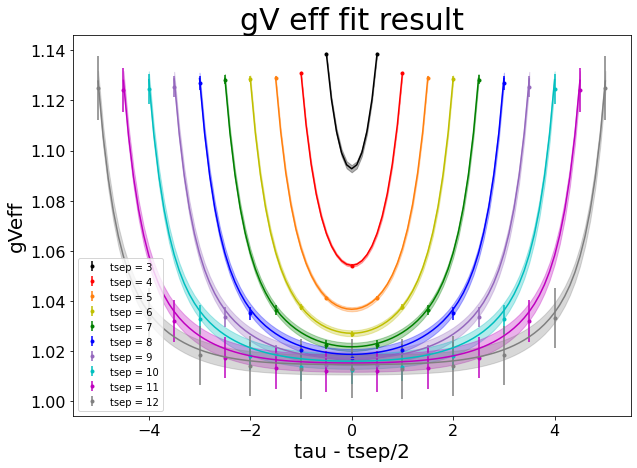

<Figure size 432x288 with 0 Axes>

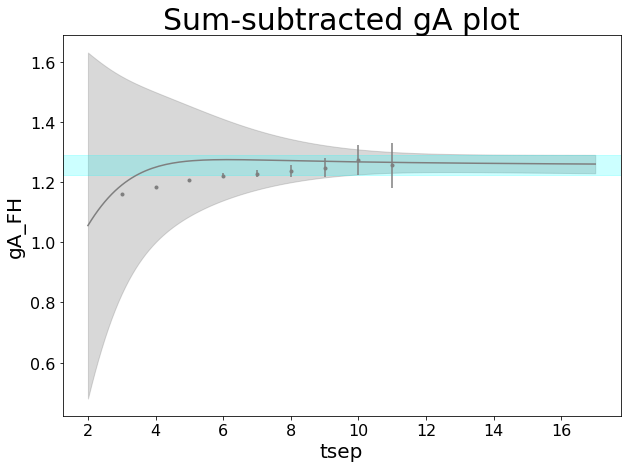

<Figure size 432x288 with 0 Axes>

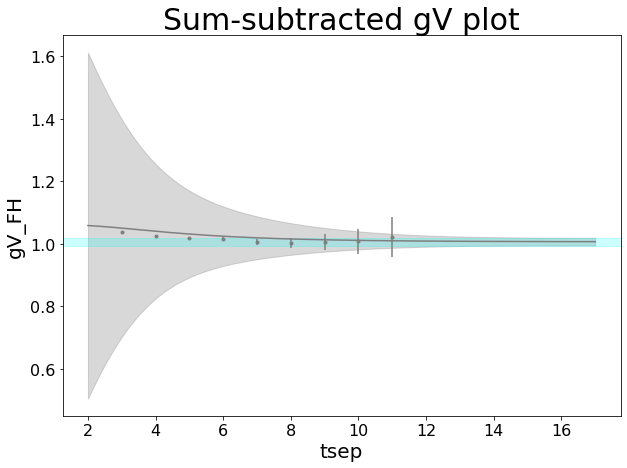

<Figure size 432x288 with 0 Axes>

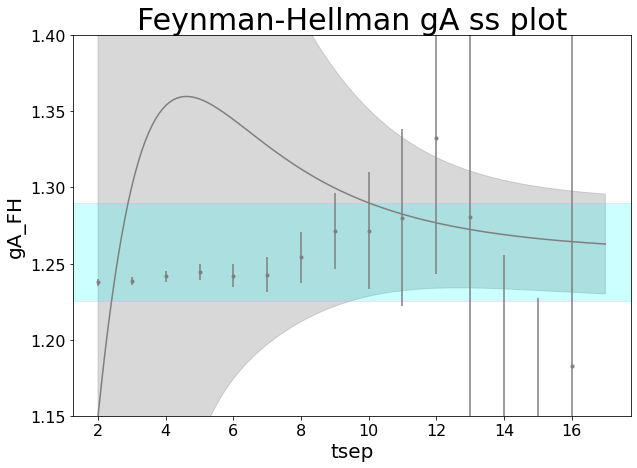

<Figure size 432x288 with 0 Axes>

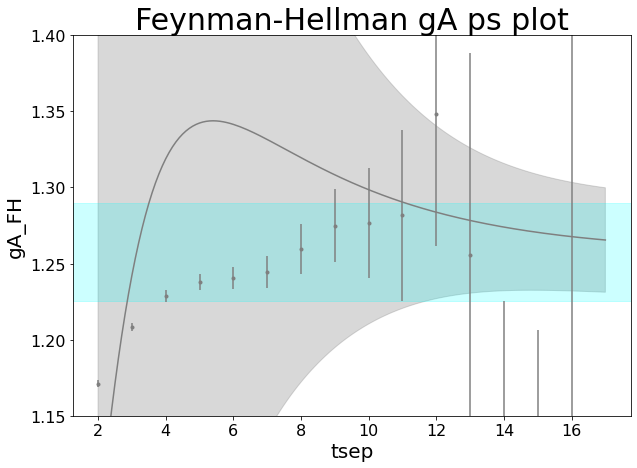

<Figure size 432x288 with 0 Axes>

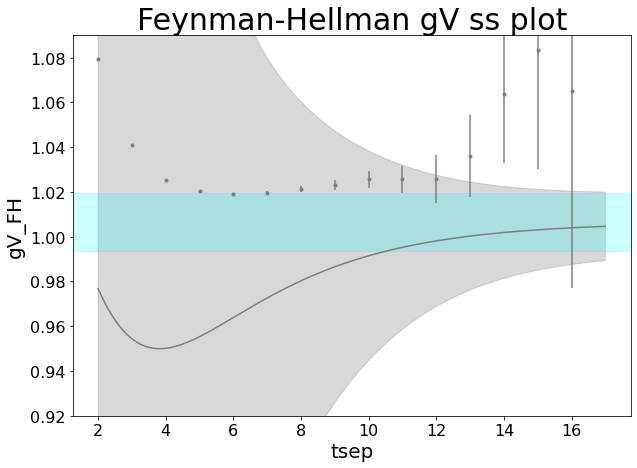

<Figure size 432x288 with 0 Axes>

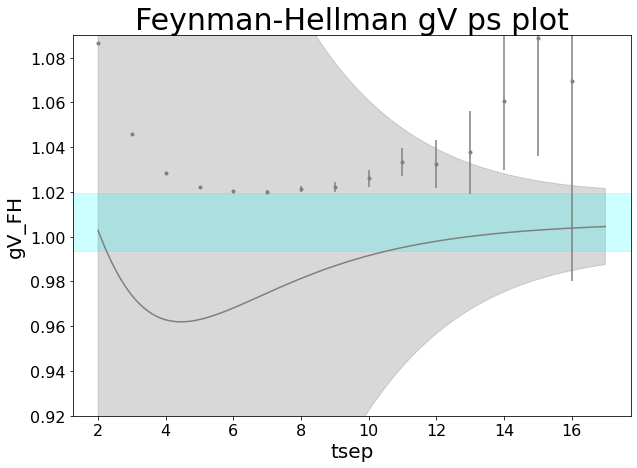

<Figure size 432x288 with 0 Axes>

In [171]:
# 2pt-3pt, simultaneous, tau1
fitcurvedata(fit_2pt3ptsimul_tau1)
g00A3_fitres = fit_2pt3ptsimul_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptsimul_tau1.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 


<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

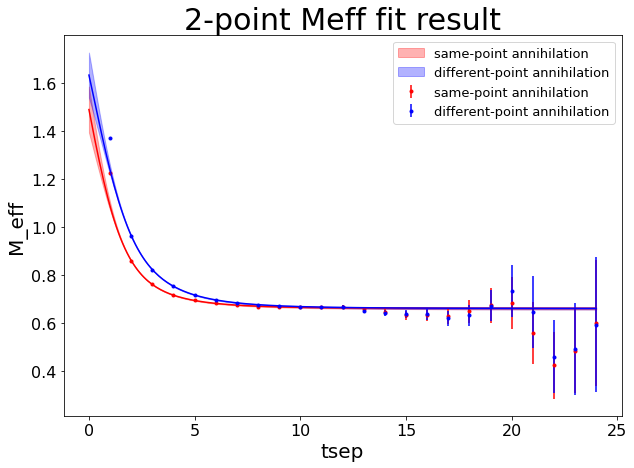

<Figure size 432x288 with 0 Axes>

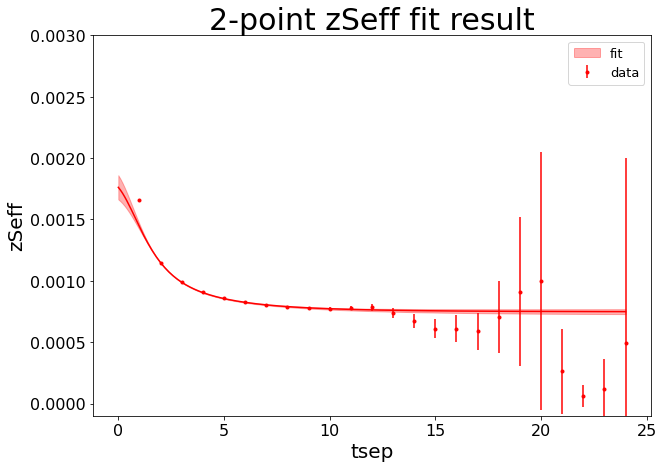

<Figure size 432x288 with 0 Axes>

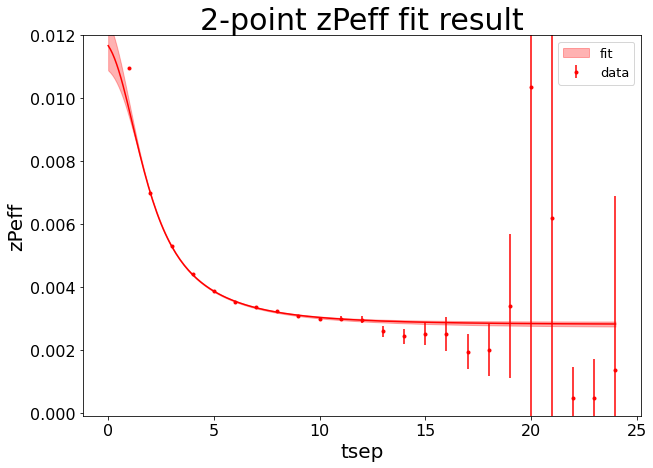

<Figure size 432x288 with 0 Axes>

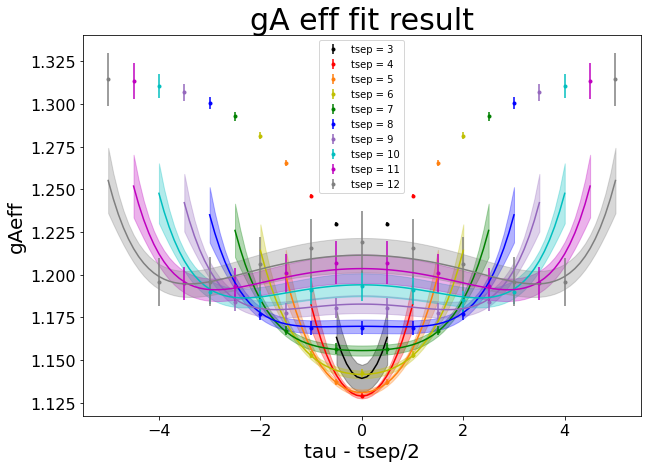

<Figure size 432x288 with 0 Axes>

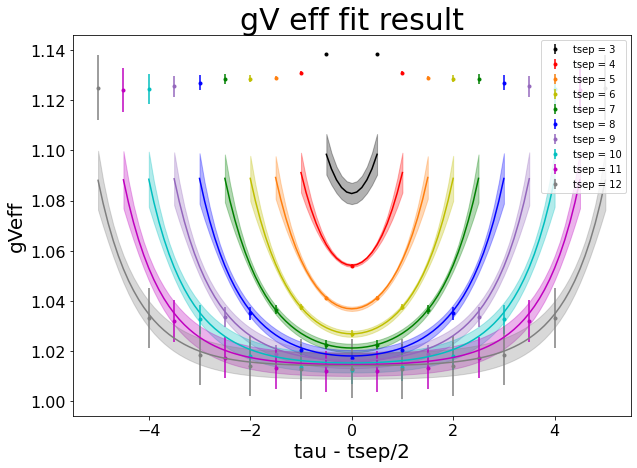

<Figure size 432x288 with 0 Axes>

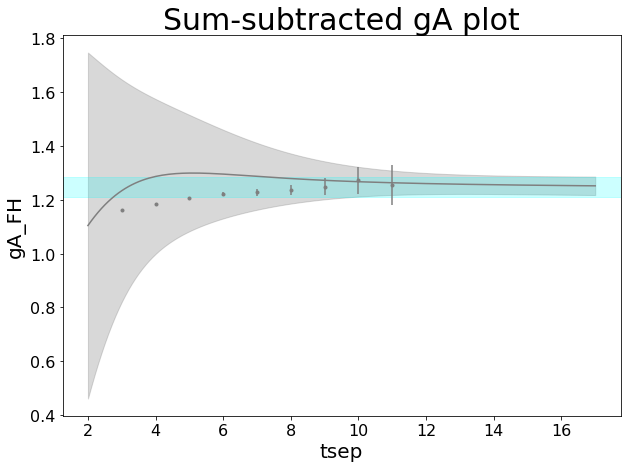

<Figure size 432x288 with 0 Axes>

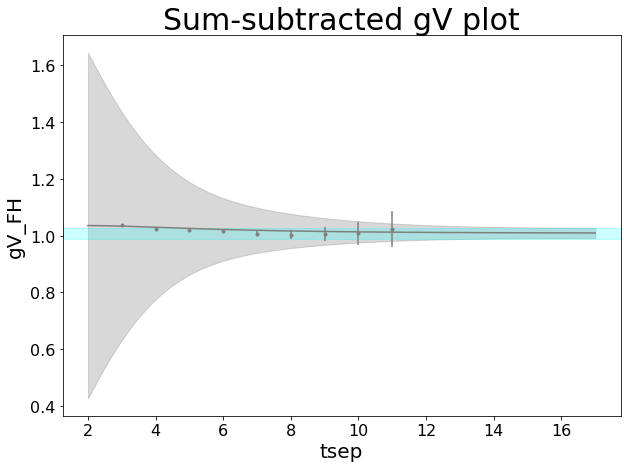

<Figure size 432x288 with 0 Axes>

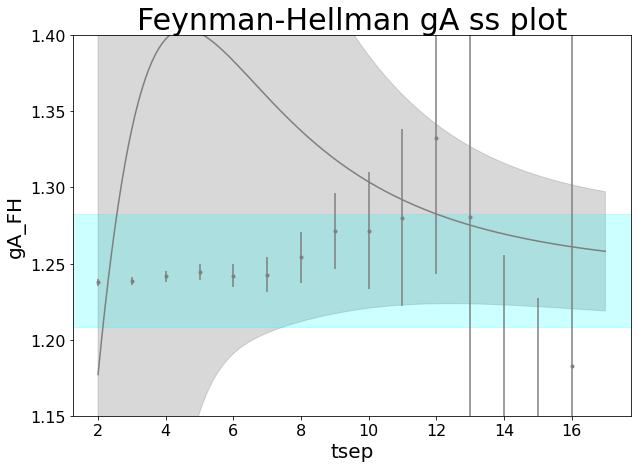

<Figure size 432x288 with 0 Axes>

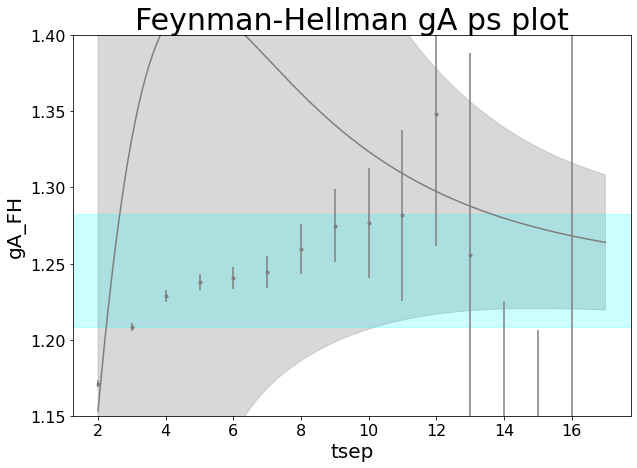

<Figure size 432x288 with 0 Axes>

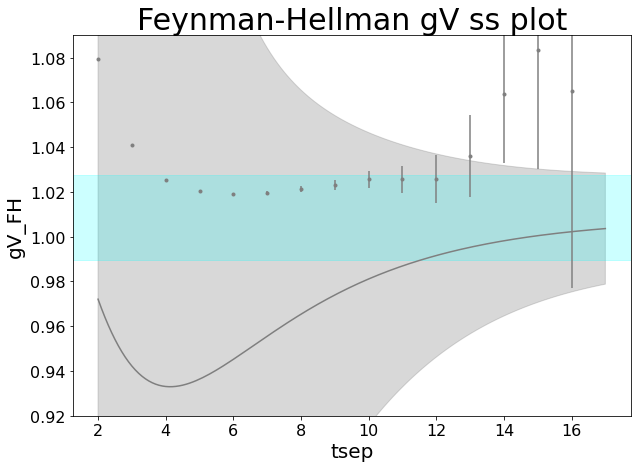

<Figure size 432x288 with 0 Axes>

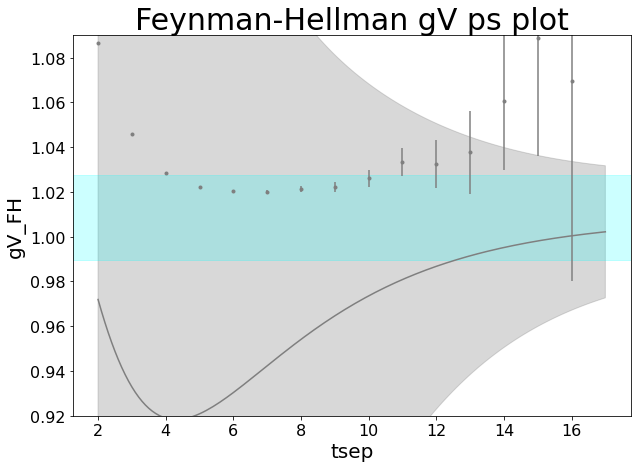

<Figure size 432x288 with 0 Axes>

In [172]:
# 2pt-3pt, simultaneous, tau2
fitcurvedata(fit_2pt3ptsimul_tau2)
g00A3_fitres = fit_2pt3ptsimul_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptsimul_tau2.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 



<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

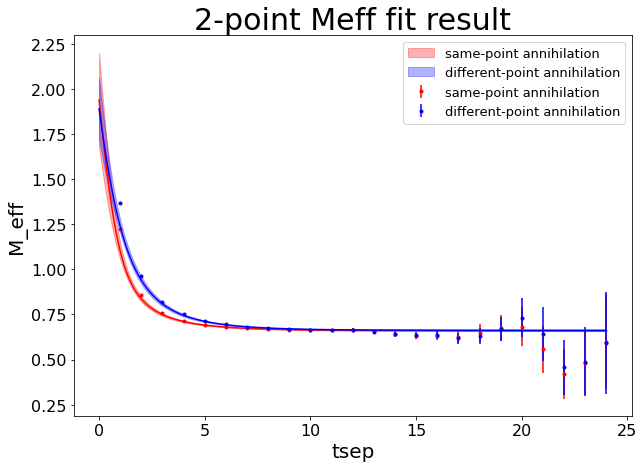

<Figure size 432x288 with 0 Axes>

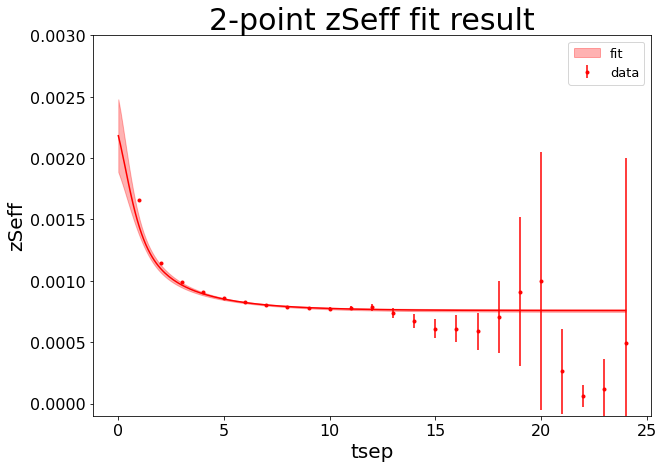

<Figure size 432x288 with 0 Axes>

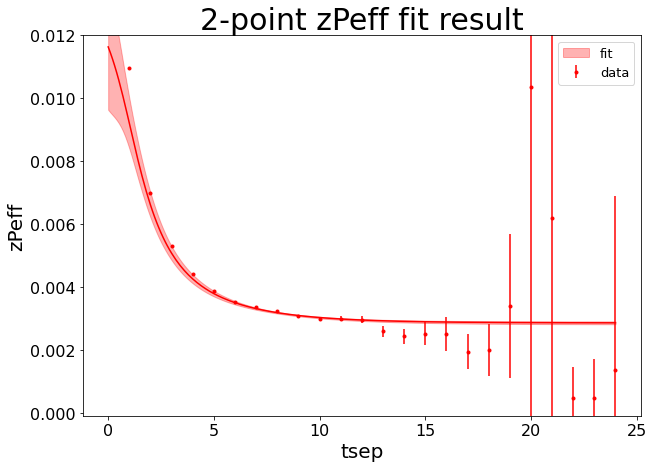

<Figure size 432x288 with 0 Axes>

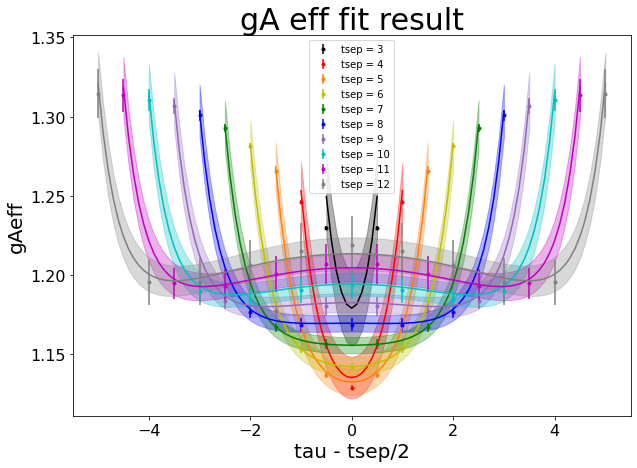

<Figure size 432x288 with 0 Axes>

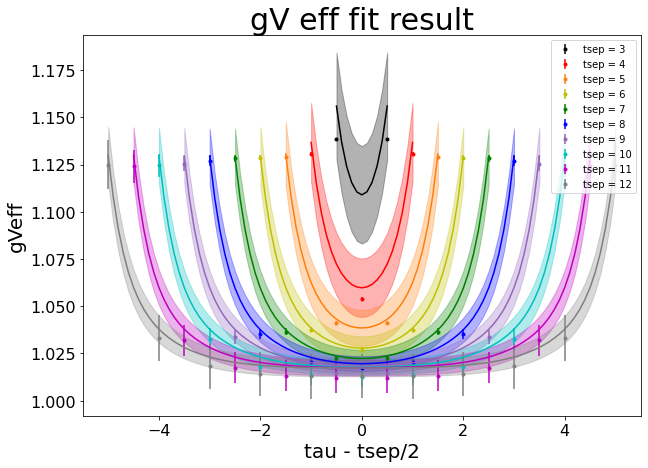

<Figure size 432x288 with 0 Axes>

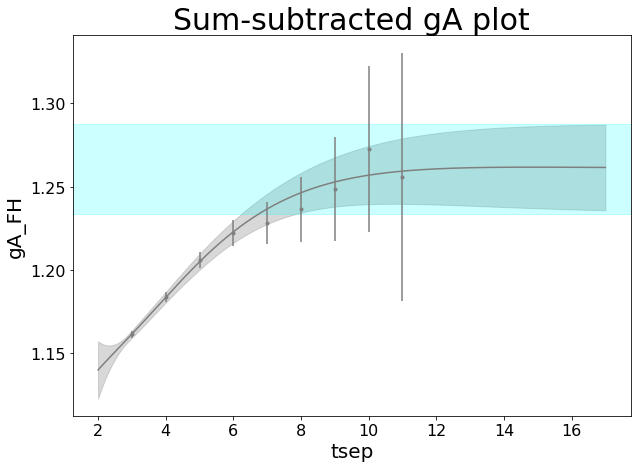

<Figure size 432x288 with 0 Axes>

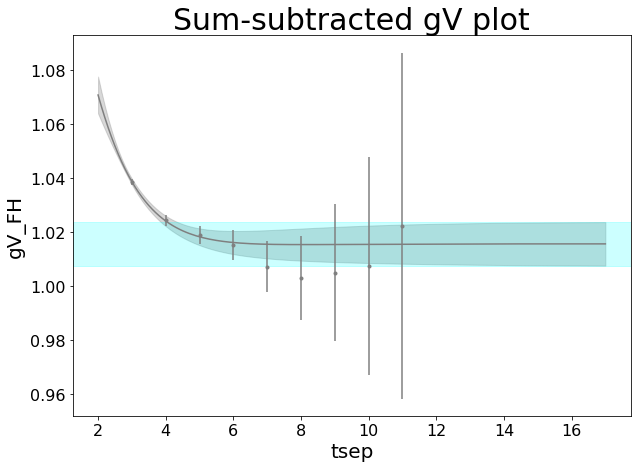

<Figure size 432x288 with 0 Axes>

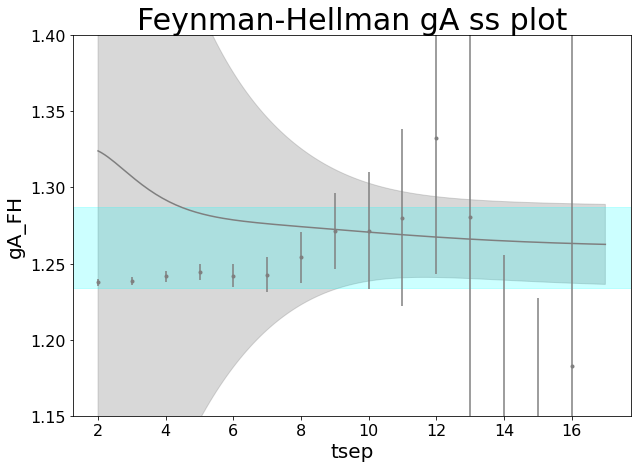

<Figure size 432x288 with 0 Axes>

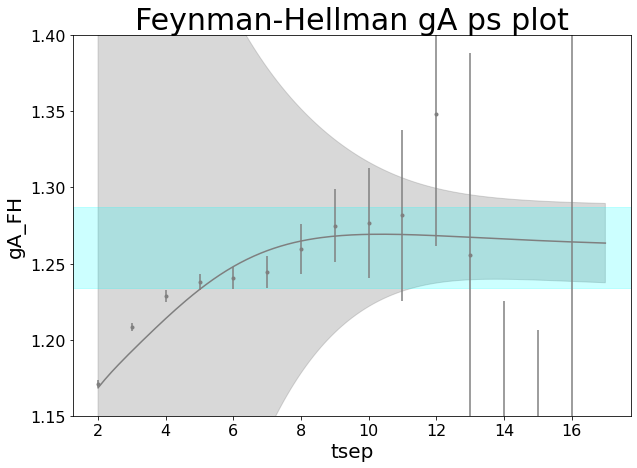

<Figure size 432x288 with 0 Axes>

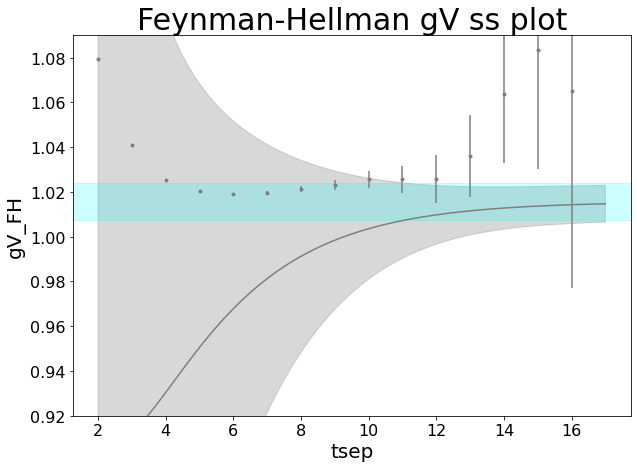

<Figure size 432x288 with 0 Axes>

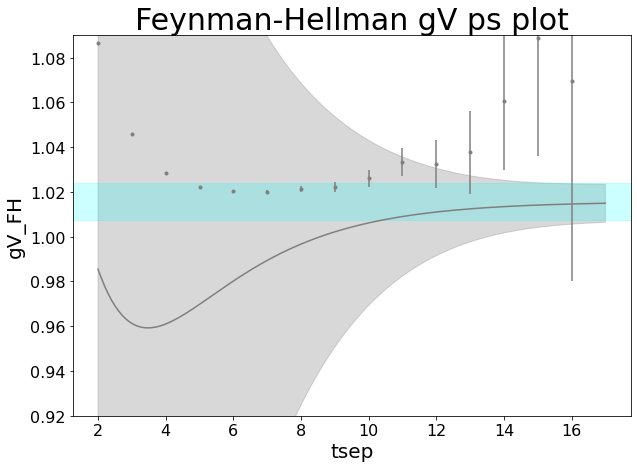

<Figure size 432x288 with 0 Axes>

In [173]:
# 2pt-3pt-sumsub, chained, tau1
fitcurvedata(fit_2pt3ptsumsubchained_tau1)
g00A3_fitres = fit_2pt3ptsumsubchained_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubchained_tau1.p['gV4_00']
file_format_string = "chained_2pt_3pt_sumsub_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

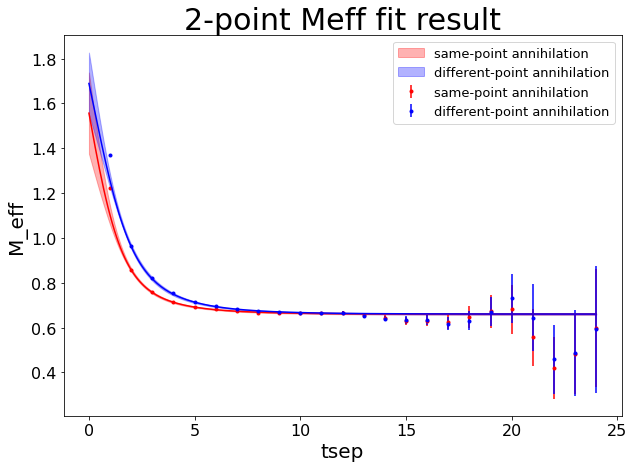

<Figure size 432x288 with 0 Axes>

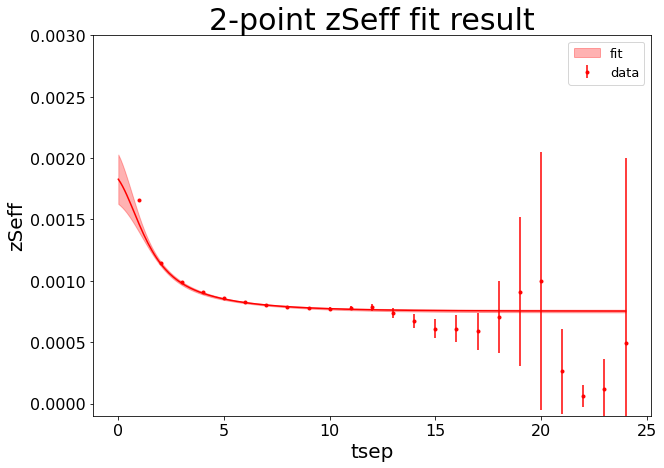

<Figure size 432x288 with 0 Axes>

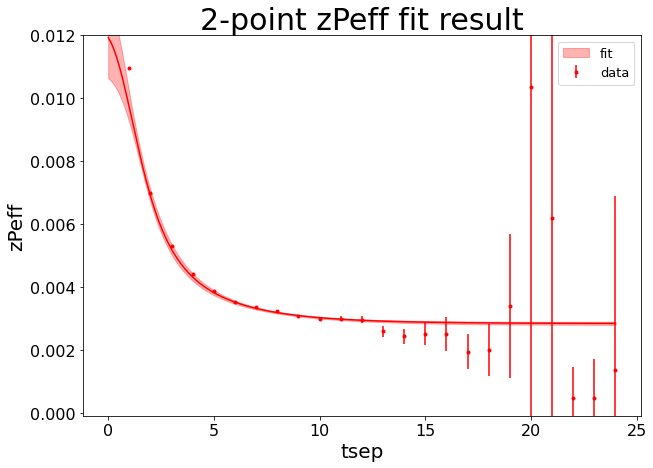

<Figure size 432x288 with 0 Axes>

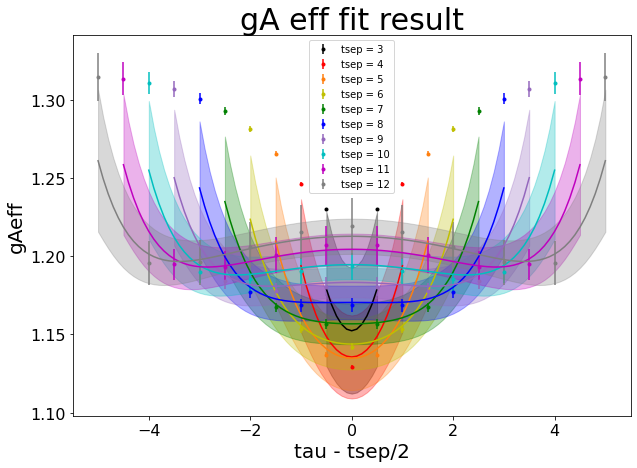

<Figure size 432x288 with 0 Axes>

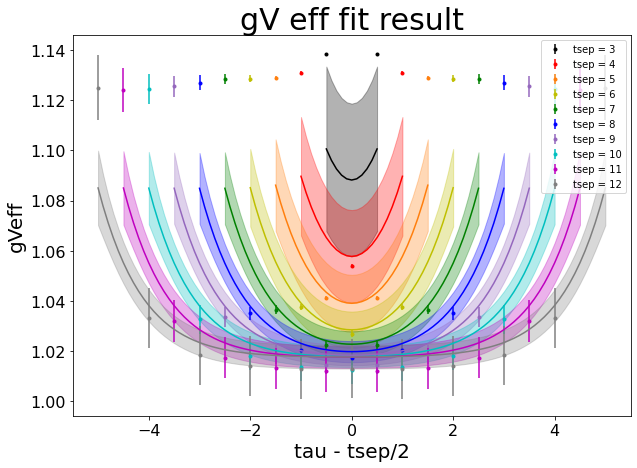

<Figure size 432x288 with 0 Axes>

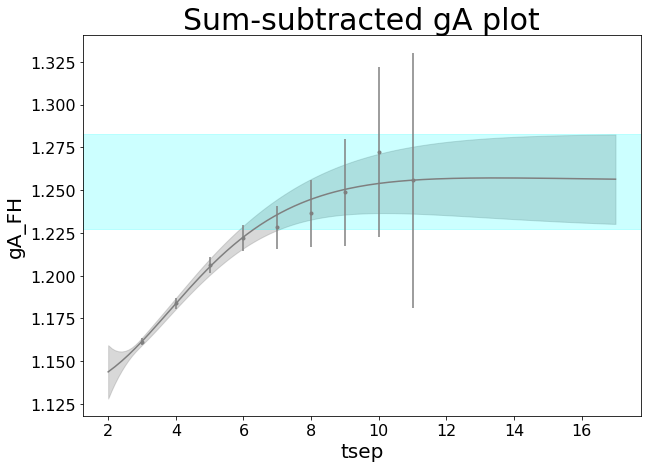

<Figure size 432x288 with 0 Axes>

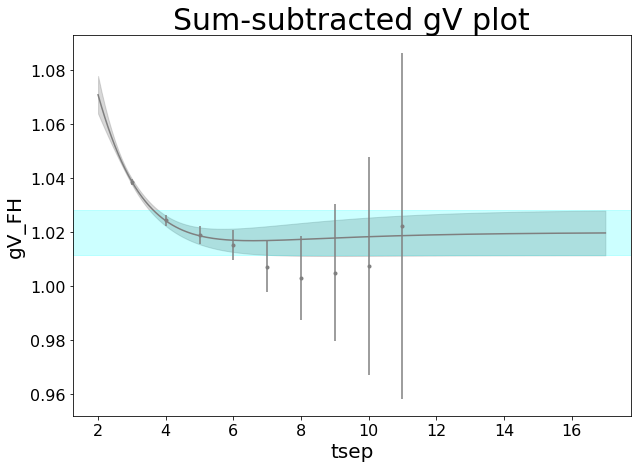

<Figure size 432x288 with 0 Axes>

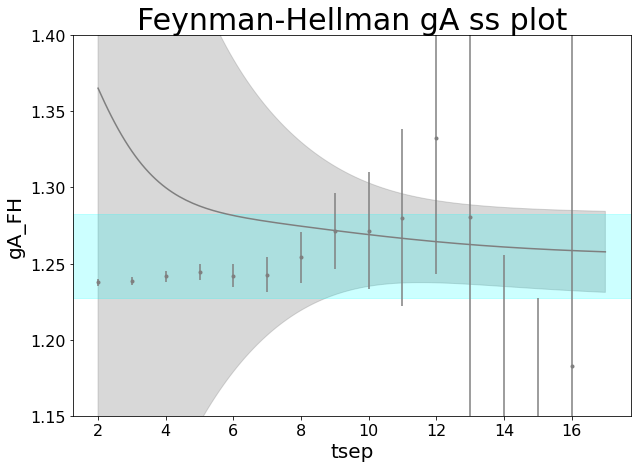

<Figure size 432x288 with 0 Axes>

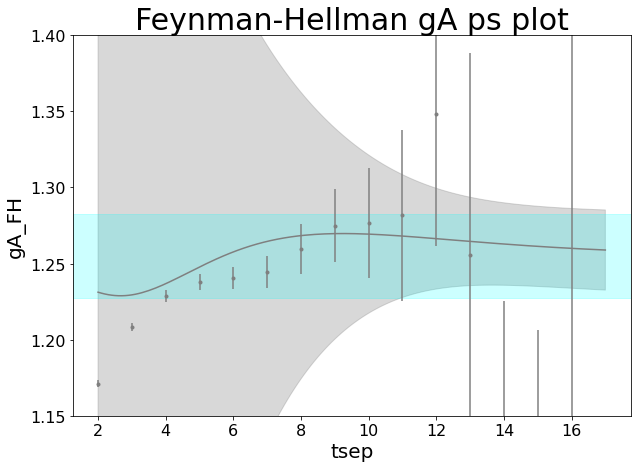

<Figure size 432x288 with 0 Axes>

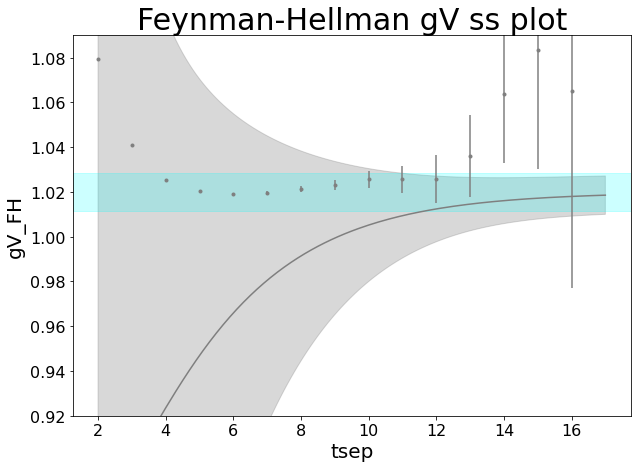

<Figure size 432x288 with 0 Axes>

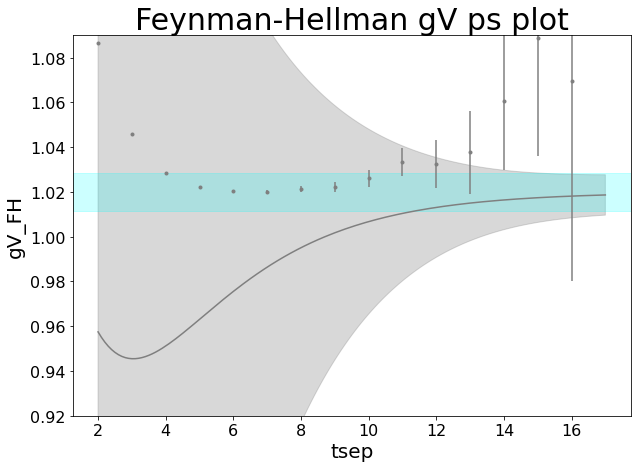

<Figure size 432x288 with 0 Axes>

In [174]:
# 2pt-3pt-sumsub, chained, tau2
fitcurvedata(fit_2pt3ptsumsubchained_tau2)
g00A3_fitres = fit_2pt3ptsumsubchained_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubchained_tau2.p['gV4_00']
file_format_string = "chained_2pt_3pt_sumsub_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

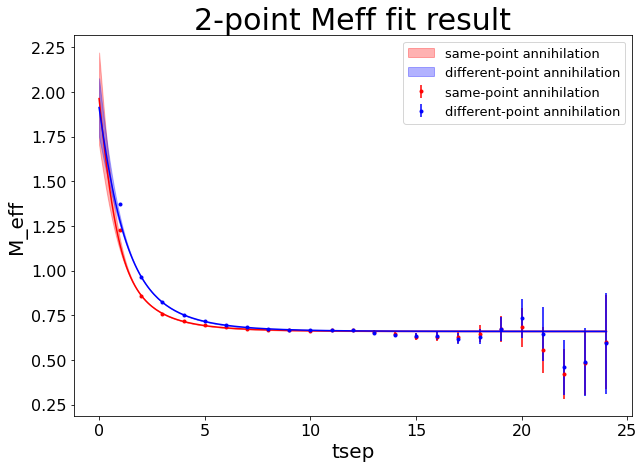

<Figure size 432x288 with 0 Axes>

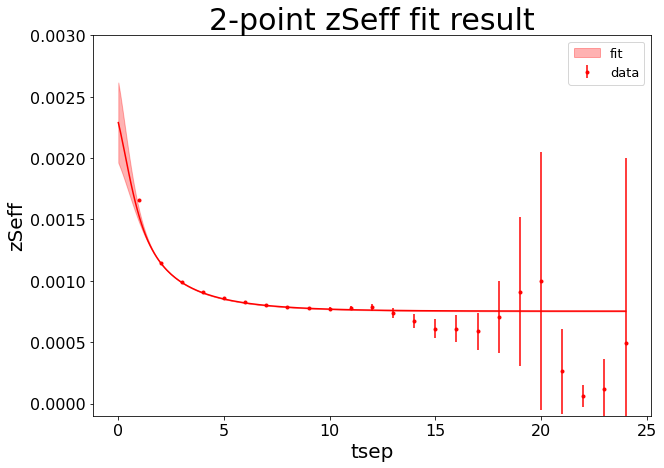

<Figure size 432x288 with 0 Axes>

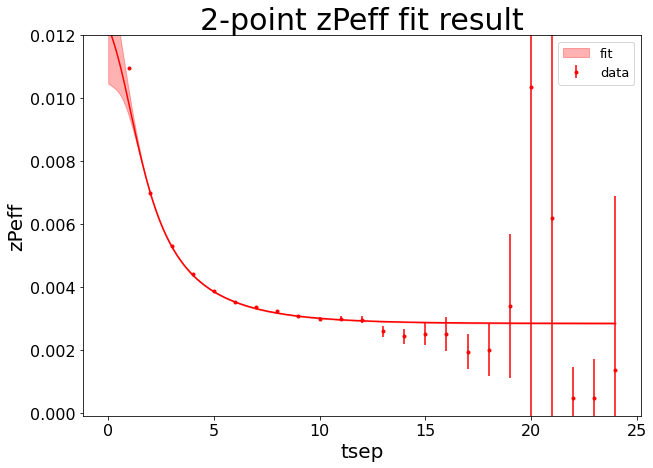

<Figure size 432x288 with 0 Axes>

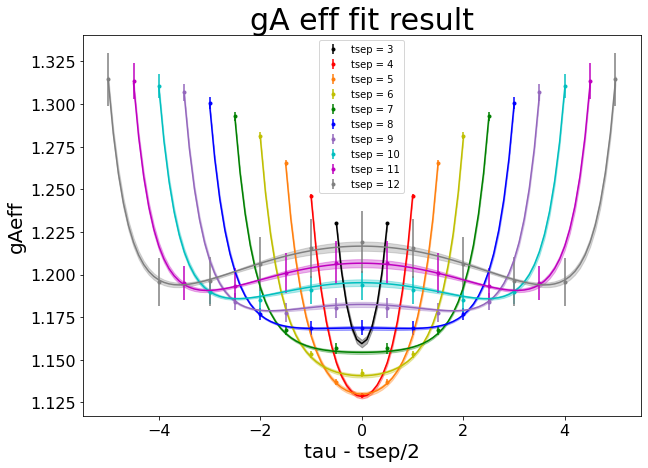

<Figure size 432x288 with 0 Axes>

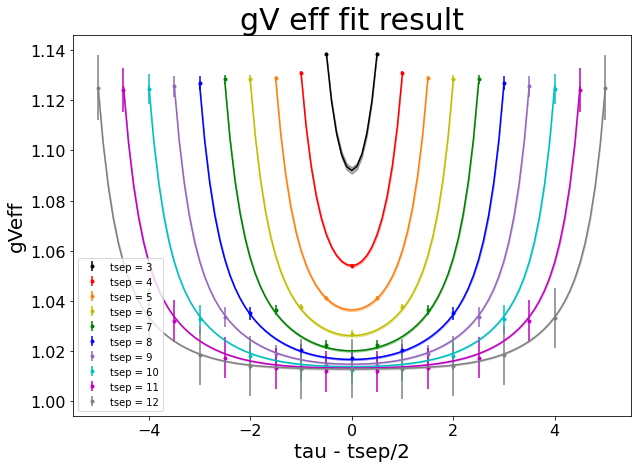

<Figure size 432x288 with 0 Axes>

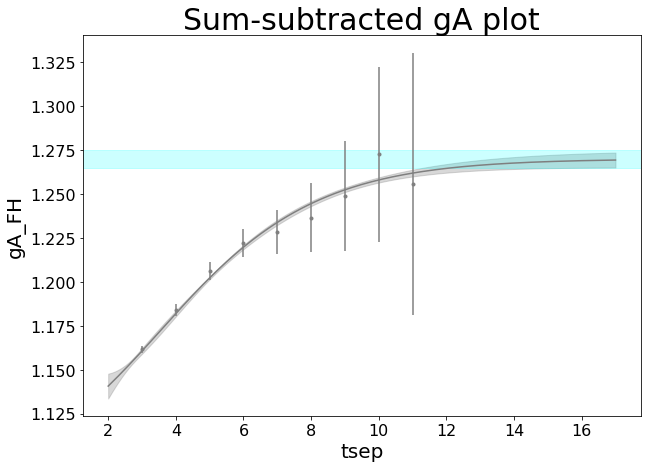

<Figure size 432x288 with 0 Axes>

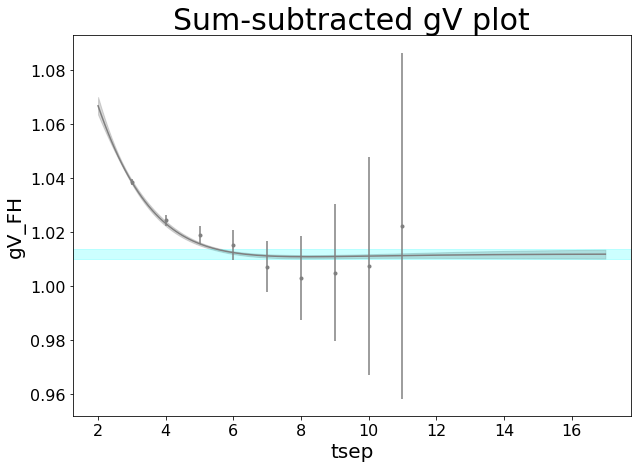

<Figure size 432x288 with 0 Axes>

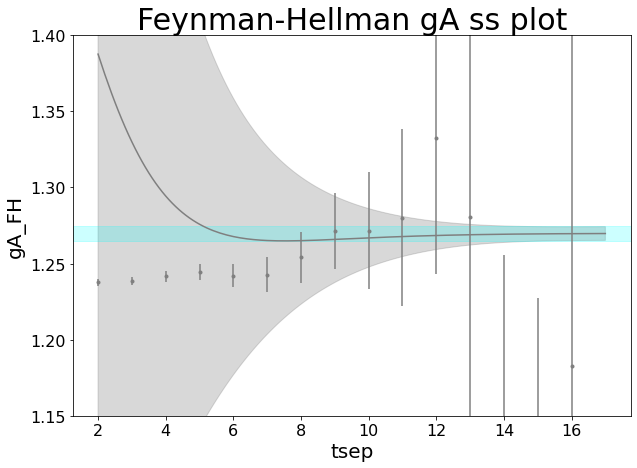

<Figure size 432x288 with 0 Axes>

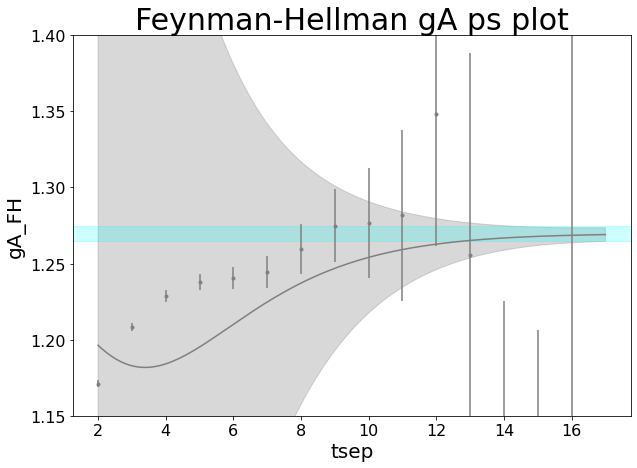

<Figure size 432x288 with 0 Axes>

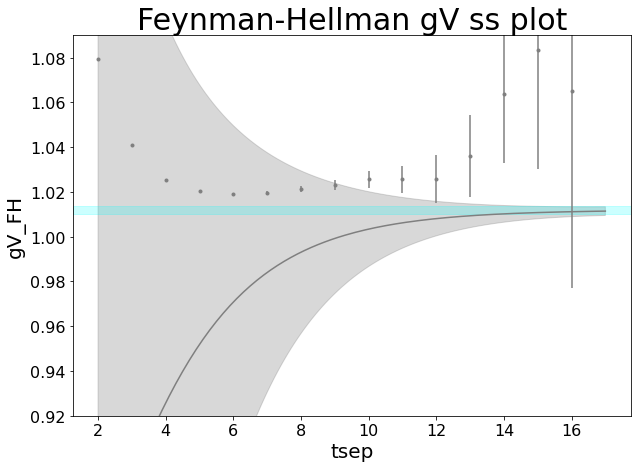

<Figure size 432x288 with 0 Axes>

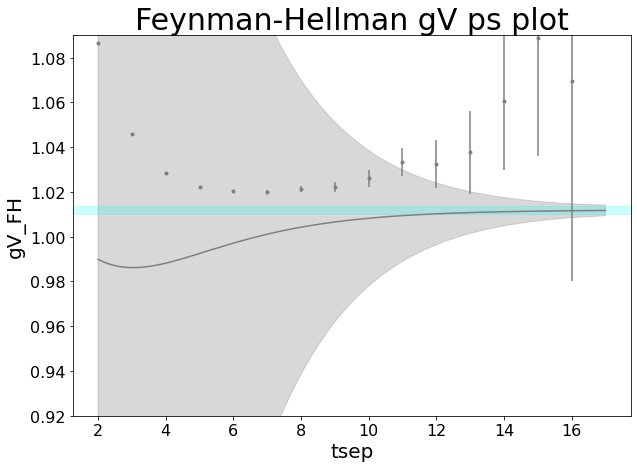

<Figure size 432x288 with 0 Axes>

In [175]:
# 2pt-3pt-sumsub, simultaneous, tau1
fitcurvedata(fit_2pt3ptsumsubsimul_tau1)
g00A3_fitres = fit_2pt3ptsumsubsimul_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubsimul_tau1.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_sumsub_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 


<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

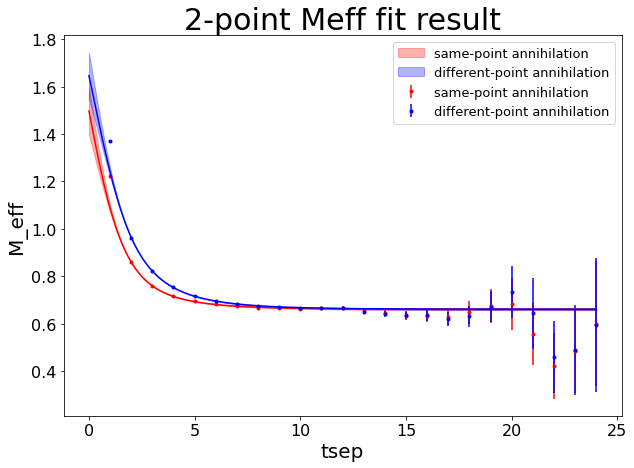

<Figure size 432x288 with 0 Axes>

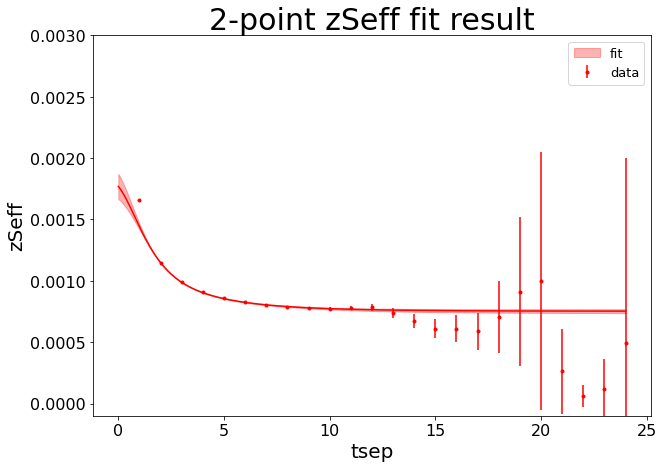

<Figure size 432x288 with 0 Axes>

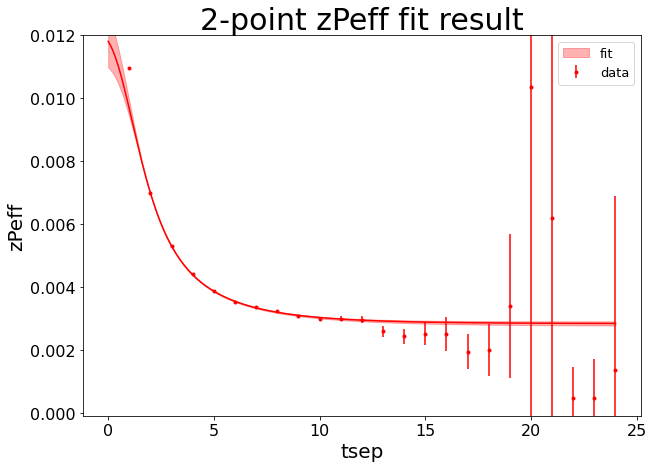

<Figure size 432x288 with 0 Axes>

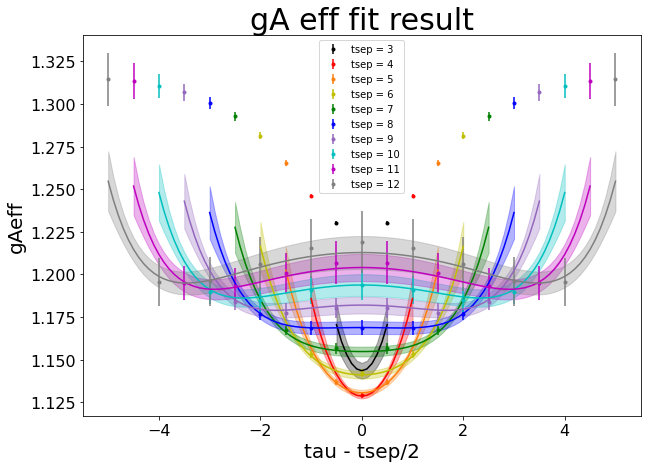

<Figure size 432x288 with 0 Axes>

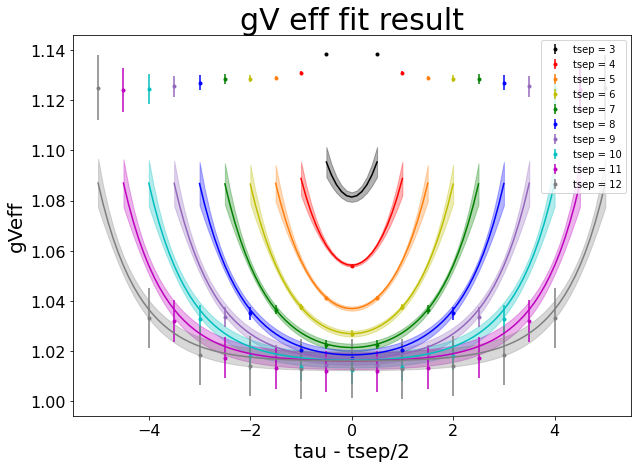

<Figure size 432x288 with 0 Axes>

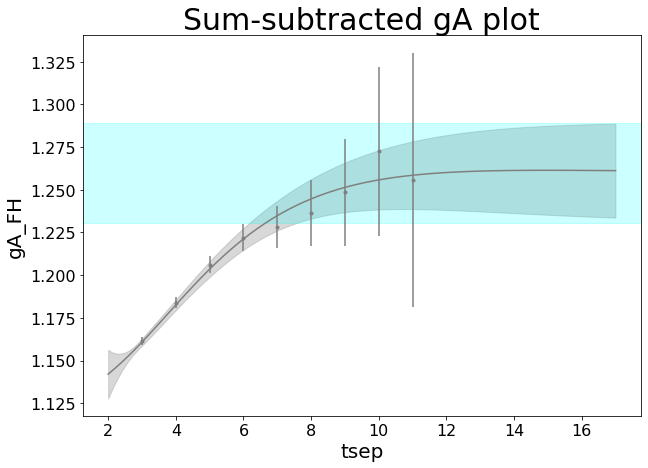

<Figure size 432x288 with 0 Axes>

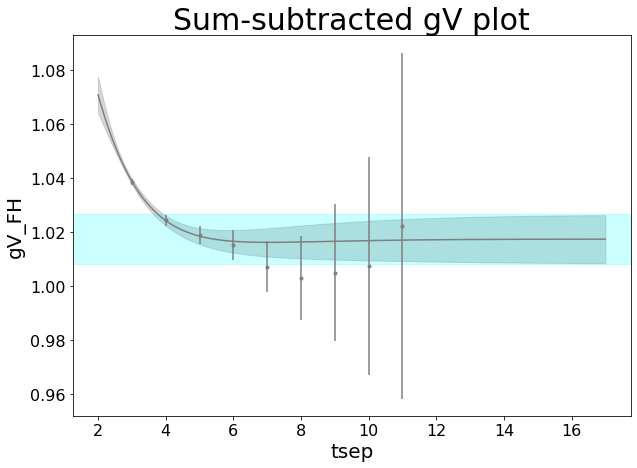

<Figure size 432x288 with 0 Axes>

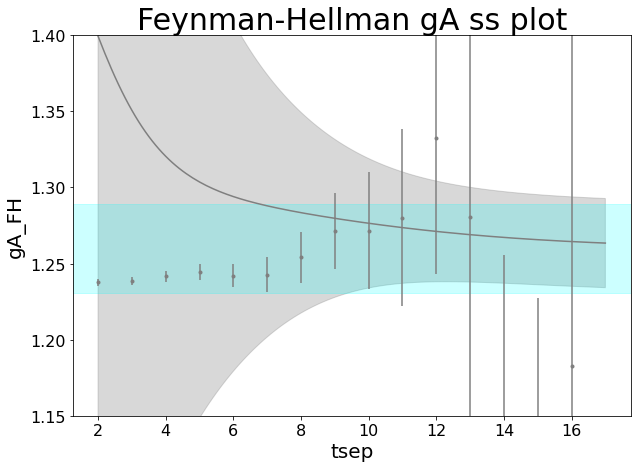

<Figure size 432x288 with 0 Axes>

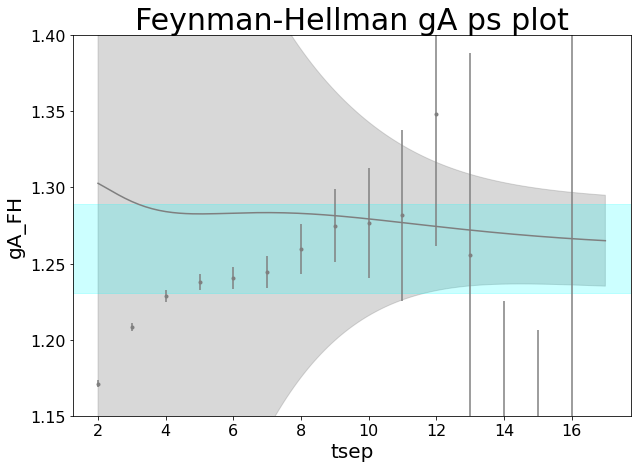

<Figure size 432x288 with 0 Axes>

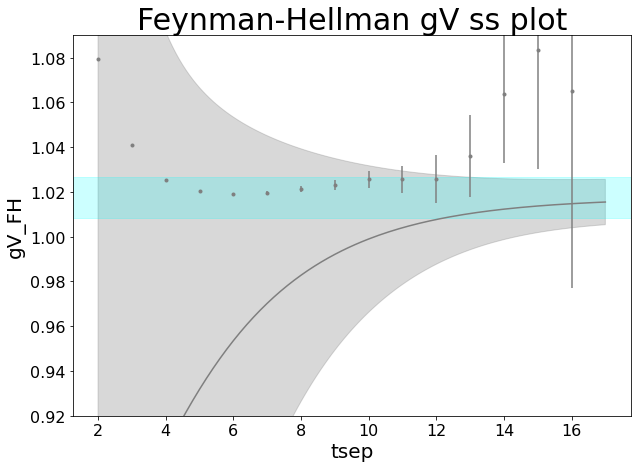

<Figure size 432x288 with 0 Axes>

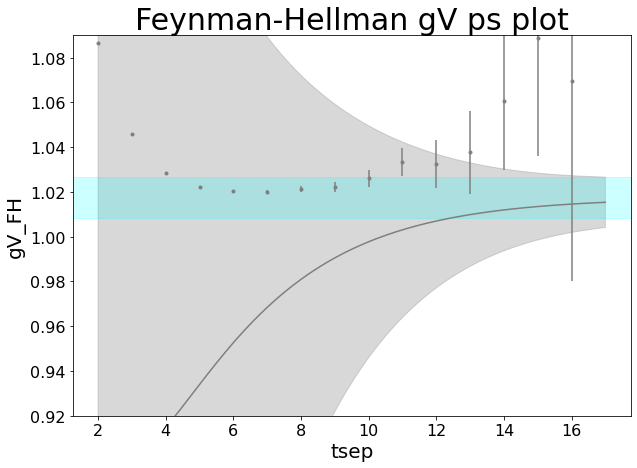

<Figure size 432x288 with 0 Axes>

In [176]:
# 2pt-3pt-sumsub, simultaneous, tau2
fitcurvedata(fit_2pt3ptsumsubsimul_tau2)
g00A3_fitres = fit_2pt3ptsumsubsimul_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubsimul_tau2.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_sumsub_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 



<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

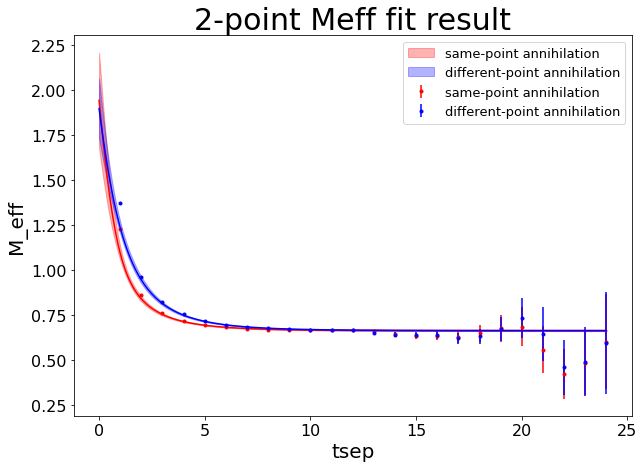

<Figure size 432x288 with 0 Axes>

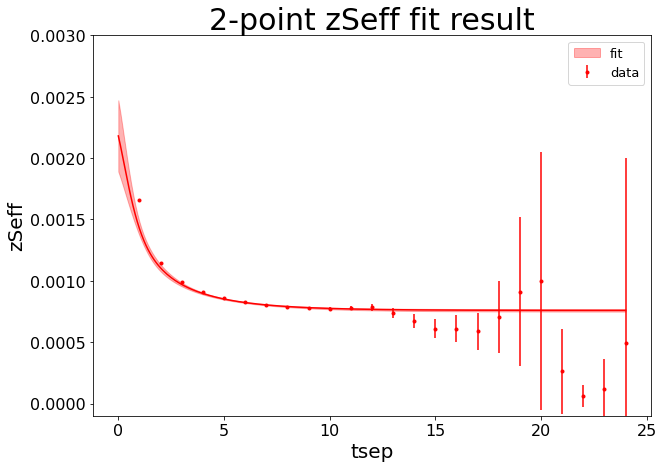

<Figure size 432x288 with 0 Axes>

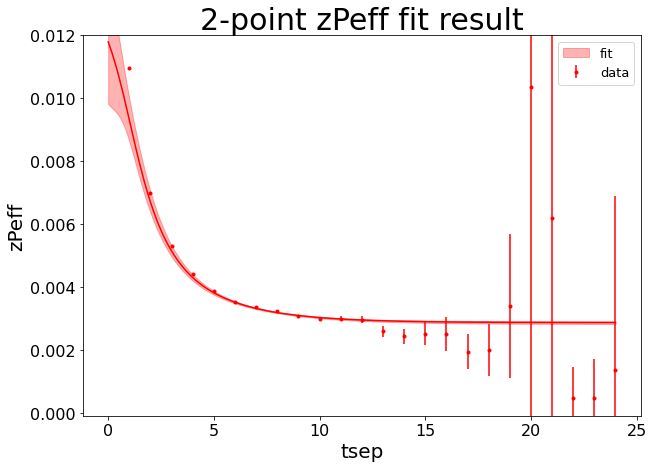

<Figure size 432x288 with 0 Axes>

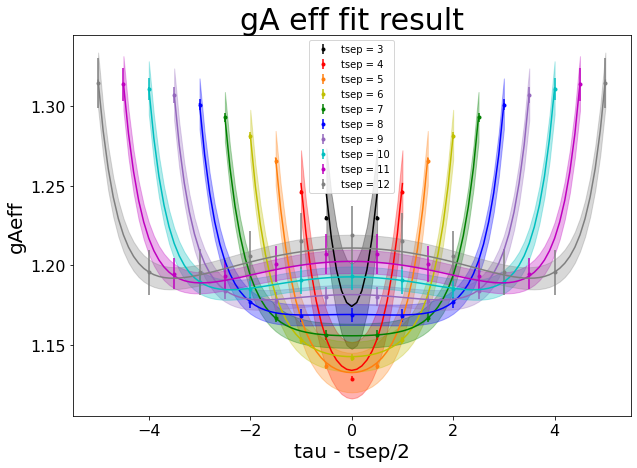

<Figure size 432x288 with 0 Axes>

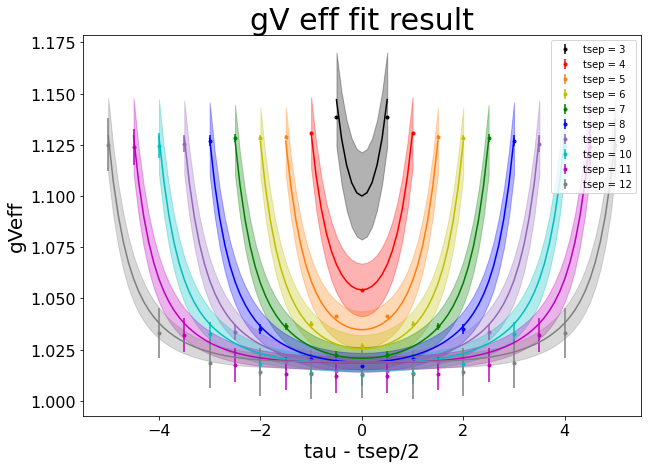

<Figure size 432x288 with 0 Axes>

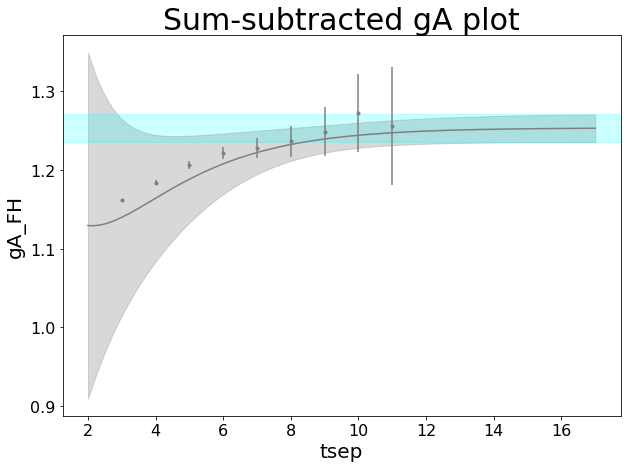

<Figure size 432x288 with 0 Axes>

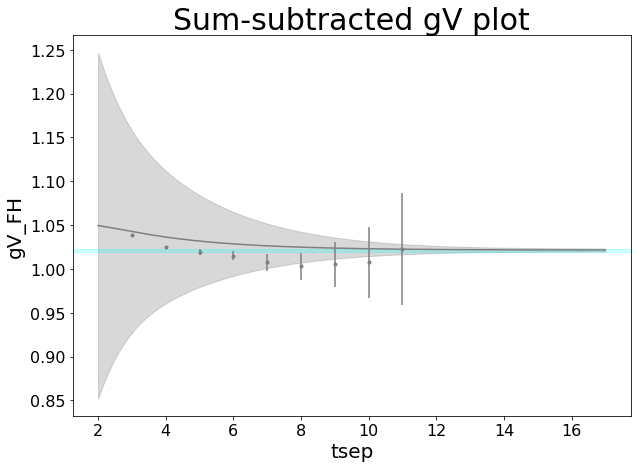

<Figure size 432x288 with 0 Axes>

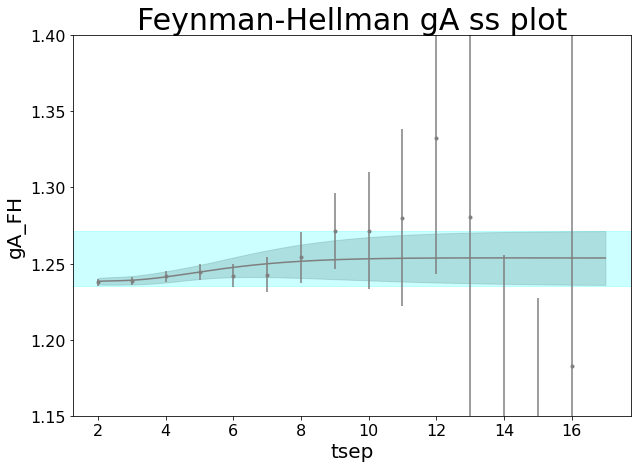

<Figure size 432x288 with 0 Axes>

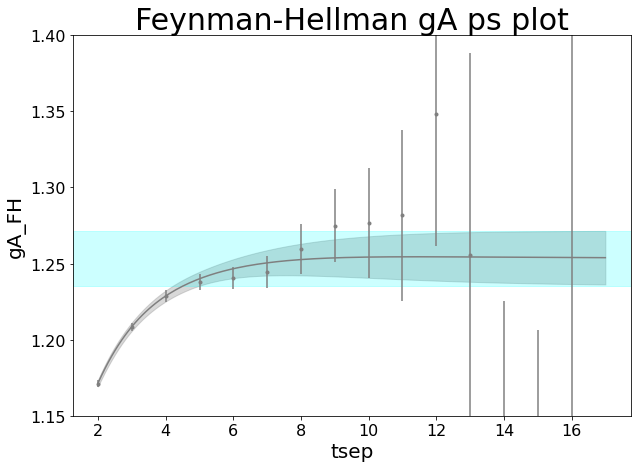

<Figure size 432x288 with 0 Axes>

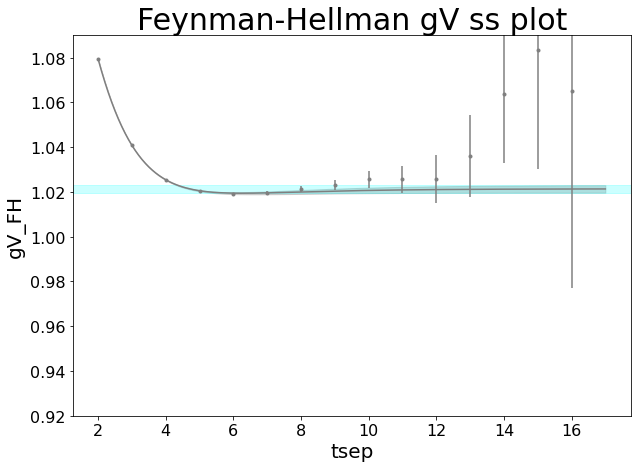

<Figure size 432x288 with 0 Axes>

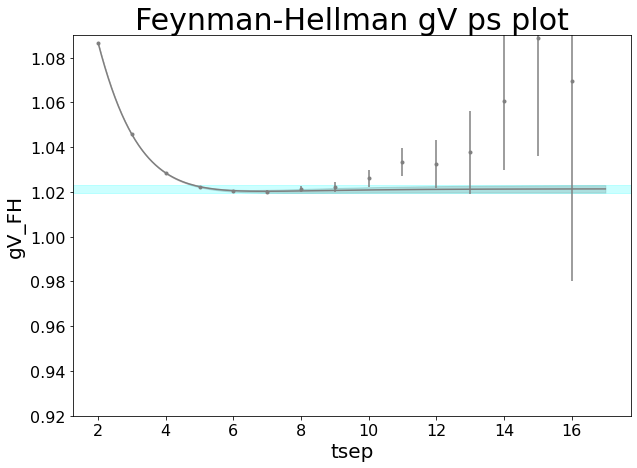

<Figure size 432x288 with 0 Axes>

In [177]:
# 2pt-3pt-FH, chained, tau1
fitcurvedata(fit_2pt3ptFHchained_tau1)
g00A3_fitres = fit_2pt3ptFHchained_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptFHchained_tau1.p['gV4_00']
file_format_string = "chained_2pt_3pt_FH_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

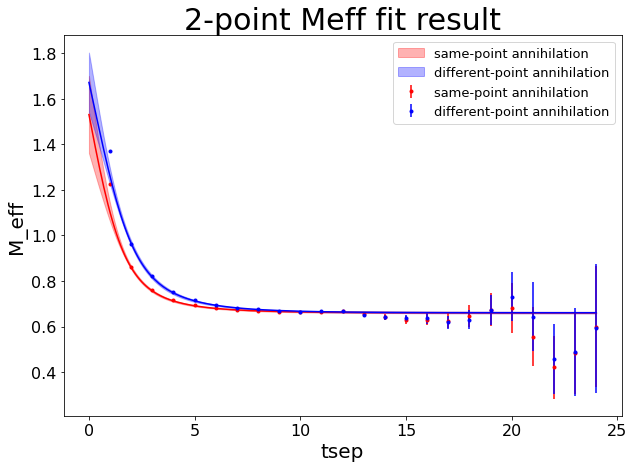

<Figure size 432x288 with 0 Axes>

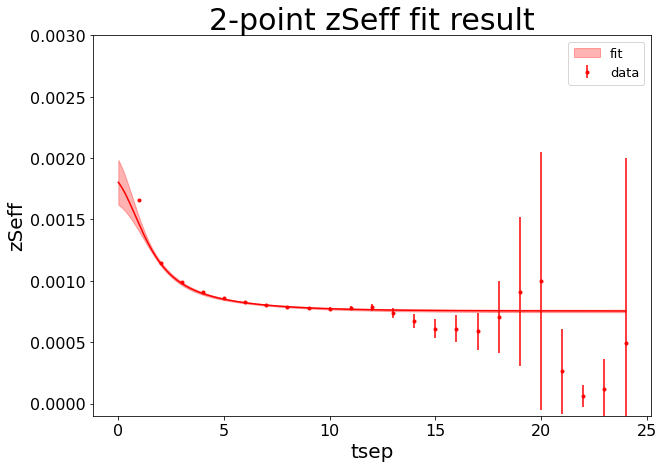

<Figure size 432x288 with 0 Axes>

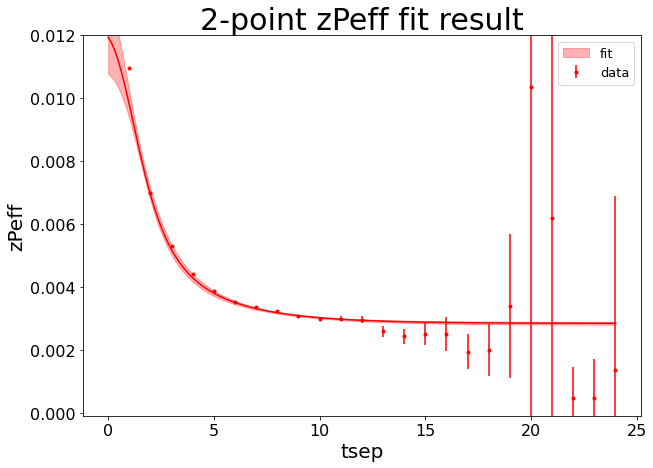

<Figure size 432x288 with 0 Axes>

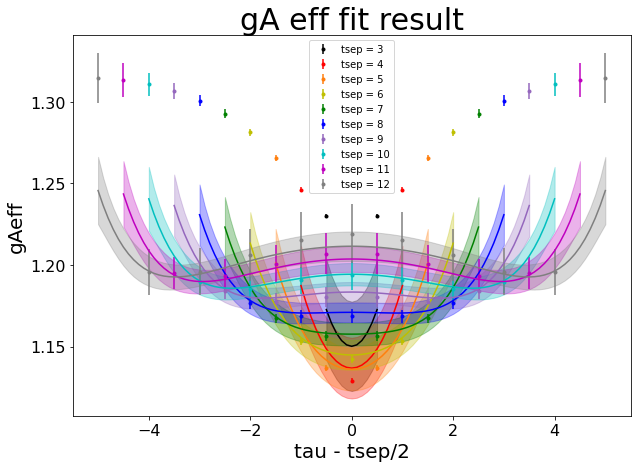

<Figure size 432x288 with 0 Axes>

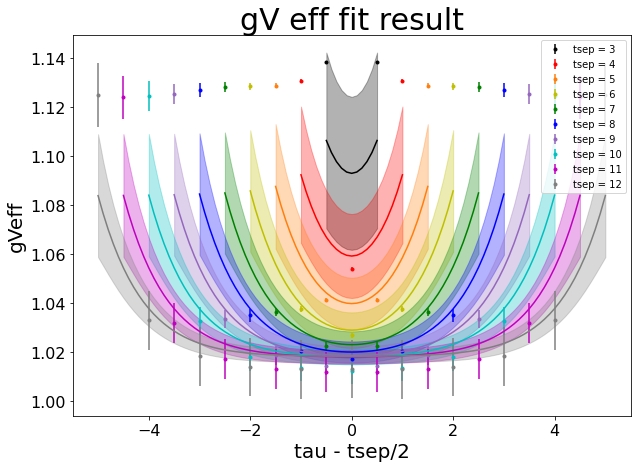

<Figure size 432x288 with 0 Axes>

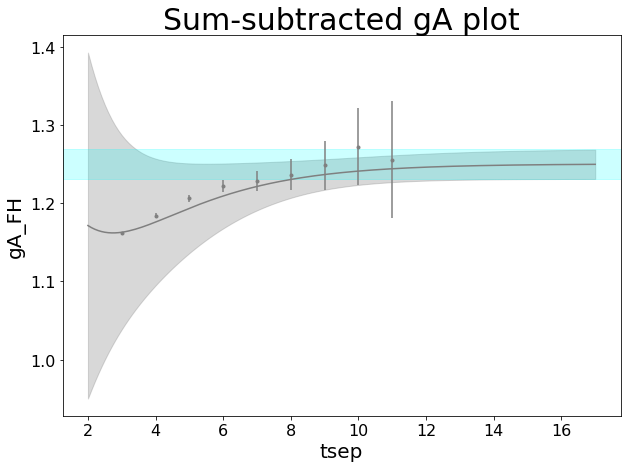

<Figure size 432x288 with 0 Axes>

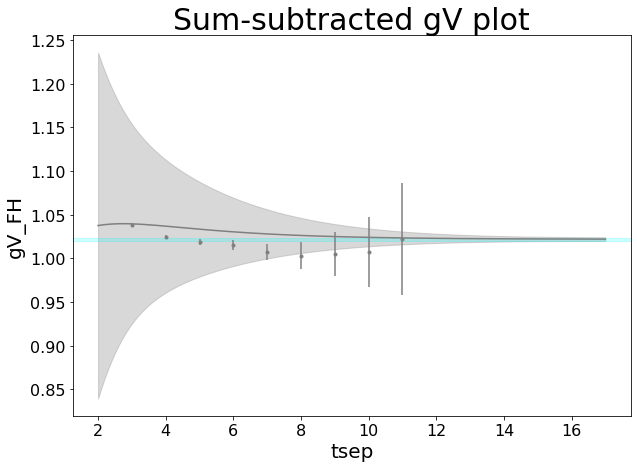

<Figure size 432x288 with 0 Axes>

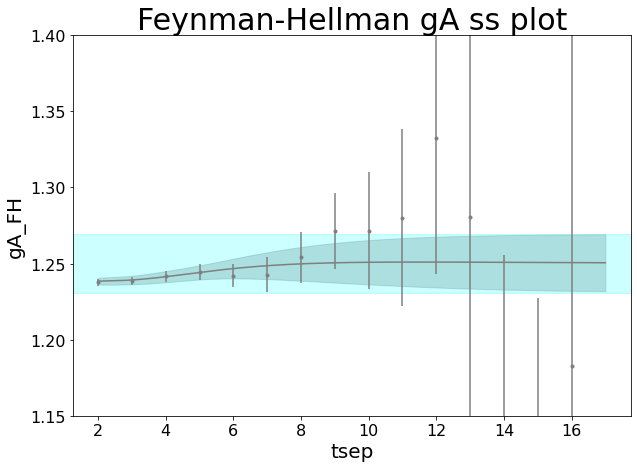

<Figure size 432x288 with 0 Axes>

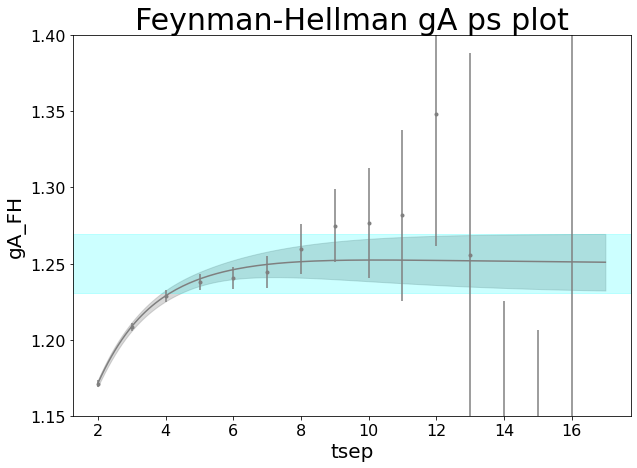

<Figure size 432x288 with 0 Axes>

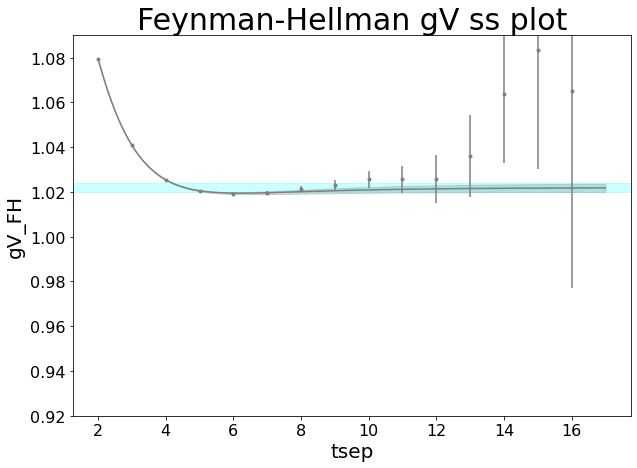

<Figure size 432x288 with 0 Axes>

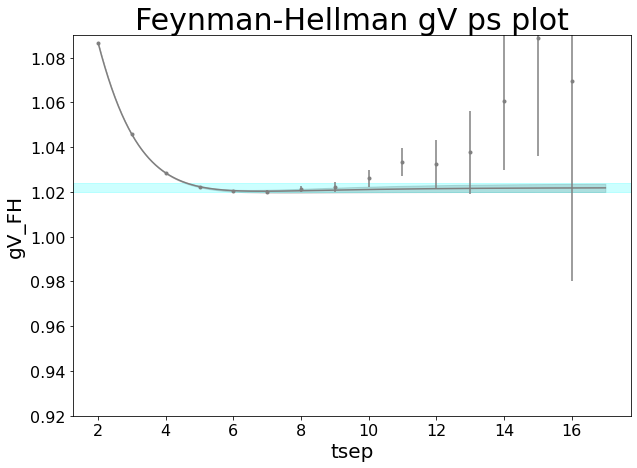

<Figure size 432x288 with 0 Axes>

In [178]:
# 2pt-3pt-FH, chained, tau2
fitcurvedata(fit_2pt3ptFHchained_tau2)
g00A3_fitres = fit_2pt3ptFHchained_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptFHchained_tau2.p['gV4_00']
file_format_string = "chained_2pt_3pt_FH_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

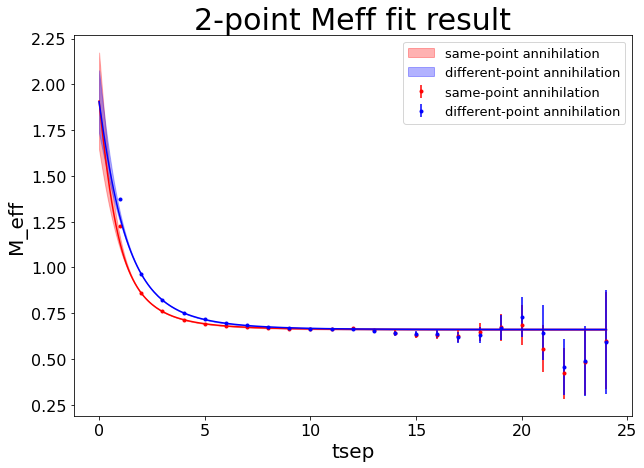

<Figure size 432x288 with 0 Axes>

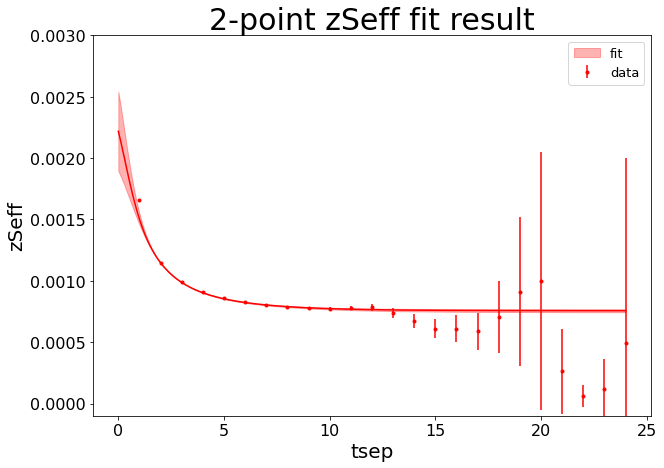

<Figure size 432x288 with 0 Axes>

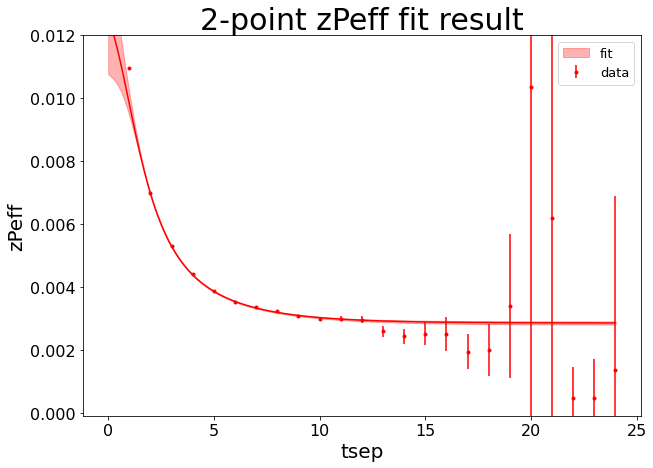

<Figure size 432x288 with 0 Axes>

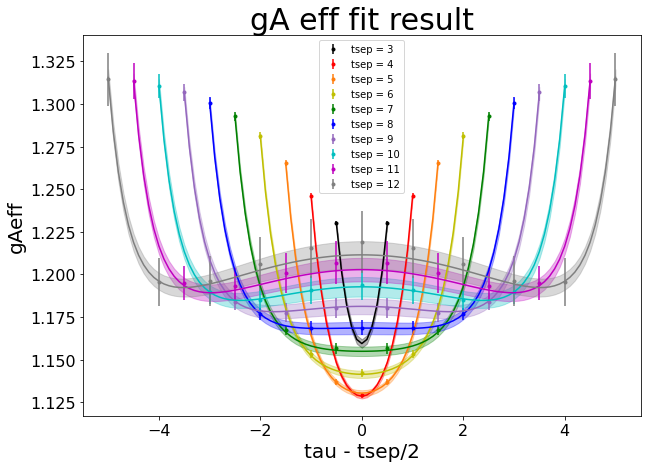

<Figure size 432x288 with 0 Axes>

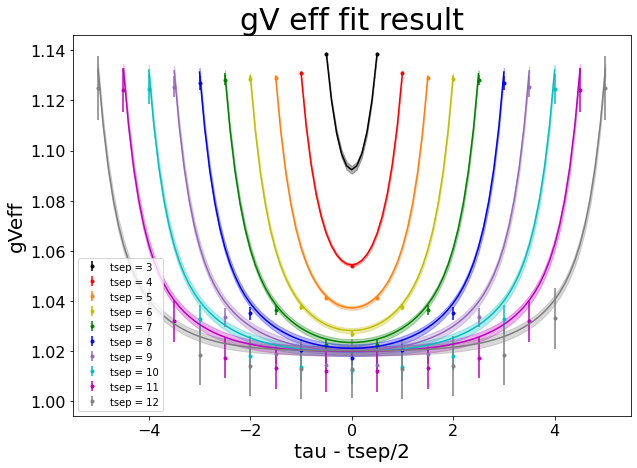

<Figure size 432x288 with 0 Axes>

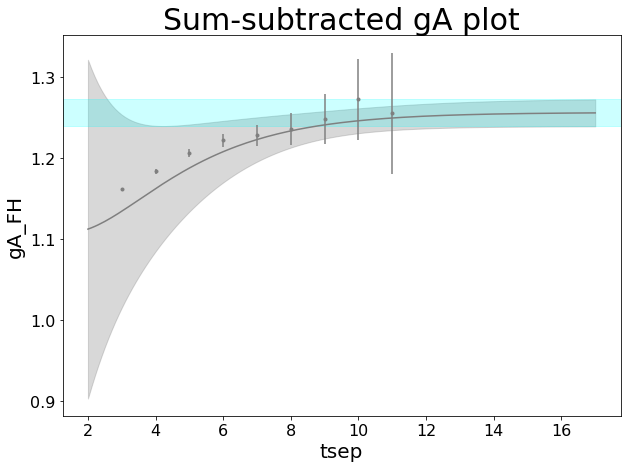

<Figure size 432x288 with 0 Axes>

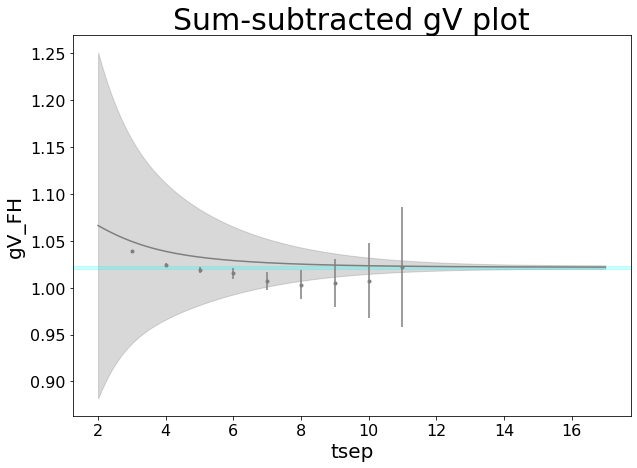

<Figure size 432x288 with 0 Axes>

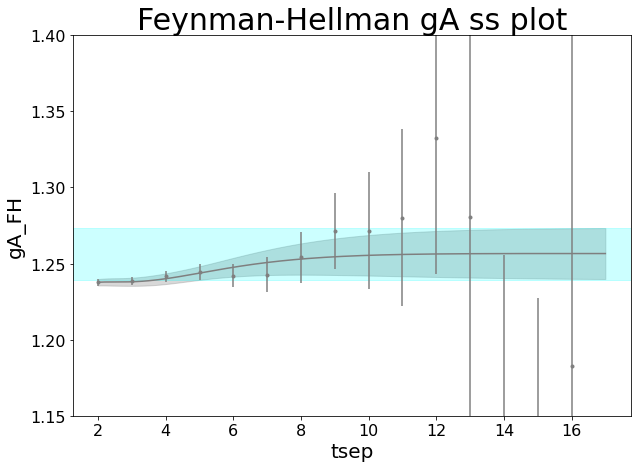

<Figure size 432x288 with 0 Axes>

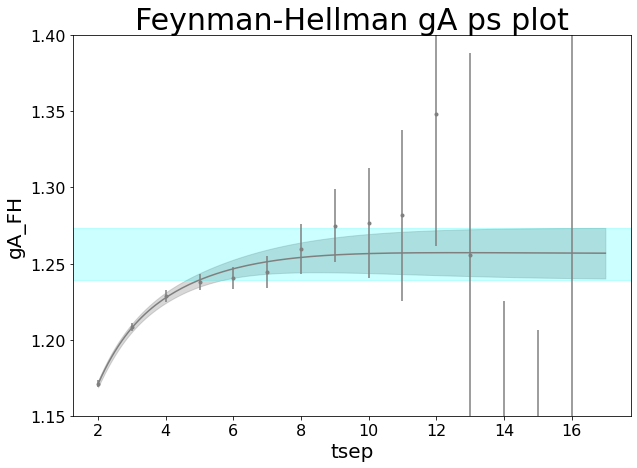

<Figure size 432x288 with 0 Axes>

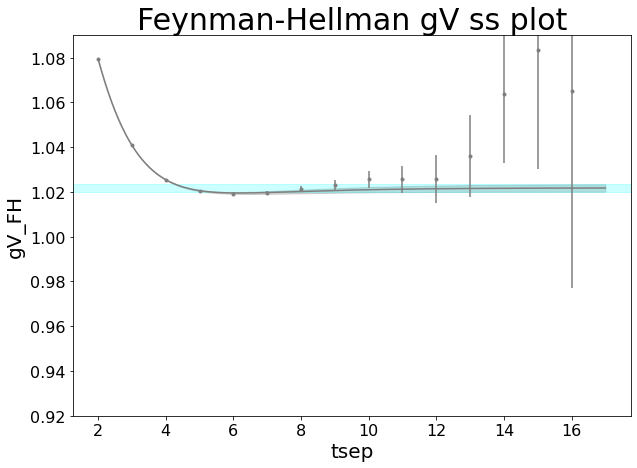

<Figure size 432x288 with 0 Axes>

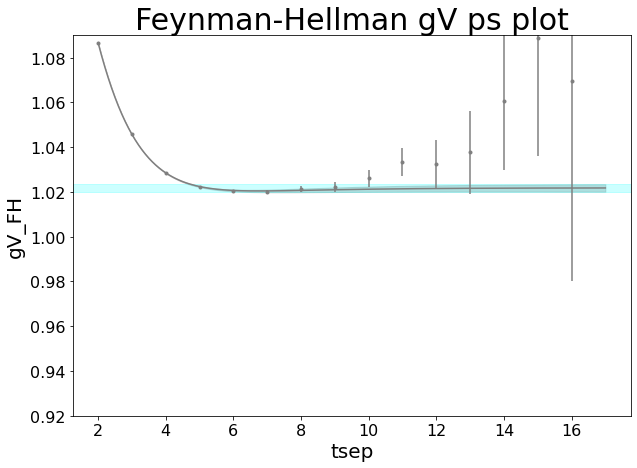

<Figure size 432x288 with 0 Axes>

In [179]:
# 2pt-3pt-FH, simultaneous, tau1
fitcurvedata(fit_2pt3ptFHsimul_tau1)
g00A3_fitres = fit_2pt3ptFHsimul_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptFHsimul_tau1.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_FH_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 


<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

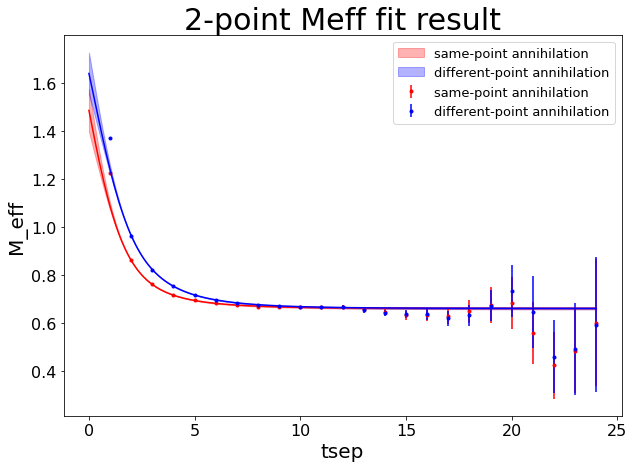

<Figure size 432x288 with 0 Axes>

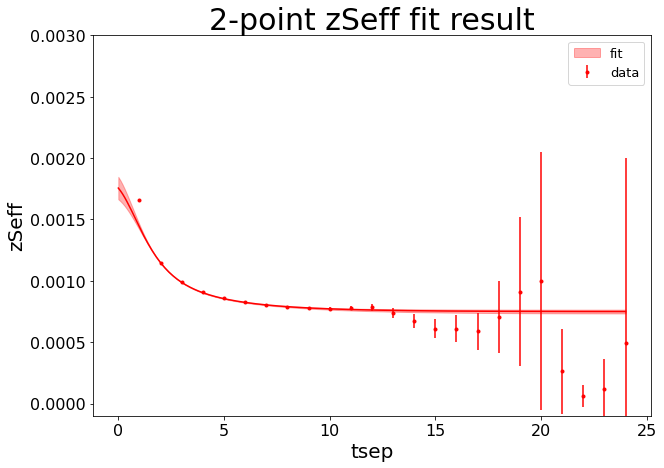

<Figure size 432x288 with 0 Axes>

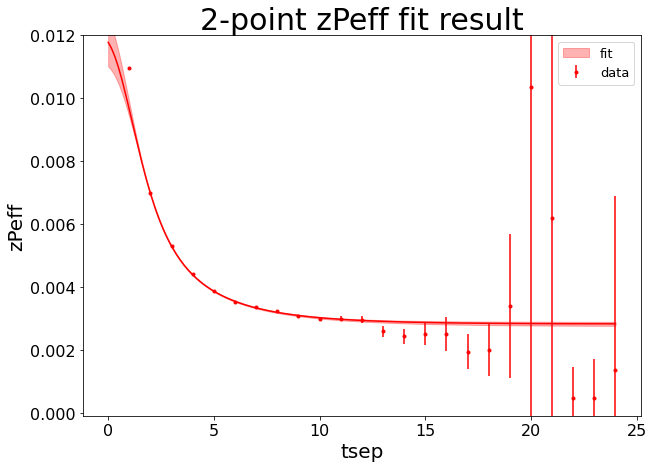

<Figure size 432x288 with 0 Axes>

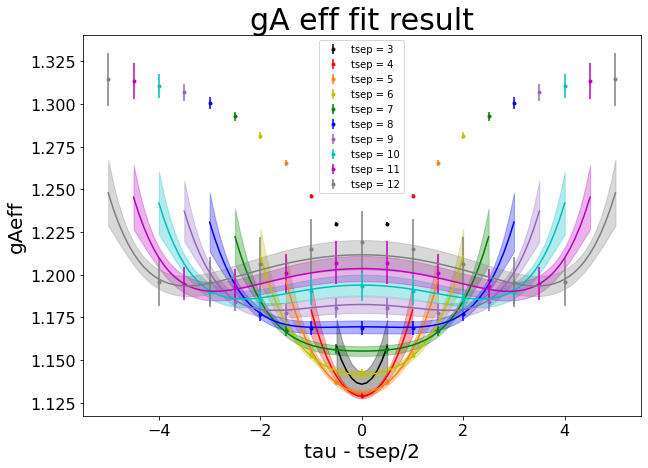

<Figure size 432x288 with 0 Axes>

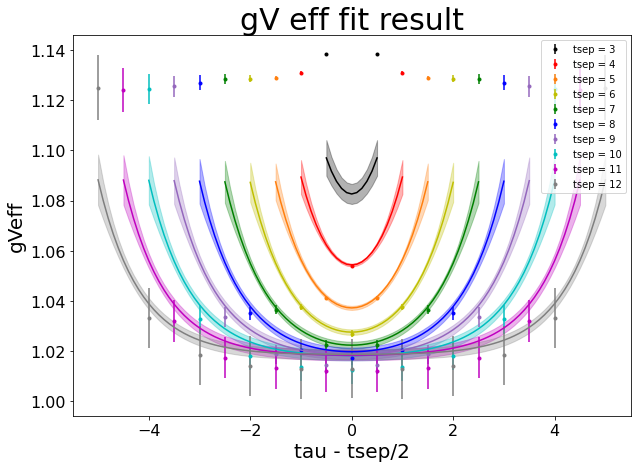

<Figure size 432x288 with 0 Axes>

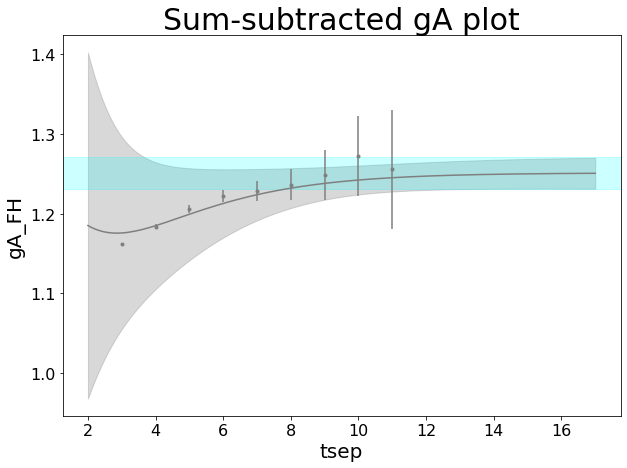

<Figure size 432x288 with 0 Axes>

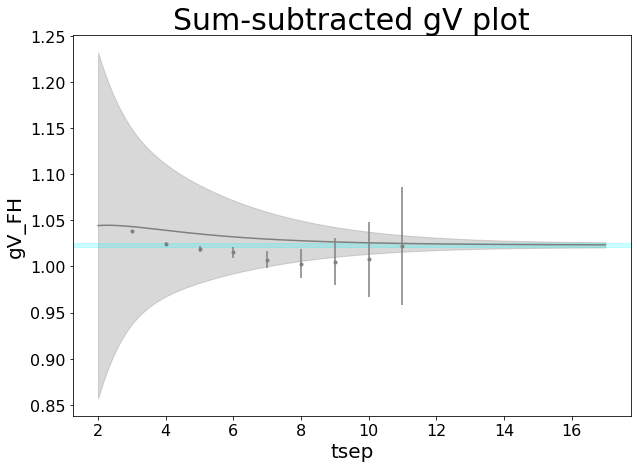

<Figure size 432x288 with 0 Axes>

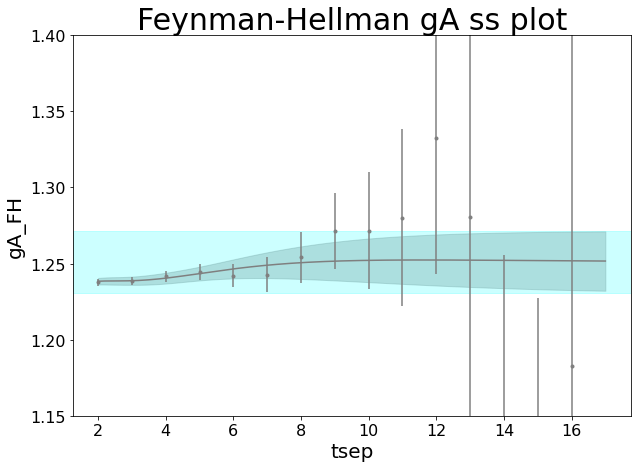

<Figure size 432x288 with 0 Axes>

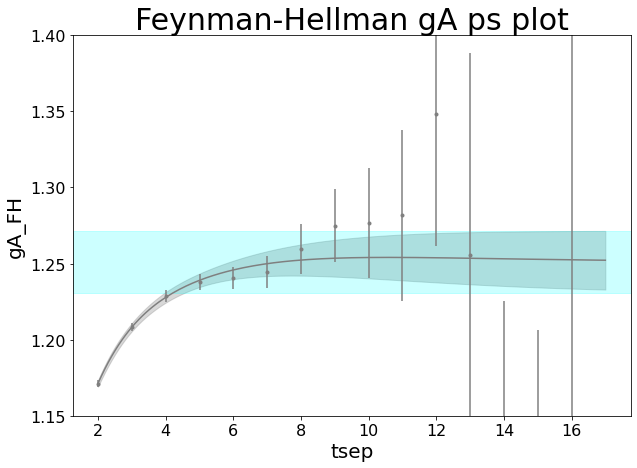

<Figure size 432x288 with 0 Axes>

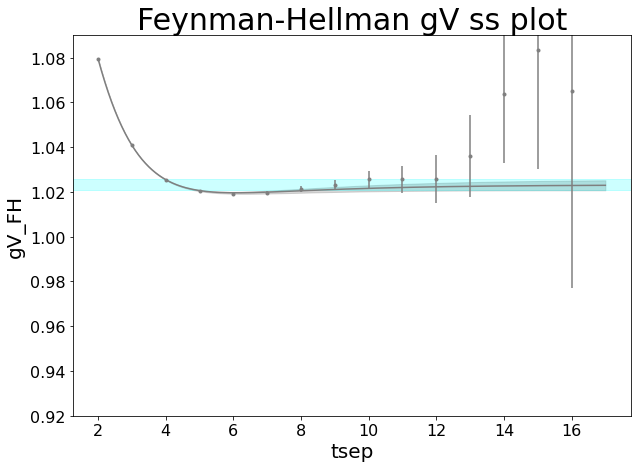

<Figure size 432x288 with 0 Axes>

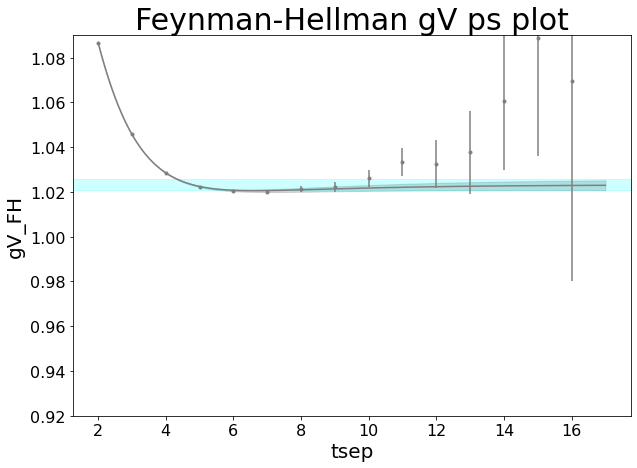

<Figure size 432x288 with 0 Axes>

In [180]:
# 2pt-3pt-FH, simultaneous, tau2
fitcurvedata(fit_2pt3ptFHsimul_tau2)
g00A3_fitres = fit_2pt3ptFHsimul_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptFHsimul_tau2.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_FH_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 



<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

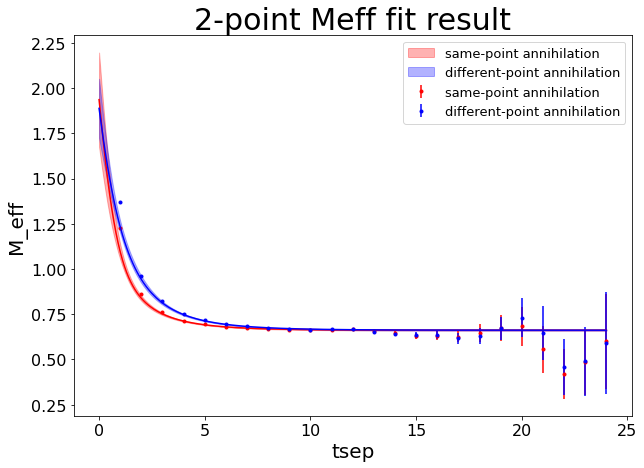

<Figure size 432x288 with 0 Axes>

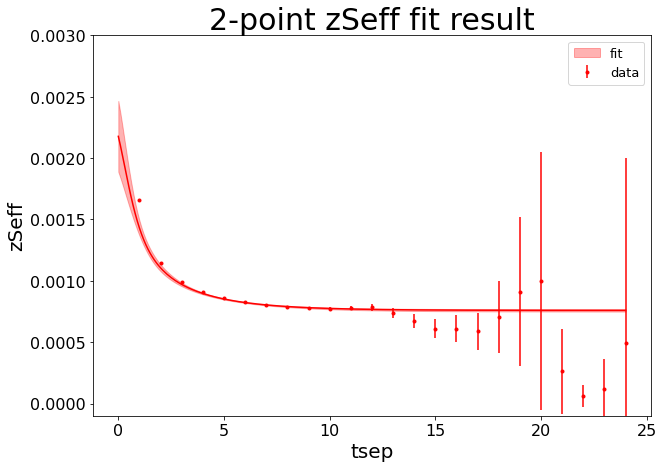

<Figure size 432x288 with 0 Axes>

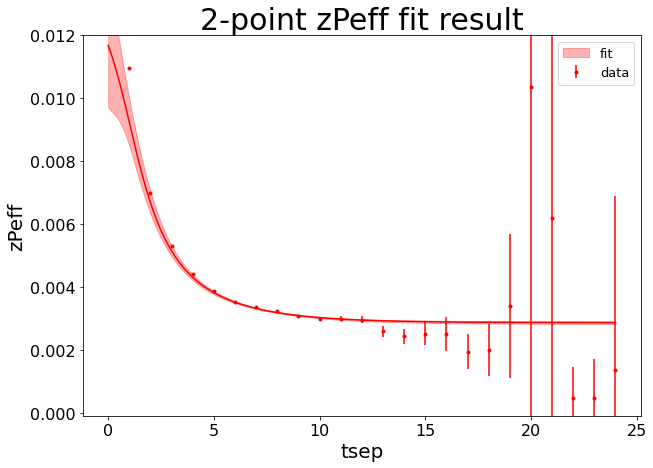

<Figure size 432x288 with 0 Axes>

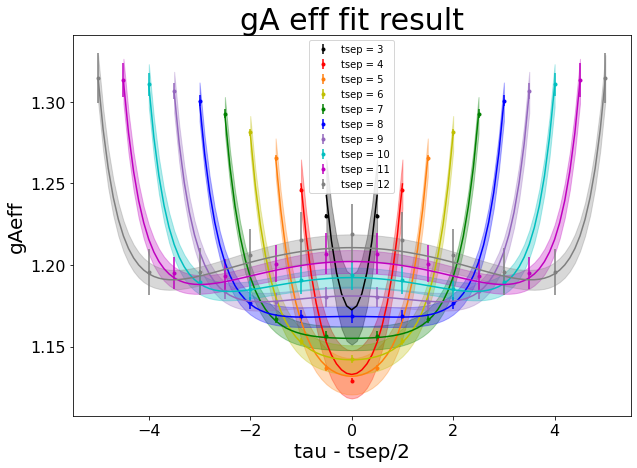

<Figure size 432x288 with 0 Axes>

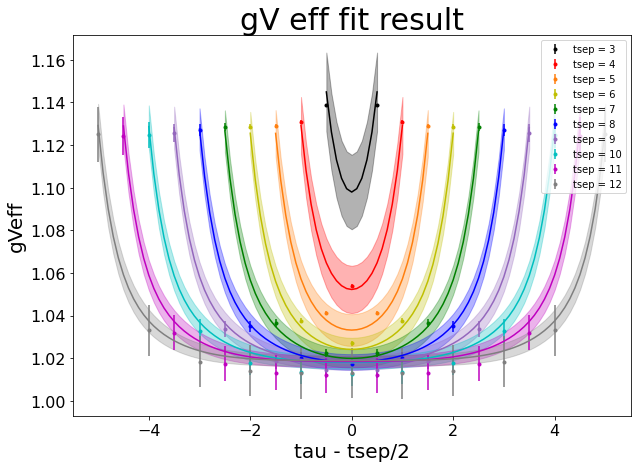

<Figure size 432x288 with 0 Axes>

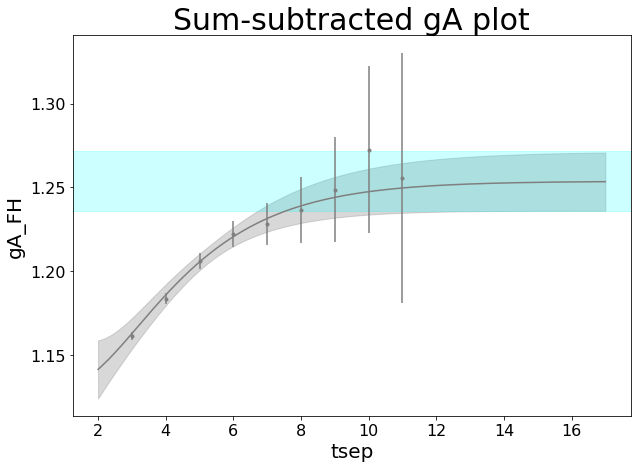

<Figure size 432x288 with 0 Axes>

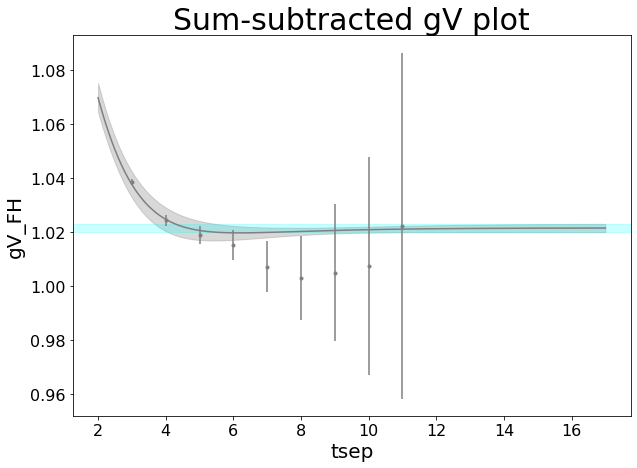

<Figure size 432x288 with 0 Axes>

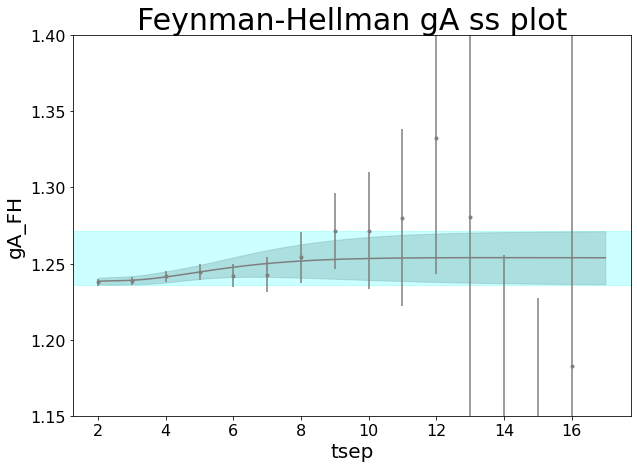

<Figure size 432x288 with 0 Axes>

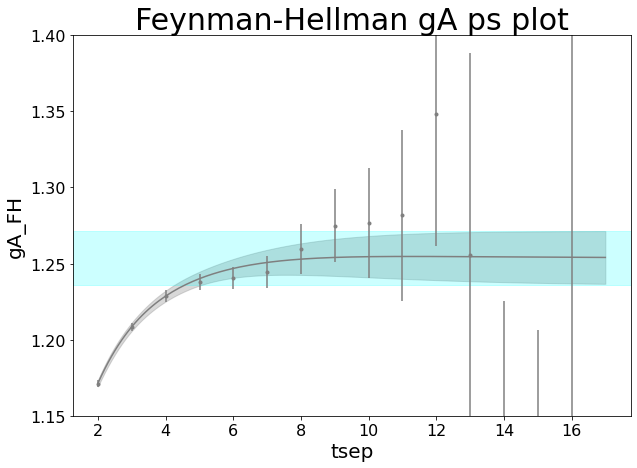

<Figure size 432x288 with 0 Axes>

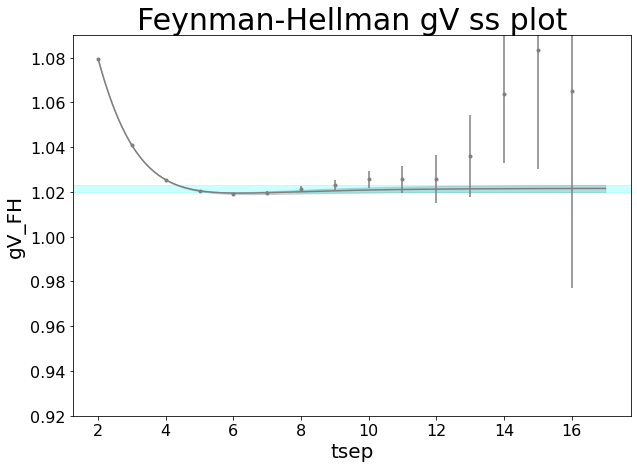

<Figure size 432x288 with 0 Axes>

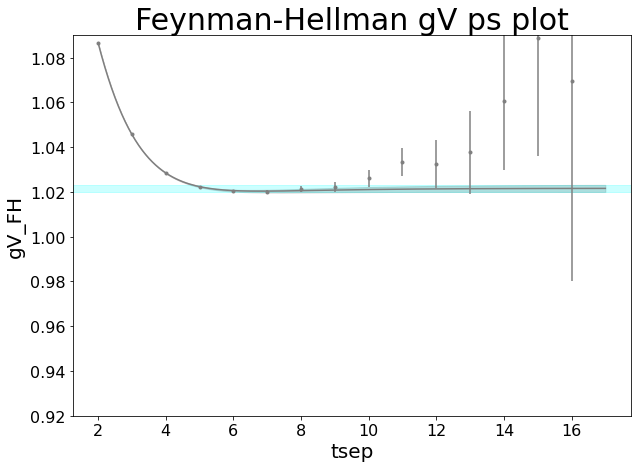

<Figure size 432x288 with 0 Axes>

In [181]:
# 2pt-3pt-sumsub-FH, chained, tau1
fitcurvedata(fit_2pt3ptsumsubFHchained_tau1)
g00A3_fitres = fit_2pt3ptsumsubFHchained_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubFHchained_tau1.p['gV4_00']
file_format_string = "chained_2pt_3pt_sumsub_FH_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

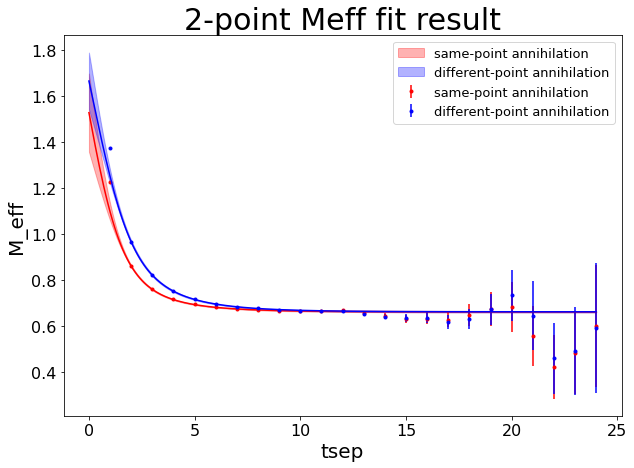

<Figure size 432x288 with 0 Axes>

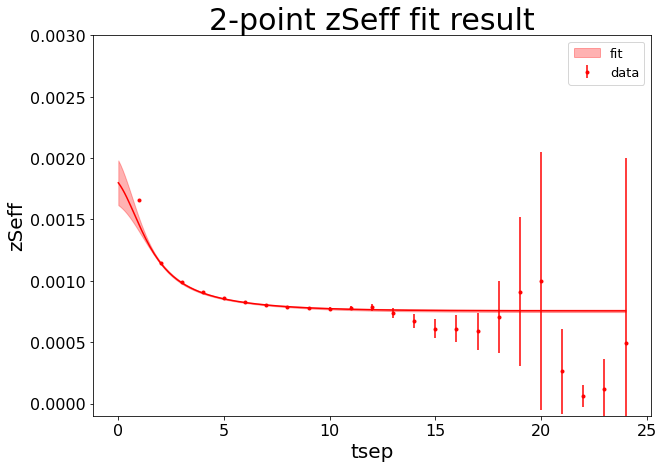

<Figure size 432x288 with 0 Axes>

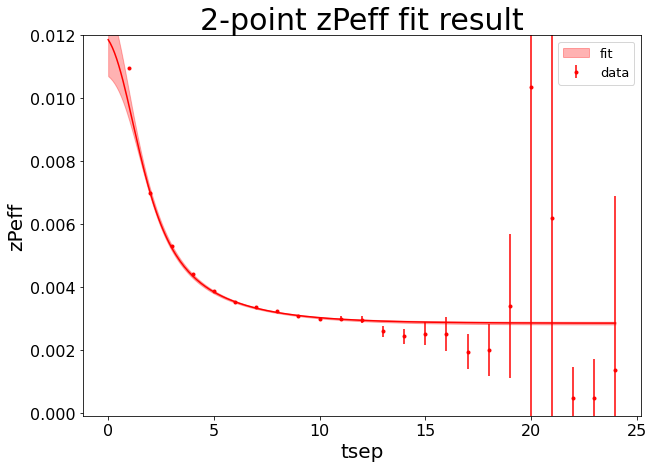

<Figure size 432x288 with 0 Axes>

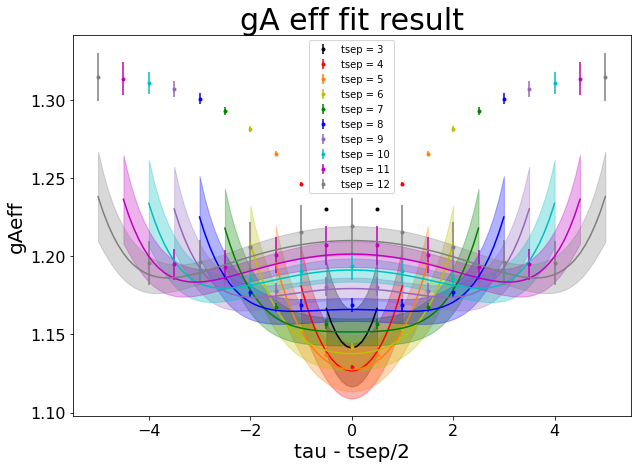

<Figure size 432x288 with 0 Axes>

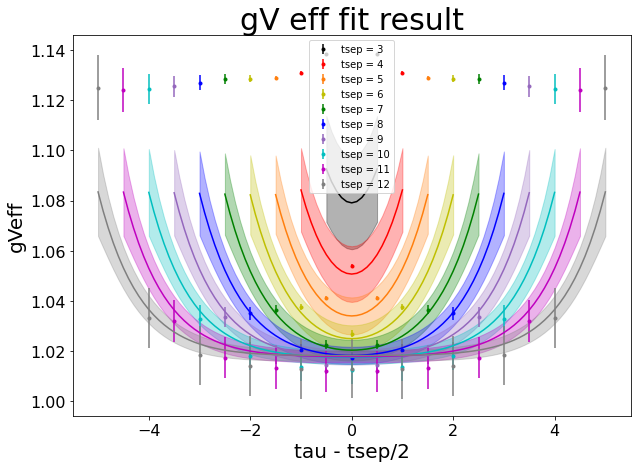

<Figure size 432x288 with 0 Axes>

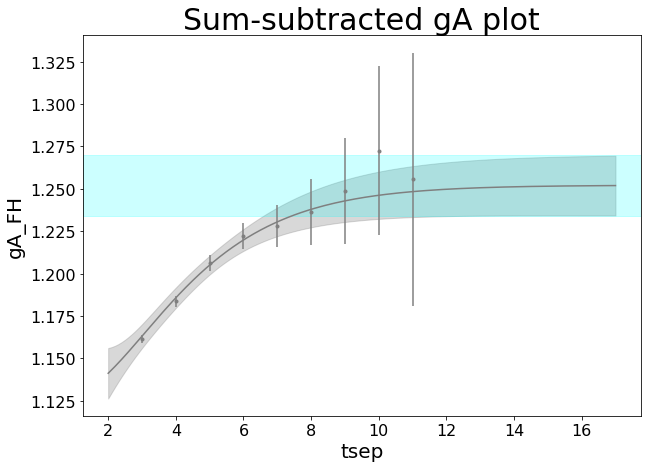

<Figure size 432x288 with 0 Axes>

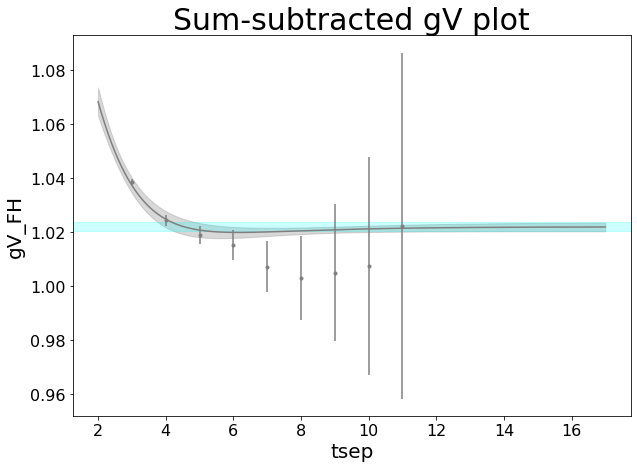

<Figure size 432x288 with 0 Axes>

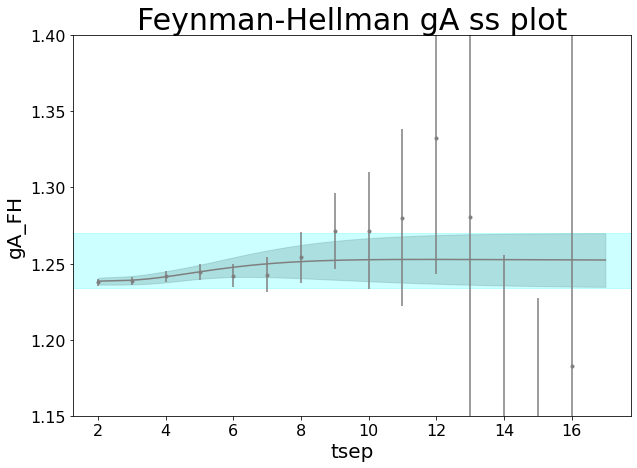

<Figure size 432x288 with 0 Axes>

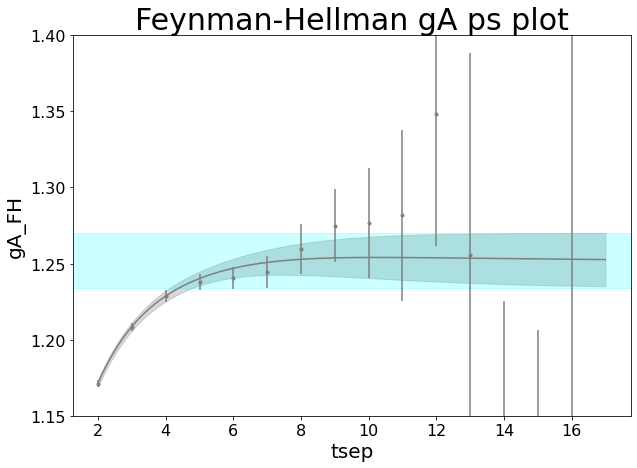

<Figure size 432x288 with 0 Axes>

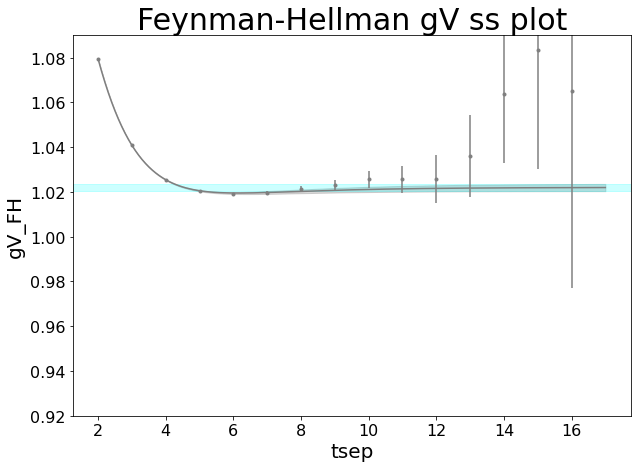

<Figure size 432x288 with 0 Axes>

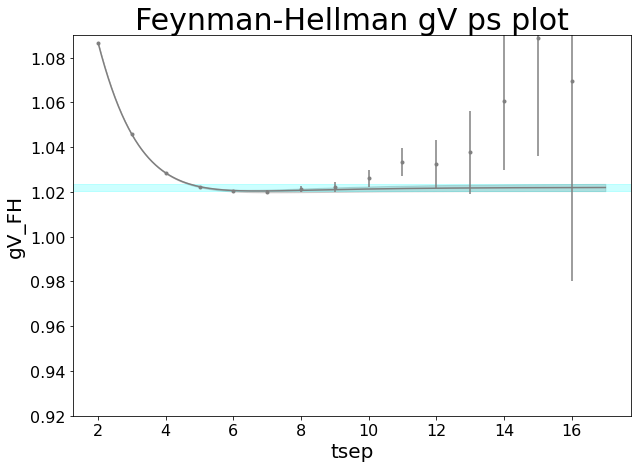

<Figure size 432x288 with 0 Axes>

In [182]:
# 2pt-3pt-sumsub-FH, chained, tau2
fitcurvedata(fit_2pt3ptsumsubFHchained_tau2)
g00A3_fitres = fit_2pt3ptsumsubFHchained_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubFHchained_tau2.p['gV4_00']
file_format_string = "chained_2pt_3pt_sumsub_FH_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 

<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

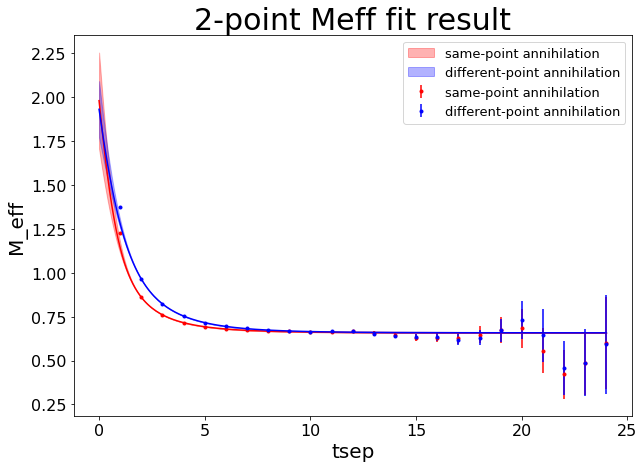

<Figure size 432x288 with 0 Axes>

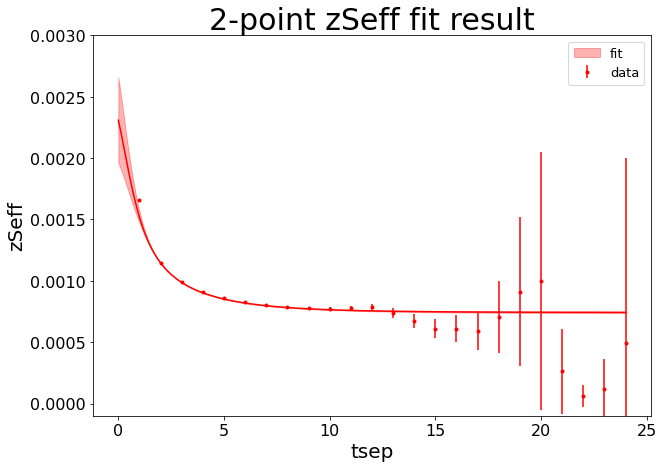

<Figure size 432x288 with 0 Axes>

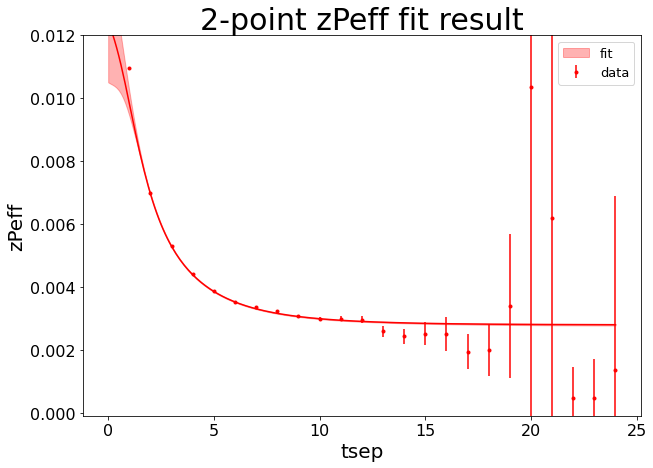

<Figure size 432x288 with 0 Axes>

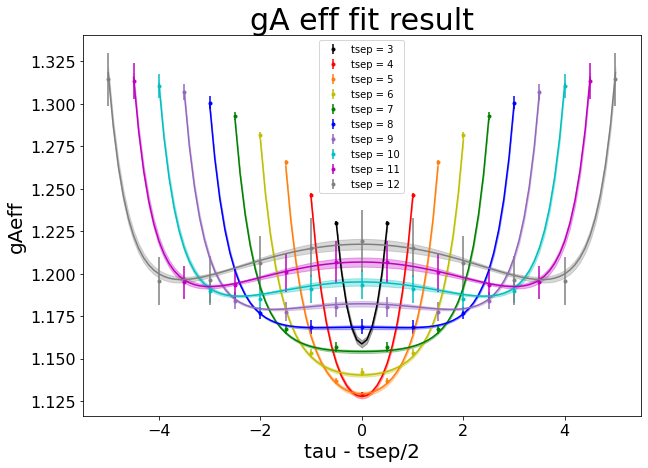

<Figure size 432x288 with 0 Axes>

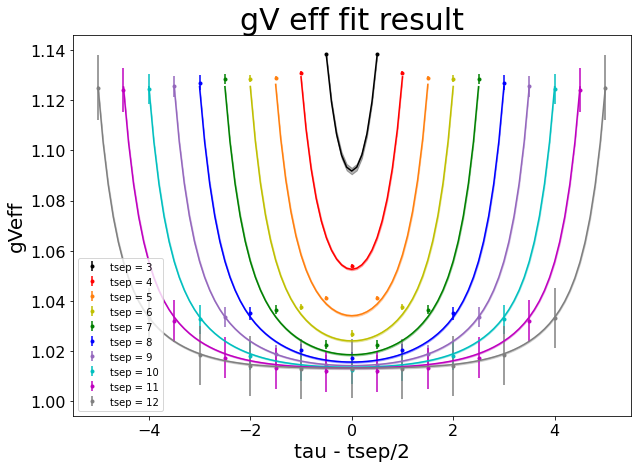

<Figure size 432x288 with 0 Axes>

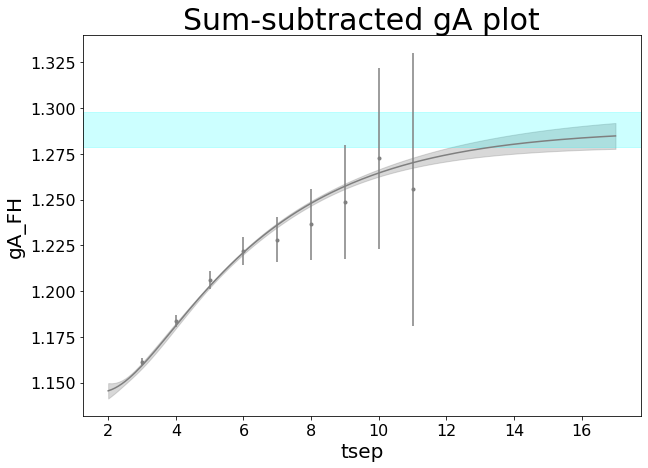

<Figure size 432x288 with 0 Axes>

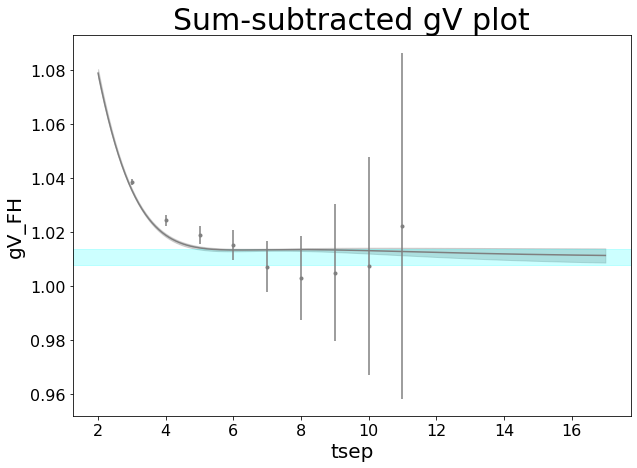

<Figure size 432x288 with 0 Axes>

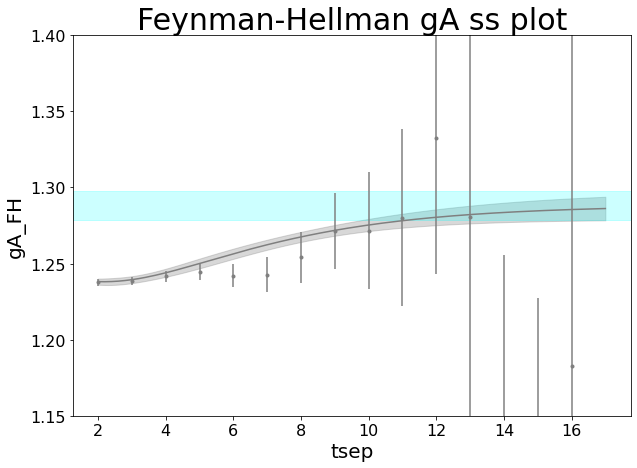

<Figure size 432x288 with 0 Axes>

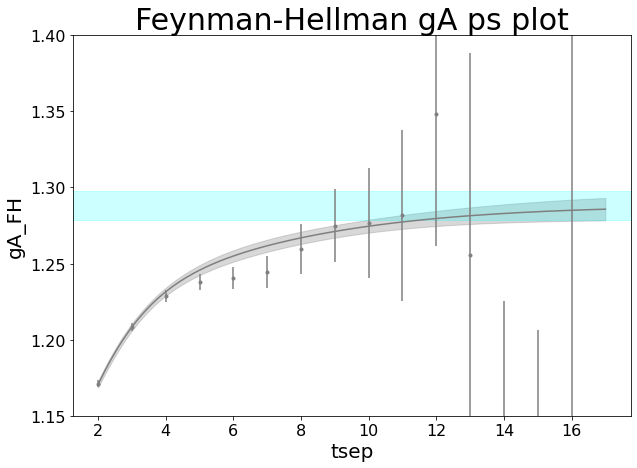

<Figure size 432x288 with 0 Axes>

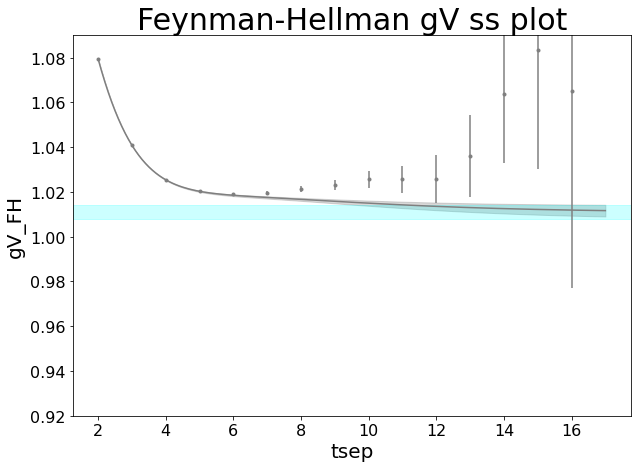

<Figure size 432x288 with 0 Axes>

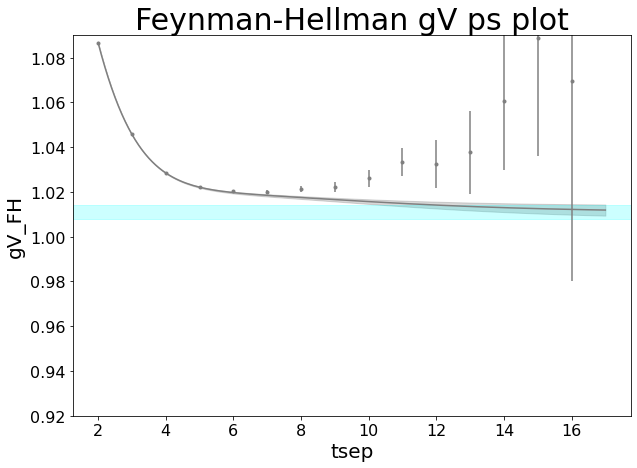

<Figure size 432x288 with 0 Axes>

In [183]:
# 2pt-3pt-sumsub-FH, simultaneous, tau1
fitcurvedata(fit_2pt3ptsumsubFHsimul_tau1)
g00A3_fitres = fit_2pt3ptsumsubFHsimul_tau1.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubFHsimul_tau1.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_sumsub_FH_tau1"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 


<ipython-input-151-5efa805b432e>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
<ipython-input-168-a7795e6c436d>:117: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
<ipython-input-168-a7795e6c436d>:118: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tu

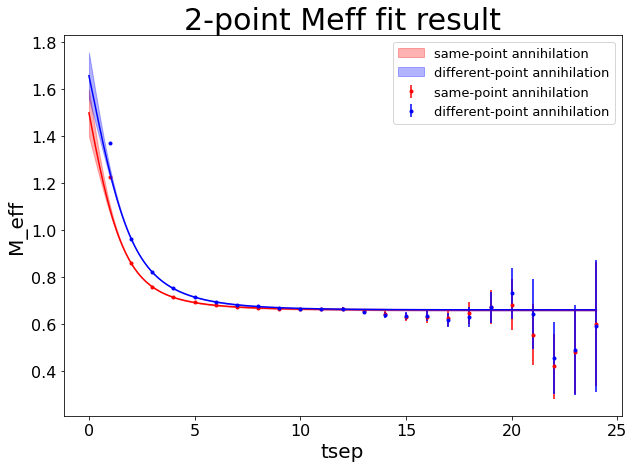

<Figure size 432x288 with 0 Axes>

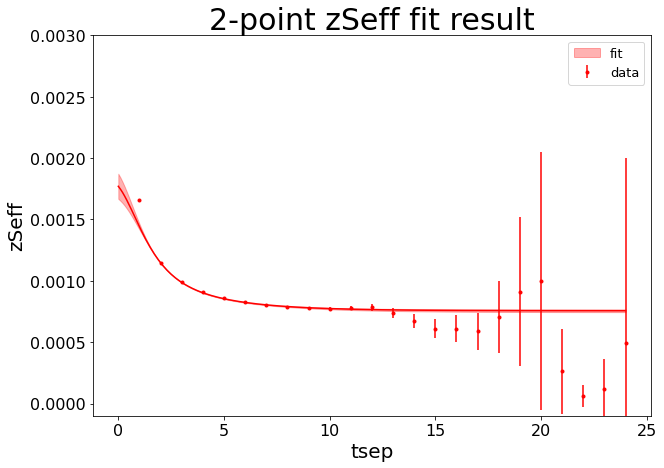

<Figure size 432x288 with 0 Axes>

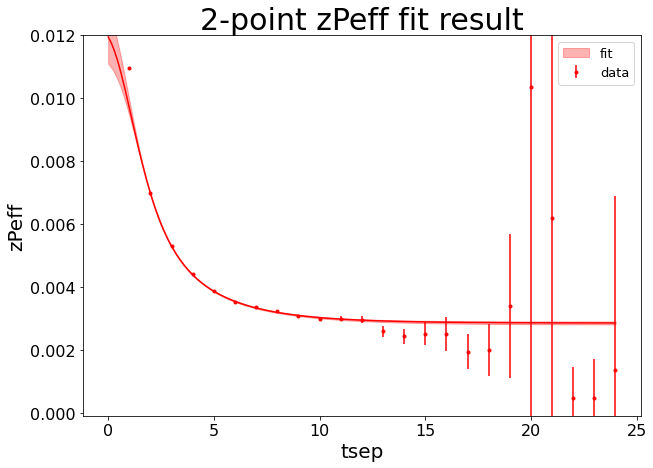

<Figure size 432x288 with 0 Axes>

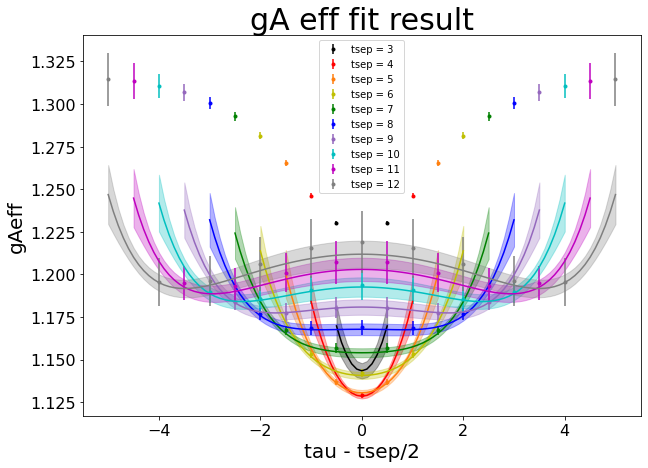

<Figure size 432x288 with 0 Axes>

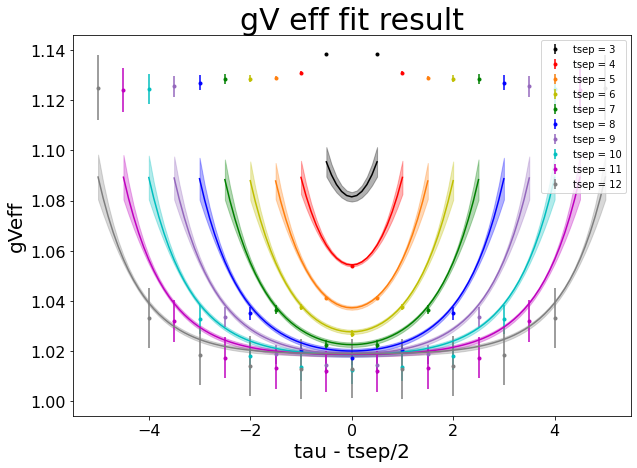

<Figure size 432x288 with 0 Axes>

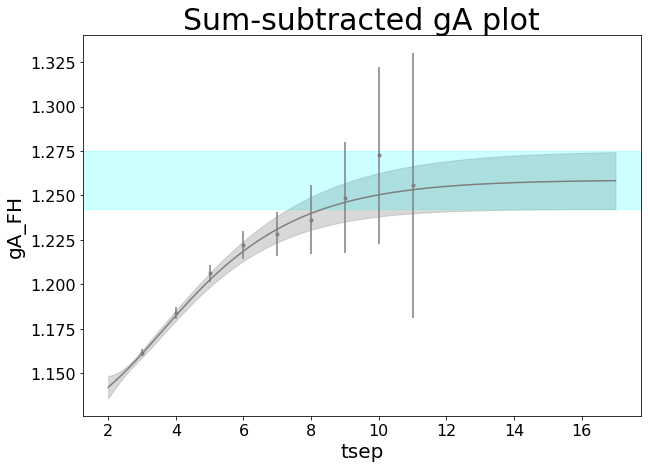

<Figure size 432x288 with 0 Axes>

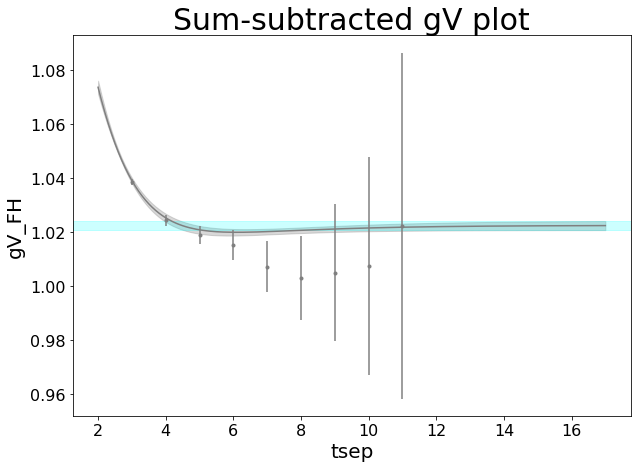

<Figure size 432x288 with 0 Axes>

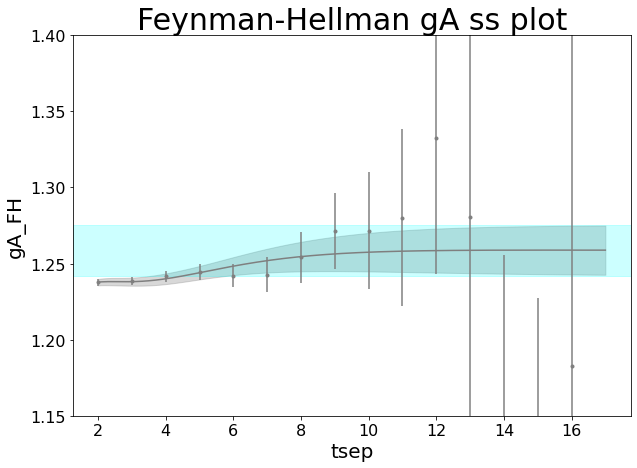

<Figure size 432x288 with 0 Axes>

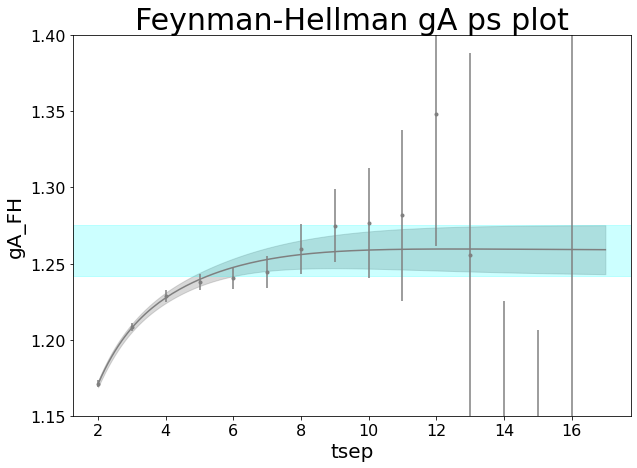

<Figure size 432x288 with 0 Axes>

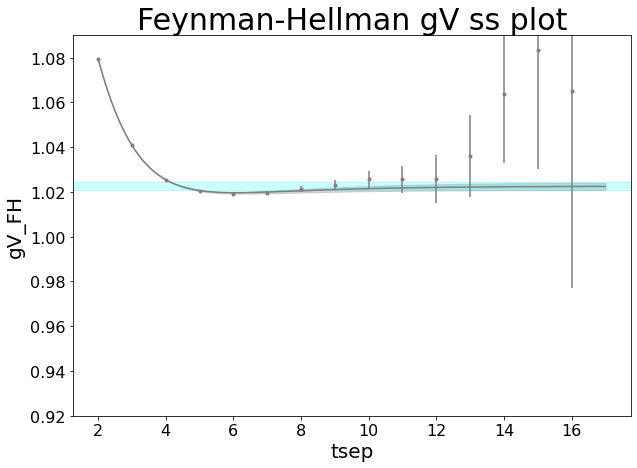

<Figure size 432x288 with 0 Axes>

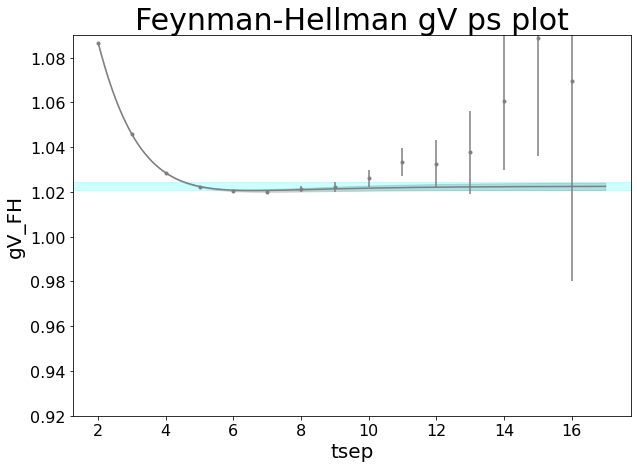

<Figure size 432x288 with 0 Axes>

In [184]:
# 2pt-3pt-sumsub-FH, simultaneous, tau2
fitcurvedata(fit_2pt3ptsumsubFHsimul_tau2)
g00A3_fitres = fit_2pt3ptsumsubFHsimul_tau2.p['gA3_00']
g00V4_fitres = fit_2pt3ptsumsubFHsimul_tau2.p['gV4_00']
file_format_string = "simultaneous_2pt_3pt_sumsub_FH_tau2"

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename='{}_meff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zSeff.png'.format(file_format_string))
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename='{}_zPeff.png'.format(file_format_string))

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt_data, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt, filename='{}_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt_data, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt, filename='{}_gV.png'.format(file_format_string)) 

h5_dm.fit_data_plot("Sum-subtracted gA plot", "tsep", "gA_FH", x_CFH_data, y_CFH_A3, t_FH_model, CFH_A3_model_mean, CFH_A3_model_upbound, CFH_A3_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_CFH_A3_err, filename='{}_sumsub_gA.png'.format(file_format_string)) 
h5_dm.fit_data_plot("Sum-subtracted gV plot", "tsep", "gV_FH", x_CFH_data, y_CFH_V4, t_FH_model, CFH_V4_model_mean, CFH_V4_model_upbound, CFH_V4_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_CFH_V4_err, filename='{}_sumsub_gV.png'.format(file_format_string))

h5_dm.fit_data_plot("Feynman-Hellman gA ss plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ss, t_FH_model, FH_A3_ss_model_mean, FH_A3_ss_model_upbound, FH_A3_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ss_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gA ps plot", "tsep", "gA_FH", x_FHdata, y_FHdata_A3_ps, t_FH_model, FH_A3_ps_model_mean, FH_A3_ps_model_upbound, FH_A3_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00A3_fitres, ydat_error=y_FHdata_A3_ps_err, ylim = [1.15, 1.4], filename = "{}_FHgA_ps.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ss plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ss, t_FH_model, FH_V4_ss_model_mean, FH_V4_ss_model_upbound, FH_V4_ss_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ss_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ss.png".format(file_format_string)) 
h5_dm.fit_data_plot("Feynman-Hellman gV ps plot", "tsep", "gV_FH", x_FHdata, y_FHdata_V4_ps, t_FH_model, FH_V4_ps_model_mean, FH_V4_ps_model_upbound, FH_V4_ps_model_lowbound, "tab:grey", 30, 20, 16, 13, g00 = g00V4_fitres, ydat_error=y_FHdata_V4_ps_err, ylim = [0.92, 1.09], filename = "{}_FHgV_ps.png".format(file_format_string)) 



## Now, try with just tau2

In [185]:
# Set priors, p0, and number of states
num_zs = 4
num_states_FH = 3

prior = h5_dm.prior(num_zs, num_states_FH, 0.7, 0)

In [186]:
p0_params = gv.BufferDict({'E0': 0.6617567766314842, \
    'log(dE1)': -0.8548658771136517, 'Z0': 0.0007617563980261431, \
    'Z1': 0.0004883977270801864, 'Ztilde0': 0.0028842561467822933, \
    'Ztilde1': 0.003365195472457867, 'log(dE2)': -1.4077173384882726, \
    'Z2': 0.0006629440306489769, 'Ztilde2': 0.0050590048126152075, \
    'log(dE3)': -0.6838609033931206, 'Z3': 0.0008194953430960745, \
    'Ztilde3': 0.004443272257123214, 'log(dE4)': -0.2705973550754727, \
    'Z4': 0.0005968484586151365, 'Ztilde4': 0.0016921347818215956, \
    'log(dE5)': -0.39847471574741816, 'Z5': 0.0005694014129102672, \
    'Ztilde5': 0.001515544373152329, 'log(dE6)': -0.6637081825300879, \
    'Z6': 0.0010593709905844487, 'Ztilde6': 0.0015039989902755385, \
    'log(FH_dEmax)': -1.4682355586903006, 'Z_FHmax': 0.0006747164121628768, 
    'Ztilde_FHmax': 0.002250366709380576, 'gA3_00': 1.2550093555583386, 
    'gV4_00': 1.0191686628313321, 'gA3_10': -0.5260083113038311, 'gV4_10': -0.06068322352185714, \
    'gA3_11': 0.5064384335051849, 'gV4_11': 1.0424024349759882, 'gA3_20': 0.3322177498093845, \
    'gV4_20': 0.060839430066221306, 'gA3_21': 0.4987857047670498, 'gV4_21': -0.029222335592674217, \
    'gA3_22': 0.4247112559654253, 'gV4_22': 1.0046796587599043, 'gA3_30': 0.1025866822872079, \
    'gV4_30': 0.22615734422106137, 'gA3_31': -0.14915095447823545, 'gV4_31': 0.3559377986698973, \
    'gA3_32': 0.3062526272899807, 'gV4_32': -0.18146492849916585, 'gA3_33': -0.07122514129230165, \
    'gV4_33': 0.9355803551890408, 'gA3_40': -0.05768897273264351, 'gV4_40': -0.4949747922875058, \
    'gA3_41': 0.17342839855628278, 'gV4_41': -0.3808638938225657, 'gA3_42': 0.5238029625069766, \
    'gV4_42': 0.12711696310316034, 'gA3_43': 0.24611295420276746, 'gV4_43': -0.4528172064554094, \
    'gA3_44': 0.0014549537920397293, 'gV4_44': 1.0000635980569552, 'gA3_50': 0.5546329174974541, \
    'gV4_50': 0.2034197097588737, 'gA3_51': 0.17227806717303007, 'gV4_51': -0.07592573354761906, \
    'gA3_52': 0.3173879762080402, 'gV4_52': 0.2872903425065635, 'gA3_53': 0.1772747371475792, \
    'gV4_53': -0.12365809997329825, 'gA3_54': 0.00034743015758316757, 'gV4_54': -0.019193060581007074, \
    'gA3_55': -0.0021646049623887365, 'gV4_55': 0.9991520906178137, 'gA3_60': 1.2694916263510245, \
    'gV4_60': 1.2348618944973726, 'gA3_61': 0.27684355137235217, 'gV4_61': 0.403470596667472, \
    'gA3_62': 0.3903799515678837, 'gV4_62': 0.8661543437770807, 'gA3_63': 0.23262056980845133, \
    'gV4_63': 0.18990689946487704, 'gA3_64': 0.007773758913978042, 'gV4_64': 0.04698649546084038, \
    'gA3_65': -0.003212653412470248, 'gV4_65': -0.03356640452924038, 'gA3_66': -0.0015881153456177278, \
    'gV4_66': 0.99922877044311, 'gA3_FHmax0': 0.0360087994169255, 'gV4_FHmax0': 0.08004879972954244, \
    'd_gA_ss_0': -2.0559181846194525e-06, 'd_gV_ss_0': 1.2310161526061932e-06, \
    'd_gA_ps_0': -7.824299059867184e-06, 'd_gV_ps_0': 8.558250313271645e-06, \
    'gA3_FHmax1': -0.0784359311283308, 'gV4_FHmax1': 0.20080790238799878, \
    'd_gA_ss_1': -1.4598092270961e-06, 'd_gV_ss_1': 2.568102750361337e-07, \
    'd_gA_ps_1': -9.849406322485471e-06, 'd_gV_ps_1': 5.289350697069606e-06, \
    'gA3_FHmax2': 0.0509204351639864, 'gV4_FHmax2': -0.3011471188717271, \
    'd_gA_ss_2': -1.6394337838926948e-06, 'd_gV_ss_2': 1.121174462436416e-06, \
    'd_gA_ps_2': -9.786046199182139e-06, 'd_gV_ps_2': 1.4020511436934679e-05, \
    'd_gA_ss_3': -1.0645356838116595e-06, 'd_gV_ss_3': 9.319955097325661e-07, \
    'd_gA_ps_3': -8.58681956999724e-06, 'd_gV_ps_3': 9.076668674536625e-06, \
    'gA3_FHmaxFHmax': 0.6260890325247087, 'gV4_FHmaxFHmax': 1.019182522871452})

### 2pt-3pt fits

In [187]:
#chained
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=1000, p0 = p0_params)

fit_2pt3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=1000, p0 = p0_params)


current_posterior = open('chained_2pt_3pt_tau2only_Final.obj', 'wb')
pickle.dump(fit_2pt3ptchained_tau2.p, current_posterior)
current_posterior.close()


print("2pt-3pt chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2pt3ptchained_tau2.format(100))



2pt-3pt chained fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 488.97

Parameters:
             E0      0.6607 (27)       [    0.660 (10) ]  
             Z0   0.0007559 (98)       [ 0.000800 (80) ]  
        Ztilde0    0.002857 (44)       [   0.0030 (10) ]  
             Z1    0.000680 (64)       [  0.00080 (80) ]  
        Ztilde1     0.00457 (56)       [   0.0030 (30) ]  
             Z2     0.00077 (34)       [  0.00080 (80) ]  
        Ztilde2      0.0061 (22)       [   0.0030 (30) ]  *
       log(dE1)       -0.80 (11)       [    -1.00 (70) ]  
       log(dE2)       -0.42 (26)       [    -1.00 (70) ]  
       log(dE3)       -0.83 (64)       [    -1.00 (70) ]  
             Z3     0.00115 (21)       [  0.00080 (80) ]  
        Ztilde3      0.0082 (16)       [   0.0030 (30) ]  *
         gA3_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gV4_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gA3_11        0.0 (1.0)       [     0.0 (1.

In [188]:
# simultaneous

fit_2pt3ptsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_2pt3pt, y_tau2_2pt3pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt simultaneous fit, tau 2: ")
print(fit_2pt3ptsimul_tau2.format(100))

current_posterior = open('simultaneous_2pt_3pt_tau2only_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt simultaneous fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.46 [112]    Q = 1    logGBF = 3220.2

Parameters:
             E0     0.6604 (27)      [    0.660 (10) ]  
             Z0   0.000754 (10)      [ 0.000800 (80) ]  
        Ztilde0   0.002845 (46)      [   0.0030 (10) ]  
             Z1   0.000631 (83)      [  0.00080 (80) ]  
        Ztilde1    0.00419 (65)      [   0.0030 (30) ]  
             Z2    0.00063 (32)      [  0.00080 (80) ]  
        Ztilde2     0.0049 (21)      [   0.0030 (30) ]  
       log(dE1)      -0.86 (12)      [    -1.00 (70) ]  
       log(dE2)      -0.71 (36)      [    -1.00 (70) ]  
       log(dE3)      -0.58 (40)      [    -1.00 (70) ]  
             Z3    0.00124 (11)      [  0.00080 (80) ]  
        Ztilde3    0.00899 (92)      [   0.0030 (30) ]  *
         gA3_10      -0.26 (11)      [     0.0 (1.0) ]  
         gV4_10     -0.029 (21)      [     0.0 (1.0) ]  
         gA3_11       0.78 (42)      [     0.0 (1.0) ]  
         gV4_11      

### 2pt-3pt-sumsub fits

In [189]:
#chained 
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

fit_2ptsumsubchained = lsqfit.nonlinear_fit(data=(x_sumsub, y_sumsub), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

fit_2ptsumsub3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2ptsumsubchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)


print("2pt-3pt-sumsub chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2ptsumsubchained.format(100))
print(fit_2ptsumsub3ptchained_tau2.format(100))


current_posterior = open('chained_2pt_3pt_sumsub_tau2only_Final.obj', 'wb')
pickle.dump(fit_2ptsumsub3ptchained_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-sumsub chained fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 488.97

Parameters:
             E0      0.6607 (27)       [    0.660 (10) ]  
             Z0   0.0007559 (98)       [ 0.000800 (80) ]  
        Ztilde0    0.002857 (44)       [   0.0030 (10) ]  
             Z1    0.000680 (64)       [  0.00080 (80) ]  
        Ztilde1     0.00457 (56)       [   0.0030 (30) ]  
             Z2     0.00077 (34)       [  0.00080 (80) ]  
        Ztilde2      0.0061 (22)       [   0.0030 (30) ]  *
       log(dE1)       -0.80 (11)       [    -1.00 (70) ]  
       log(dE2)       -0.42 (26)       [    -1.00 (70) ]  
       log(dE3)       -0.83 (64)       [    -1.00 (70) ]  
             Z3     0.00115 (21)       [  0.00080 (80) ]  
        Ztilde3      0.0082 (16)       [   0.0030 (30) ]  *
         gA3_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gV4_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gA3_11        0.0 (1.0)       [     

In [190]:
# simultaneous

fit_2pt3ptsumsubsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_2pt3ptsumsub, y_tau2_2pt3ptsumsub), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

print("2pt-3pt-sumsub simultaneous fit, tau 2: ")
print(fit_2pt3ptsumsubsimul_tau2.format(100))


current_posterior = open('simultaneous_2pt_3pt_sumsub_tau2only_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsumsubsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-sumsub simultaneous fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.46 [130]    Q = 1    logGBF = 3303.3

Parameters:
             E0      0.6606 (26)       [    0.660 (10) ]  
             Z0   0.0007546 (99)       [ 0.000800 (80) ]  
        Ztilde0    0.002847 (44)       [   0.0030 (10) ]  
             Z1    0.000612 (79)       [  0.00080 (80) ]  
        Ztilde1     0.00409 (62)       [   0.0030 (30) ]  
             Z2     0.00073 (27)       [  0.00080 (80) ]  
        Ztilde2      0.0055 (18)       [   0.0030 (30) ]  
       log(dE1)       -0.88 (12)       [    -1.00 (70) ]  
       log(dE2)       -0.66 (30)       [    -1.00 (70) ]  
       log(dE3)       -0.49 (36)       [    -1.00 (70) ]  
             Z3     0.00122 (12)       [  0.00080 (80) ]  
        Ztilde3     0.00884 (98)       [   0.0030 (30) ]  *
         gA3_10       -0.27 (11)       [     0.0 (1.0) ]  
         gV4_10      -0.027 (18)       [     0.0 (1.0) ]  
         gA3_11        0.93 (36)       [   

### 2pt-3pt-FH fits

In [191]:
#chained
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptFHchained = lsqfit.nonlinear_fit(data=(x_FH, y_FH), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

fit_2ptFH3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2ptFHchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)


print("2pt-3pt-FH chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2ptFHchained.format(100))
print(fit_2ptFH3ptchained_tau2.format(100))


current_posterior = open('chained_2pt_3pt_FH_tau2only_Final.obj', 'wb')
pickle.dump(fit_2ptFH3ptchained_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-FH chained fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 488.97

Parameters:
             E0      0.6607 (27)       [    0.660 (10) ]  
             Z0   0.0007559 (98)       [ 0.000800 (80) ]  
        Ztilde0    0.002857 (44)       [   0.0030 (10) ]  
             Z1    0.000680 (64)       [  0.00080 (80) ]  
        Ztilde1     0.00457 (56)       [   0.0030 (30) ]  
             Z2     0.00077 (34)       [  0.00080 (80) ]  
        Ztilde2      0.0061 (22)       [   0.0030 (30) ]  *
       log(dE1)       -0.80 (11)       [    -1.00 (70) ]  
       log(dE2)       -0.42 (26)       [    -1.00 (70) ]  
       log(dE3)       -0.83 (64)       [    -1.00 (70) ]  
             Z3     0.00115 (21)       [  0.00080 (80) ]  
        Ztilde3      0.0082 (16)       [   0.0030 (30) ]  *
         gA3_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gV4_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gA3_11        0.0 (1.0)       [     0.0 

Least Square Fit:
  chi2/dof [dof] = 0.36 [90]    Q = 1    logGBF = 2739.9

Parameters:
             E0       0.6609 (24)       [     0.6612 (25) ]  
             Z0    0.0007559 (85)       [  0.0007577 (91) ]  
        Ztilde0     0.002853 (38)       [   0.002864 (41) ]  
             Z1     0.000643 (44)       [   0.000681 (60) ]  
        Ztilde1      0.00436 (38)       [    0.00465 (51) ]  
             Z2      0.00075 (30)       [    0.00081 (33) ]  
        Ztilde2       0.0055 (20)       [     0.0060 (21) ]  
       log(dE1)       -0.839 (76)       [     -0.788 (97) ]  
       log(dE2)        -0.56 (20)       [      -0.42 (26) ]  
       log(dE3)        -0.58 (46)       [      -0.78 (63) ]  
             Z3      0.00118 (19)       [    0.00113 (21) ]  
        Ztilde3       0.0087 (14)       [     0.0083 (16) ]  
         gA3_10       -0.303 (69)       [      -0.02 (40) ]  
         gV4_10      -0.0264 (97)       [    -0.005 (364) ]  
         gA3_11        1.136 (86)       [   

In [192]:
# simultaneous
fit_2pt3ptFHsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_2pt3ptFH, y_tau2_2pt3ptFH), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)


print("2pt-3pt-FH simultaneous fit, tau 2: ")
print(fit_2pt3ptFHsimul_tau2.format(100))


current_posterior = open('simultaneous_2pt_3pt_FH_tau2only_Final.obj', 'wb')
pickle.dump(fit_2pt3ptFHsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-FH simultaneous fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.6 [156]    Q = 1    logGBF = 3381.1

Parameters:
             E0     0.6580 (32)      [    0.660 (10) ]  
             Z0   0.000742 (13)      [ 0.000800 (80) ]  
        Ztilde0   0.002793 (57)      [   0.0030 (10) ]  
             Z1   0.000513 (94)      [  0.00080 (80) ]  
        Ztilde1    0.00302 (62)      [   0.0030 (30) ]  
             Z2    0.00057 (18)      [  0.00080 (80) ]  
        Ztilde2    0.00464 (93)      [   0.0030 (30) ]  
       log(dE1)      -1.10 (16)      [    -1.00 (70) ]  
       log(dE2)      -1.12 (39)      [    -1.00 (70) ]  
       log(dE3)      -0.32 (14)      [    -1.00 (70) ]  
             Z3   0.001307 (38)      [  0.00080 (80) ]  
        Ztilde3    0.00938 (38)      [   0.0030 (30) ]  **
         gA3_10      -0.20 (12)      [     0.0 (1.0) ]  
         gV4_10     -0.059 (23)      [     0.0 (1.0) ]  
         gA3_11       0.87 (33)      [     0.0 (1.0) ]  
         gV4_11   

### 2pt-3pt-sumsub-FH fits

In [193]:
#chained
fit_2pt = lsqfit.nonlinear_fit(data=(x_2pt, y_2pt), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsubchained = lsqfit.nonlinear_fit(data=(x_sumsub, y_sumsub), prior=fit_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)
fit_2ptsumsubFHchained = lsqfit.nonlinear_fit(data=(x_FH, y_FH), prior=fit_2ptsumsubchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)

fit_2ptsumsubFH3ptchained_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_3pt, y_tau2_3pt), prior=fit_2ptsumsubFHchained.p,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)



print("2pt-3pt-sumsub-FH chained fit, tau 2: ")
print(fit_2pt.format(100))
print(fit_2ptsumsubchained.format(100))
print(fit_2ptsumsubFHchained.format(100))
print(fit_2ptsumsubFH3ptchained_tau2.format(100))

current_posterior = open('chained_2pt_3pt_sumsub_FH_tau2only_Final.obj', 'wb')
pickle.dump(fit_2ptsumsubFH3ptchained_tau2.p, current_posterior)
current_posterior.close()


2pt-3pt-sumsub-FH chained fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 488.97

Parameters:
             E0      0.6607 (27)       [    0.660 (10) ]  
             Z0   0.0007559 (98)       [ 0.000800 (80) ]  
        Ztilde0    0.002857 (44)       [   0.0030 (10) ]  
             Z1    0.000680 (64)       [  0.00080 (80) ]  
        Ztilde1     0.00457 (56)       [   0.0030 (30) ]  
             Z2     0.00077 (34)       [  0.00080 (80) ]  
        Ztilde2      0.0061 (22)       [   0.0030 (30) ]  *
       log(dE1)       -0.80 (11)       [    -1.00 (70) ]  
       log(dE2)       -0.42 (26)       [    -1.00 (70) ]  
       log(dE3)       -0.83 (64)       [    -1.00 (70) ]  
             Z3     0.00115 (21)       [  0.00080 (80) ]  
        Ztilde3      0.0082 (16)       [   0.0030 (30) ]  *
         gA3_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gV4_10        0.0 (1.0)       [     0.0 (1.0) ]  
         gA3_11        0.0 (1.0)       [  

Least Square Fit:
  chi2/dof [dof] = 0.37 [90]    Q = 1    logGBF = 2738.7

Parameters:
             E0       0.6590 (23)       [     0.6593 (24) ]  
             Z0    0.0007485 (81)       [  0.0007500 (85) ]  
        Ztilde0     0.002820 (36)       [   0.002830 (38) ]  
             Z1     0.000629 (43)       [   0.000660 (52) ]  
        Ztilde1      0.00404 (37)       [    0.00429 (44) ]  
             Z2      0.00059 (27)       [    0.00071 (33) ]  
        Ztilde2       0.0052 (19)       [     0.0061 (21) ]  
       log(dE1)       -0.903 (73)       [     -0.861 (83) ]  
       log(dE2)        -0.63 (20)       [      -0.47 (25) ]  
       log(dE3)        -0.61 (43)       [      -0.76 (61) ]  
             Z3      0.00129 (18)       [    0.00120 (21) ]  
        Ztilde3       0.0088 (14)       [     0.0082 (16) ]  
         gA3_10       -0.237 (76)       [      -0.14 (37) ]  
         gV4_10       -0.042 (12)       [       0.03 (36) ]  
         gA3_11         0.94 (22)       [   

In [194]:
#simultaneous
fit_2pt3ptsumsubFHsimul_tau2 = lsqfit.nonlinear_fit(data=(x_tau2_all, y_tau2_all), prior=prior,fcn=all_at_once_dict,debug=True, maxit=10000, p0 = p0_params)


print("2pt-3pt-sumsub-FH simultaneous fit, tau 2: ")
print(fit_2pt3ptsumsubFHsimul_tau2.format(100))

current_posterior = open('simultaneous_2pt_3pt_sumsub_FH_tau2only_Final.obj', 'wb')
pickle.dump(fit_2pt3ptsumsubFHsimul_tau2.p, current_posterior)
current_posterior.close()

2pt-3pt-sumsub-FH simultaneous fit, tau 2: 
Least Square Fit:
  chi2/dof [dof] = 0.62 [174]    Q = 1    logGBF = 3477.7

Parameters:
             E0       0.6602 (23)       [    0.660 (10) ]  
             Z0    0.0007509 (94)       [ 0.000800 (80) ]  
        Ztilde0     0.002829 (41)       [   0.0030 (10) ]  
             Z1     0.000574 (57)       [  0.00080 (80) ]  
        Ztilde1      0.00370 (41)       [   0.0030 (30) ]  
             Z2      0.00066 (20)       [  0.00080 (80) ]  
        Ztilde2       0.0052 (14)       [   0.0030 (30) ]  
       log(dE1)        -0.96 (10)       [    -1.00 (70) ]  
       log(dE2)        -0.77 (28)       [    -1.00 (70) ]  
       log(dE3)        -0.48 (19)       [    -1.00 (70) ]  
             Z3     0.001251 (76)       [  0.00080 (80) ]  
        Ztilde3      0.00894 (72)       [   0.0030 (30) ]  *
         gA3_10       -0.244 (88)       [     0.0 (1.0) ]  
         gV4_10       -0.049 (15)       [     0.0 (1.0) ]  
         gA3_11         0.